In [1]:
import os
import sys
sys.path.append("../")

import math
import random
from scipy import special
import numpy as np
import torch
# import tensorflow as tf
import matplotlib.pyplot as plt
import time
import logging
from pynverse import inversefunc
from utilities.compare_performance import compare_performance
import scipy.io
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec
from functools import partial

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
import numpy as np
from sympy import *
import sympy as sp
#import scipy.integrate as integrate
import scipy.special as special
from scipy.integrate import quad

mu = 0.05
dim = 1 
m=2
    
def exact_example(t, x, T):
    xi = (1+sum(x))/2
    return 2*np.pi*mu*np.exp(-np.pi**2*mu*dim*(T-t))*np.sin(np.pi*xi)/(m+np.exp(-np.pi**2*mu*dim*(T-t))*np.cos(np.pi*xi))


In [3]:
exact_example(0, [0.3], 0.05)

0.17539033643944893

In [4]:
nu=mu*4

def f_example(y, coordinate=0):
    """
    idx 0 -> no deriv
    idx 1 -> first deriv
    """
    return -2*y[0]*y[1:(dim+1)].sum(dim=0) 
  
def dgm_f_example(y, coordinate=0):
    """
    idx 0 -> no deriv
    idx 1 -> first deriv
    idx 2 -> second deriv
    """
    return -2*y[0]*y[1:(dim+1)].sum(dim=0) + nu*y[(dim+1):(2*dim+1)].sum(dim=0)

def phi_example(x, coordinate=0):
    return 2*mu*torch.pi*torch.sin(torch.pi*(1+x.sum(axis=0))/2)/(m+torch.cos(torch.pi*(1+x.sum(axis=0))/2))

# def exact_example(t, x, T):
#    xi = T-t + x.sum(axis=0)
#    return np.sin(np.pi*(1+xi)/2)

def boundary_fun(x, coordinate=0):
    return torch.tensor(np.zeros(x.size()[1]), device=device).to(torch.float32)

t_lo, x_lo, x_hi = 0., -1, 1
    
x_mid = (x_lo + x_hi) / 2
grid = np.linspace(x_lo, x_hi, 100)

In [5]:
# Conditional probability to survive
# Set boundary of DB and BSDE methods
def conditional_probability_to_survive(
    t,
    x,
    y,
    k_arr=range(-5, 5),
    lower_bound=-1,
    upper_bound=1,
):
    # in case lower_bound & upper_bound are not tensor
    if not torch.is_tensor(lower_bound):
        lower_bound = torch.tensor(lower_bound, device=device)
    if not torch.is_tensor(upper_bound):
        upper_bound = torch.tensor(upper_bound, device=device)

    # transpose (t, x, y)
    # so that the operation with lower_bound, upper_bound is correct
    t = t.unsqueeze(dim=0).transpose(0, -1)
    x, y = x.transpose(0, -1), y.transpose(0, -1)

    # calculate the probability using the formula by Borodin
    ans = 0
    for k in k_arr:
        ans += (
            torch.exp(
                ((y - x) ** 2 - (y - x + 2*k*(upper_bound-lower_bound)) ** 2) 
                / (2 * t)
            )
            - torch.exp(
                ((y - x) ** 2 - (y + x - 2*lower_bound + 2*k*(upper_bound-lower_bound)) ** 2) 
                / (2 * t)
            )
        )
    # print(ans.transpose(0, -1).prod(dim=0))
    return ans.transpose(0, -1).prod(dim=0)

def is_x_inside(x, lower_bound=x_lo, upper_bound=x_hi):
    # in case lower_bound & upper_bound are not tensor
    if not torch.is_tensor(lower_bound):
        lower_bound = torch.tensor(lower_bound, device=device)
    if not torch.is_tensor(upper_bound):
        upper_bound = torch.tensor(upper_bound, device=device)

    # transpose x so that the operation with lower_bound, upper_bound is correct
    x = x.transpose(0, -1)

    return (
        torch.logical_and(lower_bound <= x, x <= upper_bound)
        .transpose(0, -1).all(dim=0)
    )

## dim = 1

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 2.2383224964141846 seconds.
Patch  0: epoch    0 with loss 1.85E+00


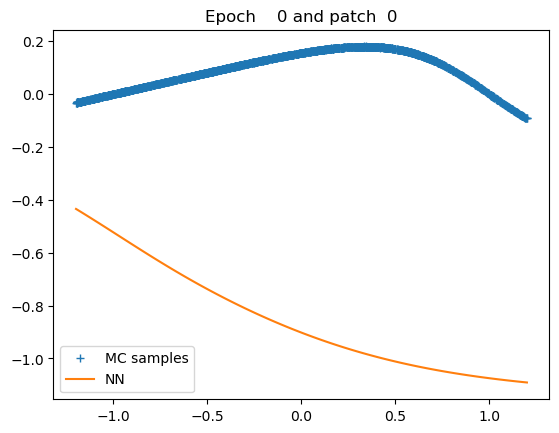

Patch  0: epoch  500 with loss 1.53E-06


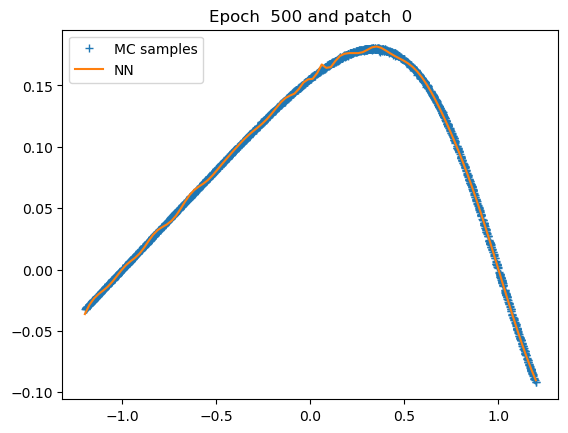

Patch  0: epoch 1000 with loss 6.09E-07


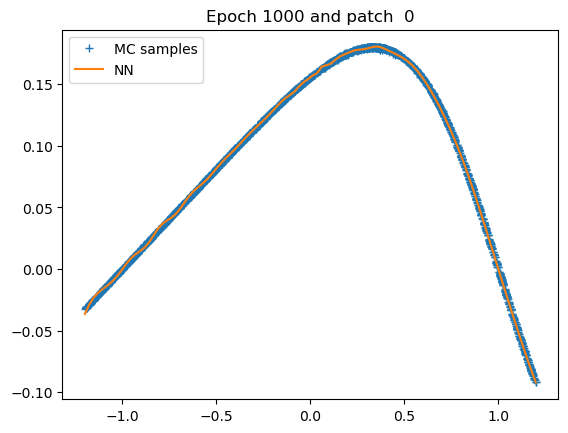

Patch  0: epoch 1500 with loss 5.69E-07


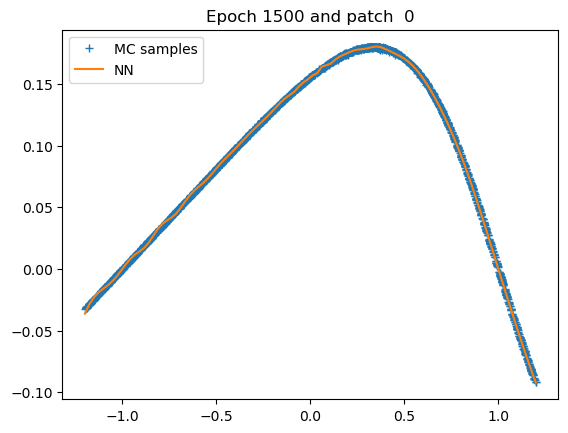

Patch  0: epoch 1999 with loss 5.24E-07


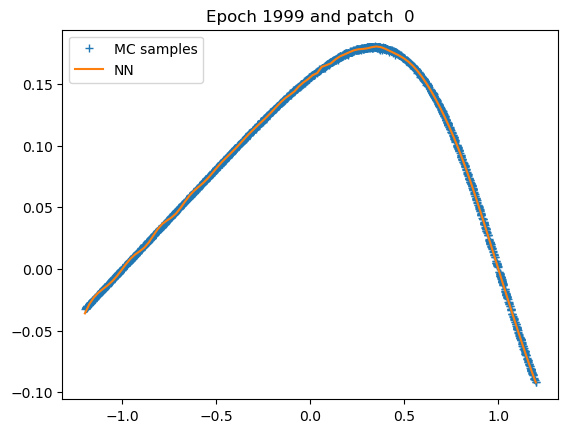

Patch 0: training of u with 2000 epochs take 18.61514639854431 seconds.
Patch 1: generation of u samples take 4.635711431503296 seconds.
Patch  1: epoch    0 with loss 1.68E+00


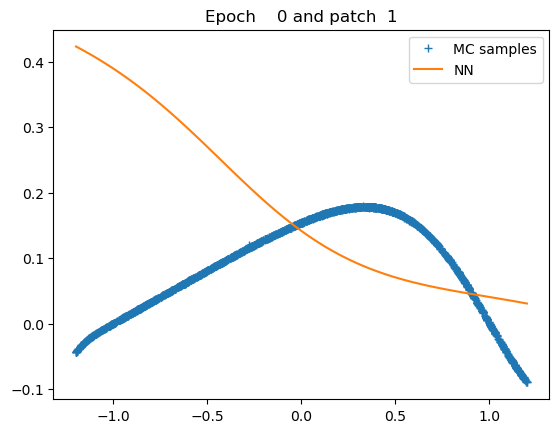

Patch  1: epoch  500 with loss 3.06E-06


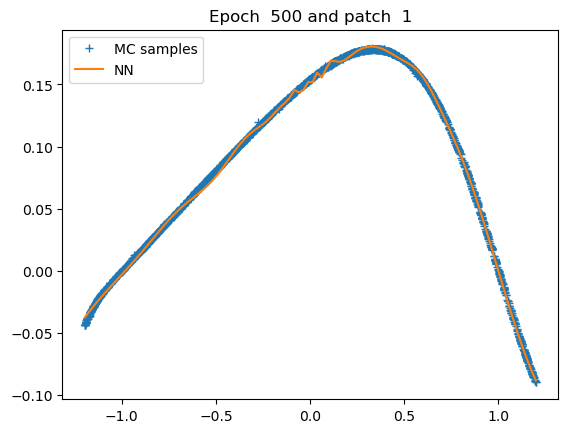

Patch  1: epoch 1000 with loss 2.24E-06


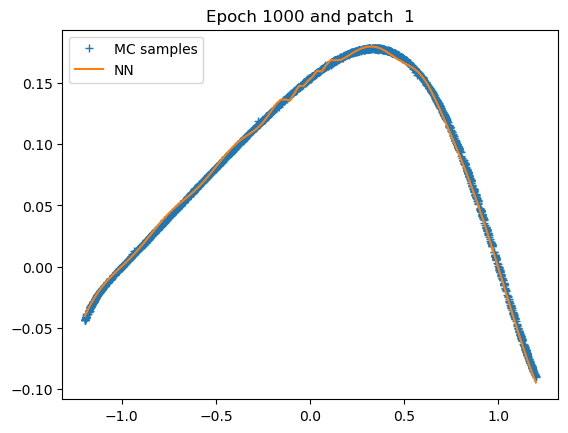

Patch  1: epoch 1500 with loss 1.34E-06


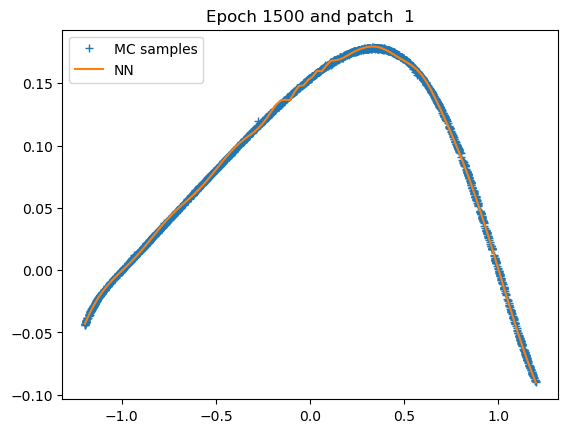

Patch  1: epoch 1999 with loss 9.02E-07


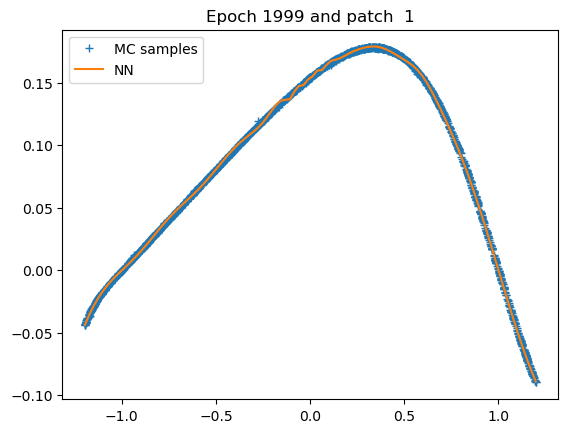

Patch 1: training of u with 2000 epochs take 15.006505966186523 seconds.
Patch 2: generation of u samples take 4.262171983718872 seconds.
Patch  2: epoch    0 with loss 9.73E-01


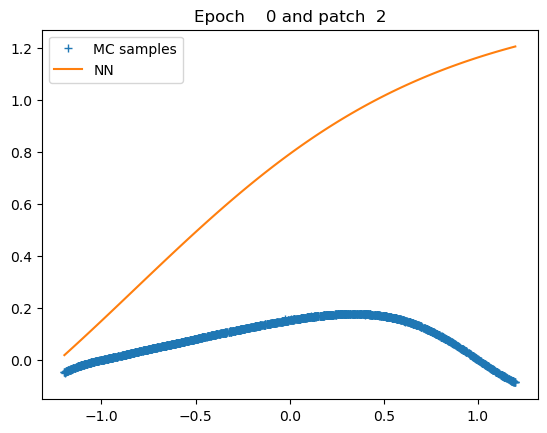

Patch  2: epoch  500 with loss 4.23E-06


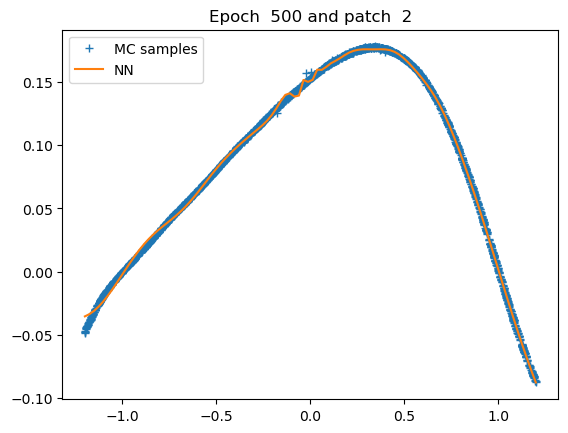

Patch  2: epoch 1000 with loss 1.31E-06


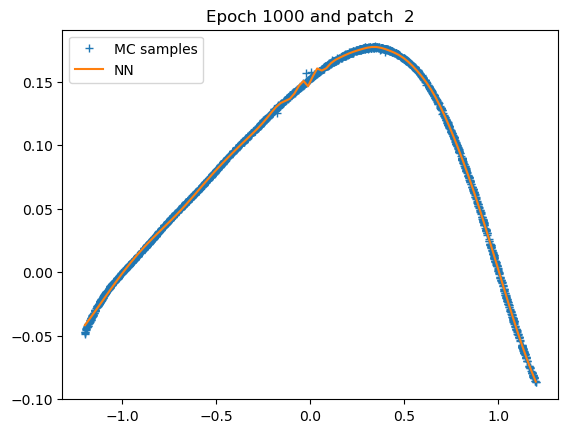

Patch  2: epoch 1500 with loss 1.08E-06


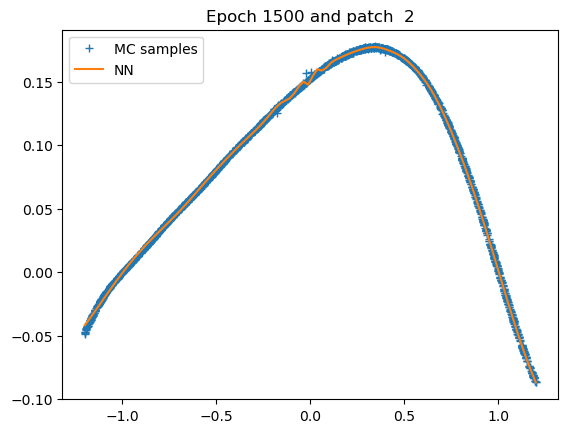

Patch  2: epoch 1999 with loss 8.80E-07


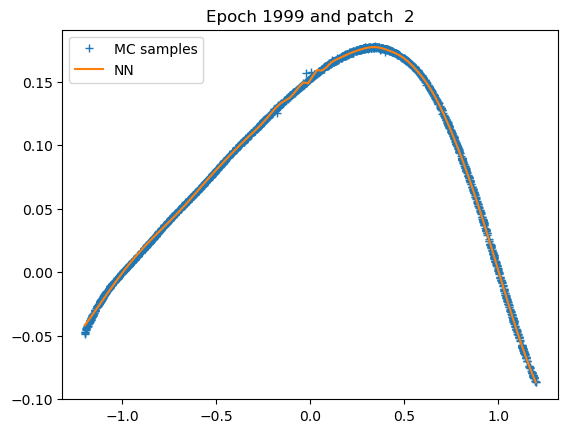

Patch 2: training of u with 2000 epochs take 12.807573795318604 seconds.
Patch 3: generation of u samples take 3.1766703128814697 seconds.
Patch  3: epoch    0 with loss 2.65E+00


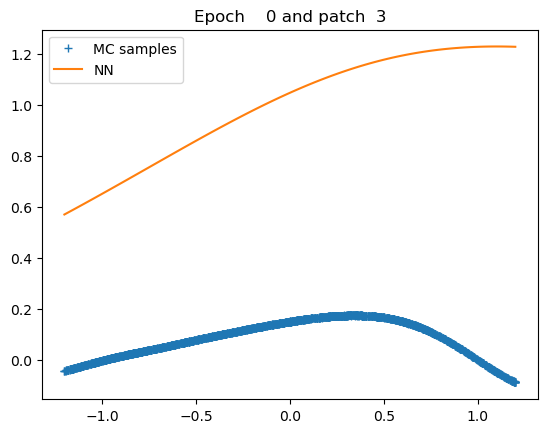

Patch  3: epoch  500 with loss 1.44E-06


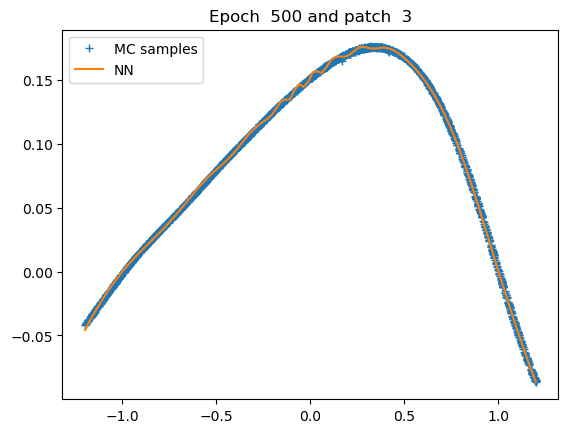

Patch  3: epoch 1000 with loss 8.25E-07


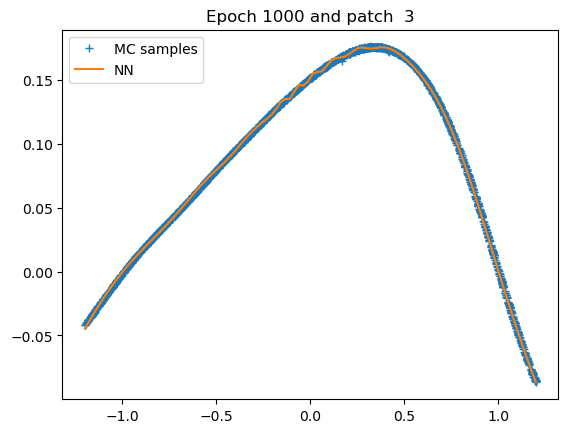

Patch  3: epoch 1500 with loss 7.71E-07


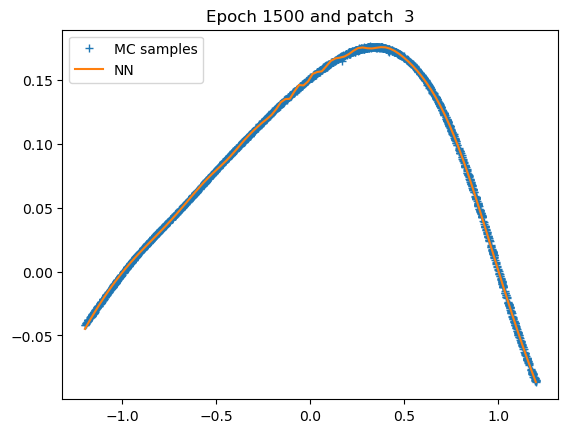

Patch  3: epoch 1999 with loss 7.06E-07


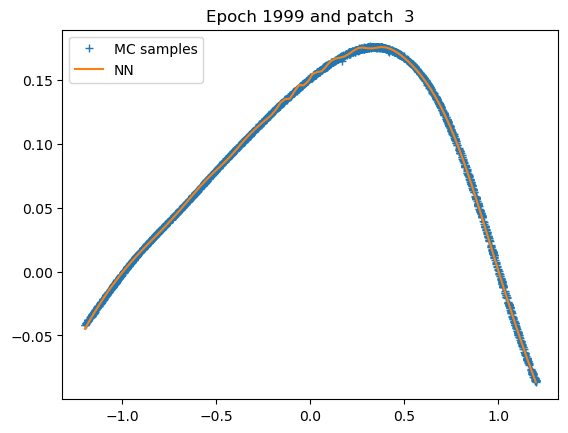

Patch 3: training of u with 2000 epochs take 14.309077501296997 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 76 seconds; L1 error: 3.24E-03; L2 error: 2.05E-05; rel error: INF.
fdb runtime: 0 seconds; total runtime: 76 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


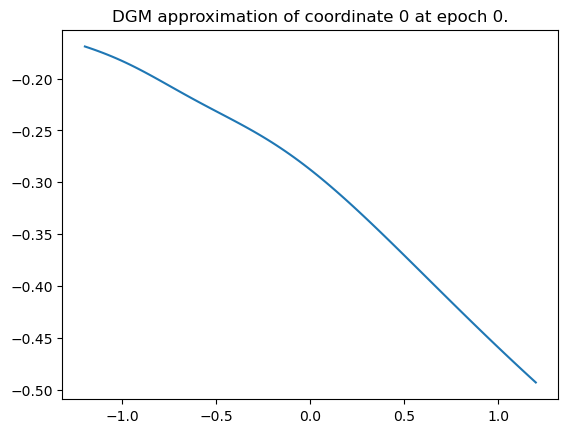

Epoch 0 with loss 0.7532459497451782


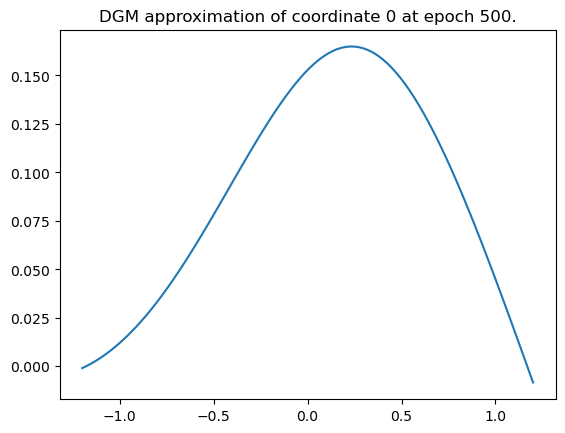

Epoch 500 with loss 0.0006144876824691892


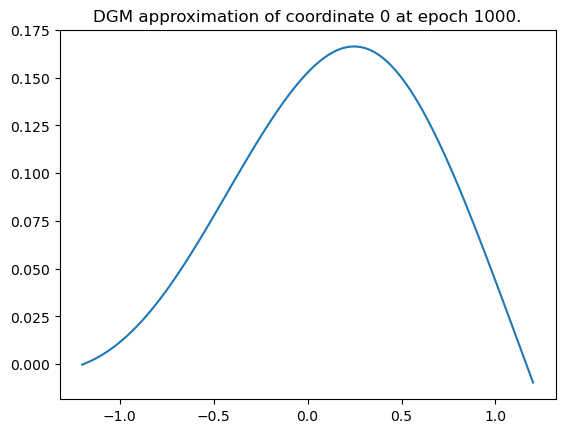

Epoch 1000 with loss 0.0005676369182765484


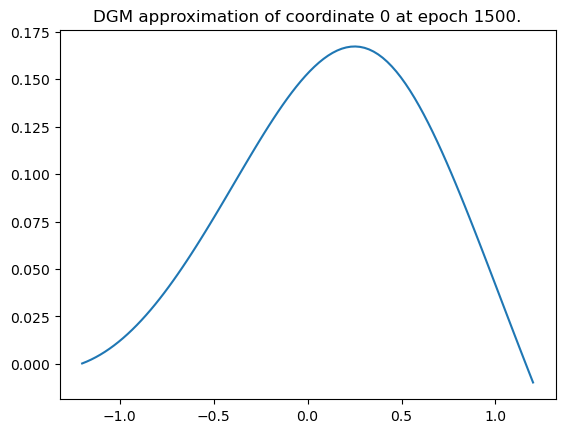

Epoch 1500 with loss 0.0005505753215402365


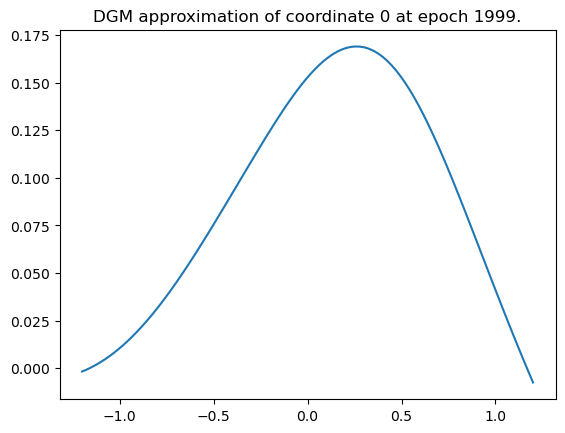

Epoch 1999 with loss 0.00047622097190469503
Training of neural network with 2000 epochs take 69.21212196350098 seconds.


Time taken: 69 seconds; L1 error: 5.37E-03; L2 error: 8.47E-05; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


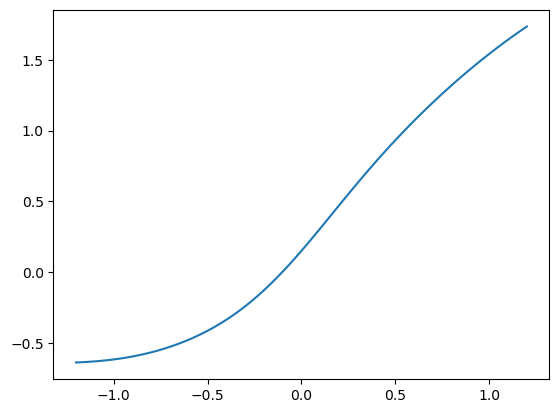

Epoch 0 with loss 0.7366040349006653


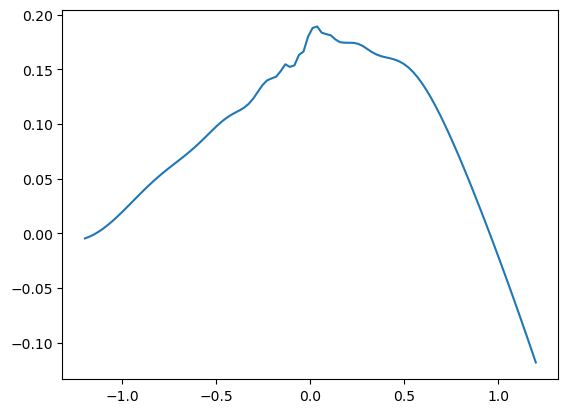

Epoch 500 with loss 0.002745019970461726


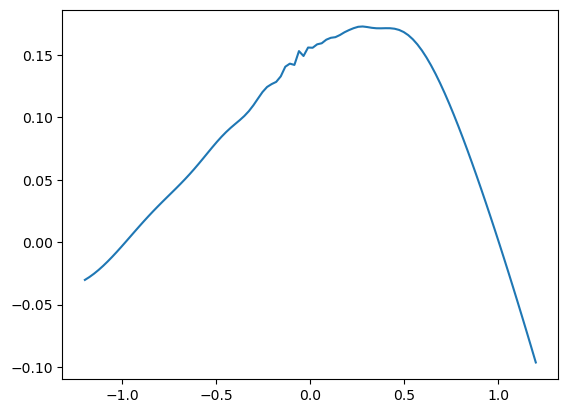

Epoch 1000 with loss 2.9858705602237023e-05


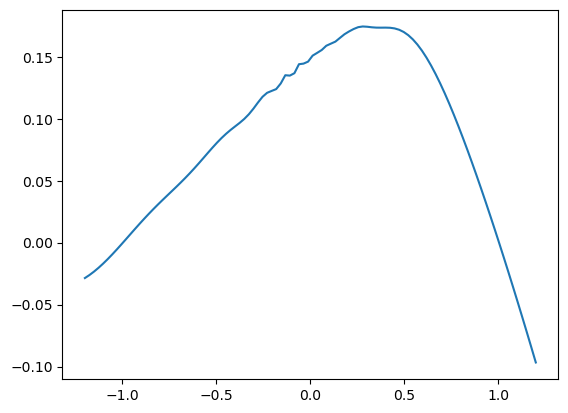

Epoch 1500 with loss 1.9676712327054702e-05


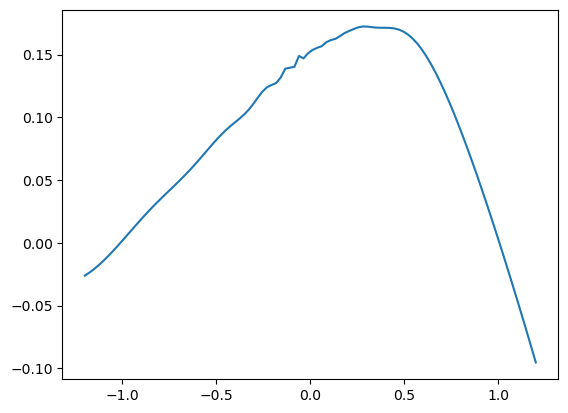

Epoch 1999 with loss 5.339482595445588e-05
Training of neural network with 2000 epochs take 91.71157097816467 seconds.
Time taken: 92 seconds; L1 error: 3.53E-03; L2 error: 1.87E-05; rel error: INF.




######## Summary for deep branching method
runtime:        76
fdb runtime:    0
total runtime:  76
mean L1 error:  3.24E-03
std L1 error:   0.00E+00
mean L2 error:  2.05E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        69
mean L1 error:  5.37E-03
std L1 error:   0.00E+00
mean L2 error:  8.47E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        92
mean L1 error:  3.53E-03
std L1 error:   0.00E+00
mean L2 error:  1.87E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


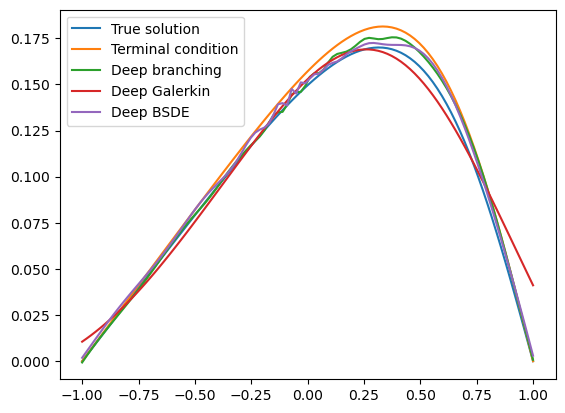

In [6]:
dim = 1
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True,                     
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=2000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=4, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 2

Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


#### Starting deep branching method with seed 0 - 1 out of 1 times


Patch 0: generation of u samples take 54.054070711135864 seconds.
Patch  0: epoch    0 with loss 6.89E-01


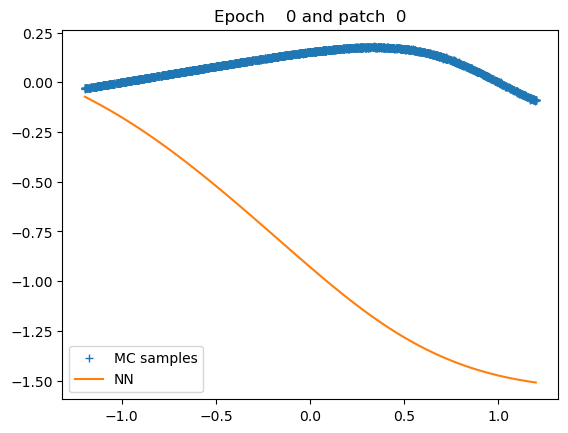

Patch  0: epoch  500 with loss 2.74E-06


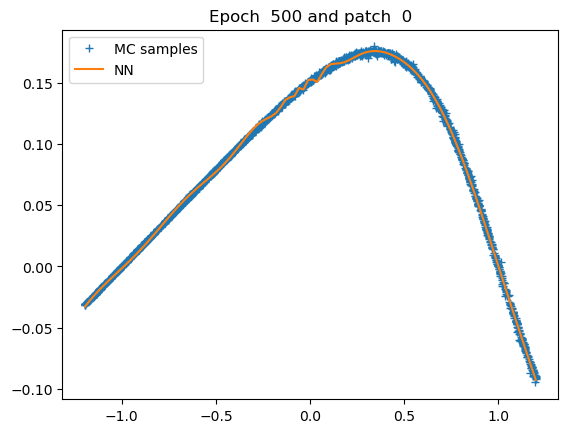

Patch  0: epoch 1000 with loss 1.75E-06


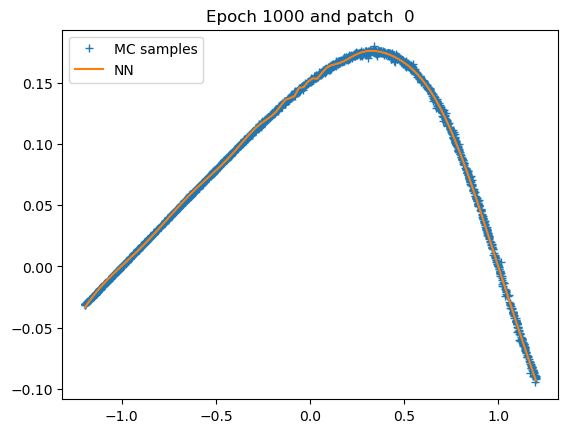

Patch  0: epoch 1500 with loss 1.71E-06


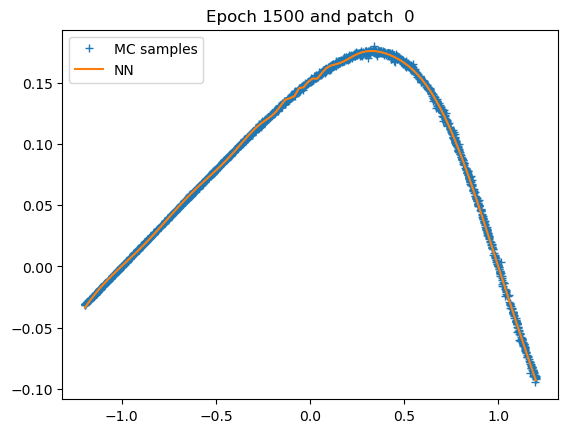

Patch  0: epoch 2000 with loss 1.65E-06


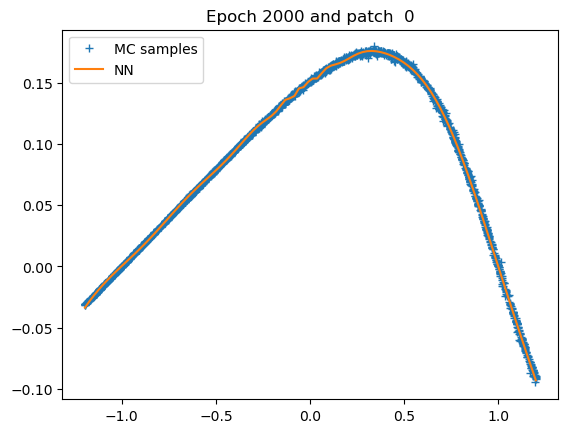

Patch  0: epoch 2500 with loss 1.65E-06


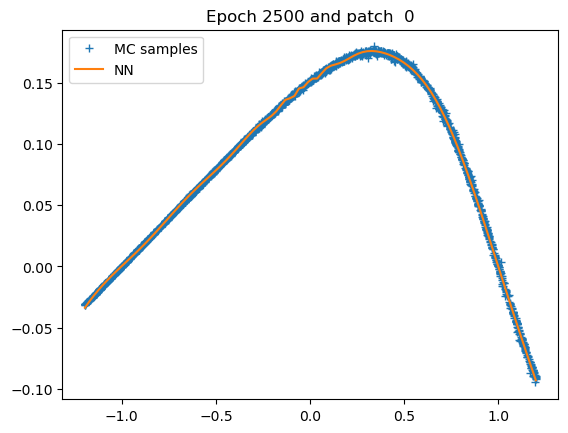

Patch  0: epoch 3000 with loss 1.64E-06


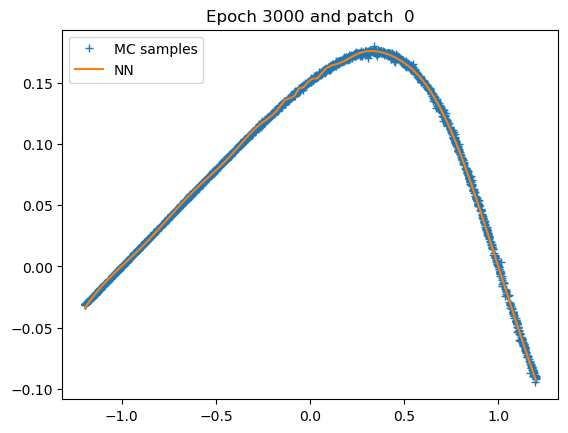

Patch  0: epoch 3500 with loss 1.63E-06


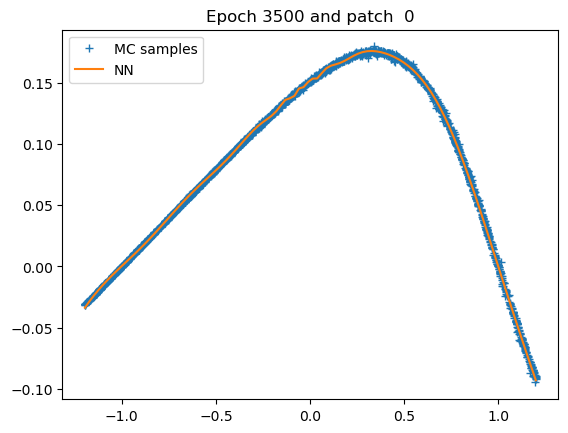

Patch  0: epoch 4000 with loss 1.62E-06


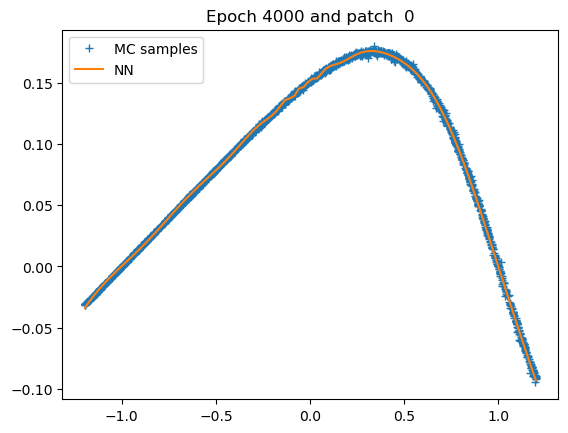

Patch  0: epoch 4500 with loss 1.60E-06


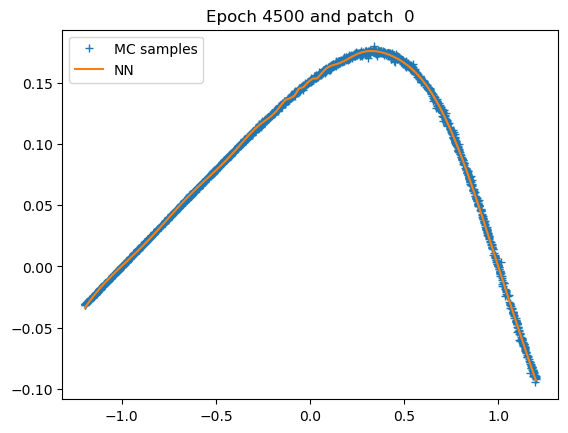

Patch  0: epoch 4999 with loss 1.58E-06


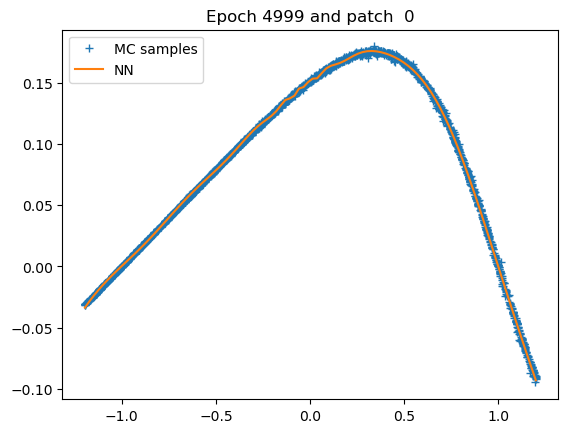

Patch 0: training of u with 5000 epochs take 38.02405118942261 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 92 seconds; L1 error: 3.13E-03; L2 error: 1.89E-05; rel error: INF.
fdb runtime: 0 seconds; total runtime: 92 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


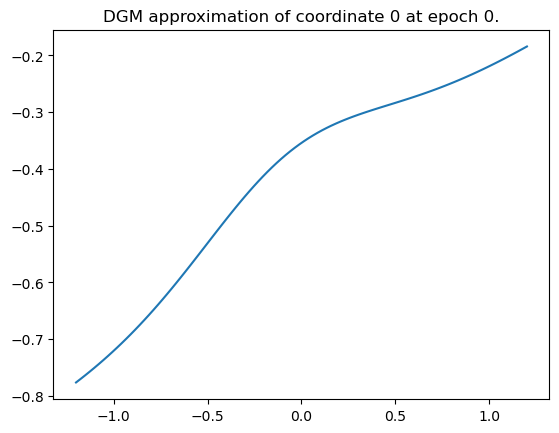

Epoch 0 with loss 2.765511989593506


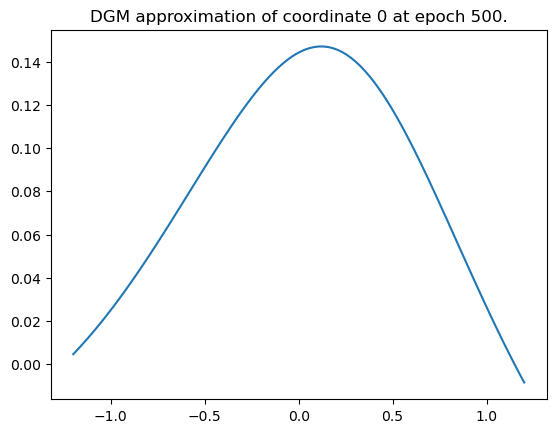

Epoch 500 with loss 0.00643905671313405


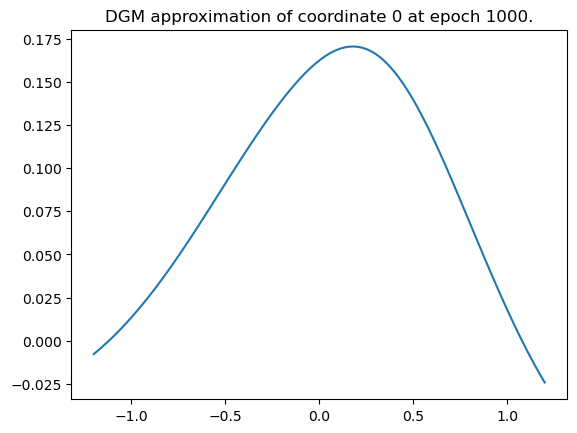

Epoch 1000 with loss 0.0051495907828211784


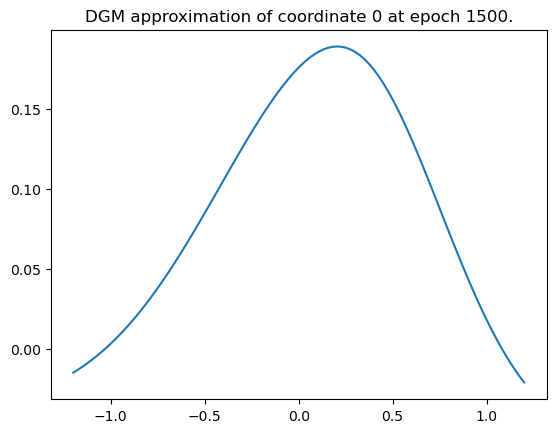

Epoch 1500 with loss 0.0045266952365636826


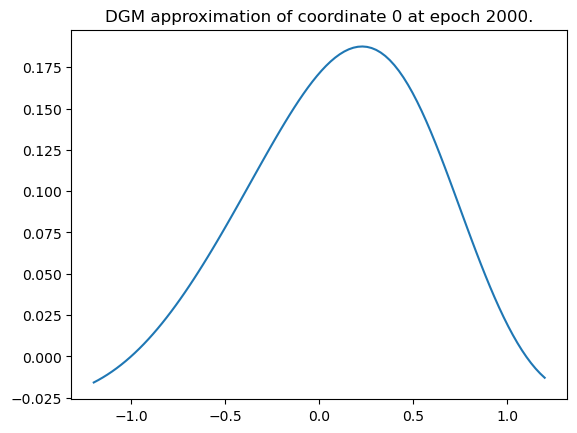

Epoch 2000 with loss 0.0038538705557584763


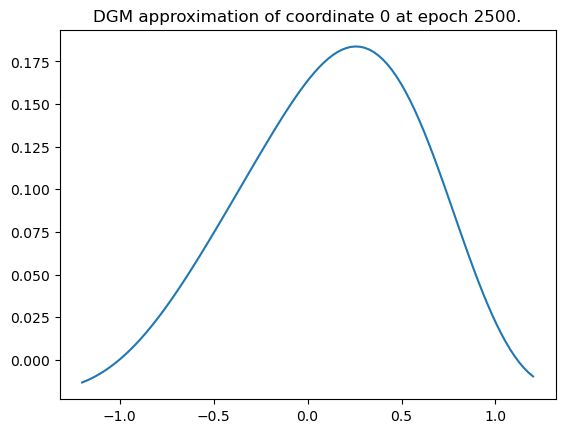

Epoch 2500 with loss 0.0035480819642543793


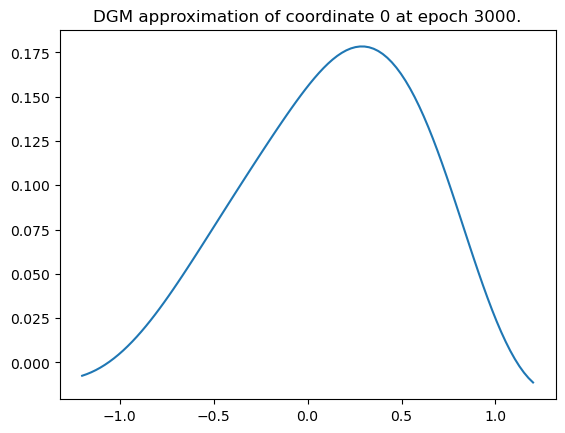

Epoch 3000 with loss 0.003152988851070404


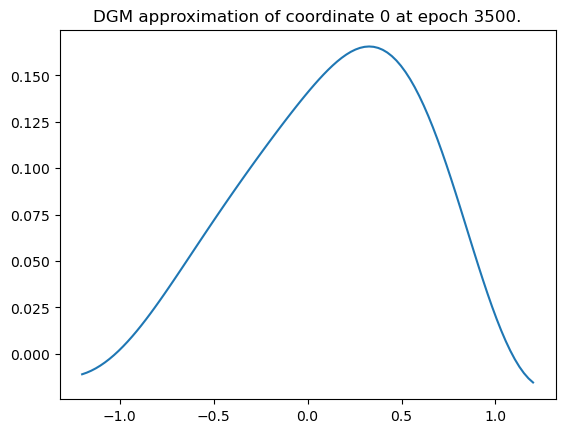

Epoch 3500 with loss 0.002805134281516075


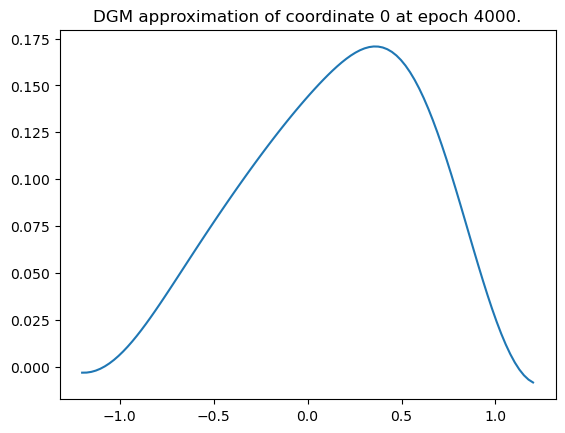

Epoch 4000 with loss 0.0024775436613708735


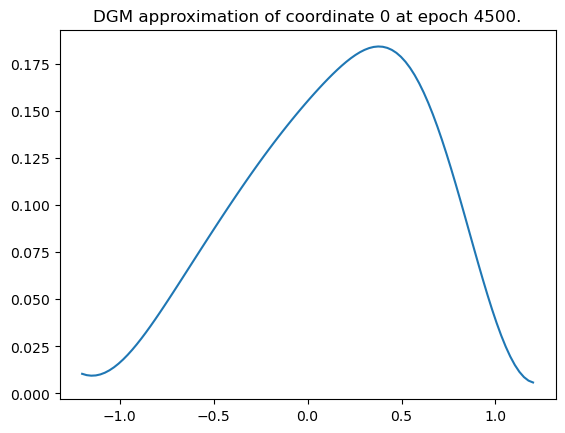

Epoch 4500 with loss 0.002532796934247017


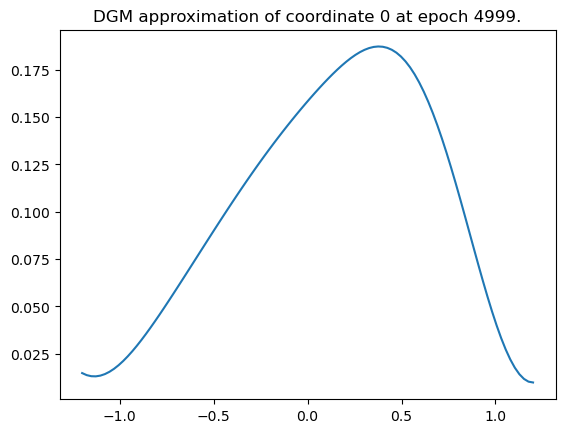

Epoch 4999 with loss 0.002507452154532075
Training of neural network with 5000 epochs take 256.168799161911 seconds.


Time taken: 256 seconds; L1 error: 1.63E-02; L2 error: 3.26E-04; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


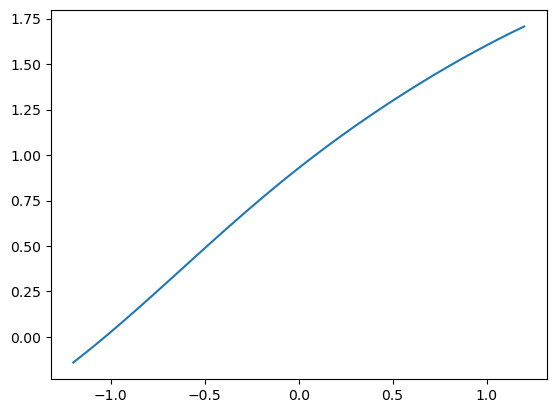

Epoch 0 with loss 0.8213662505149841


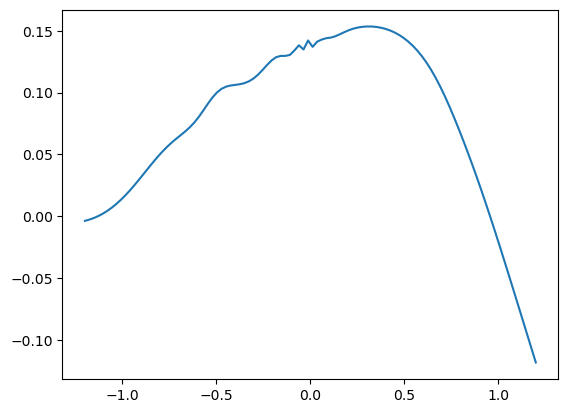

Epoch 500 with loss 0.0010509858839213848


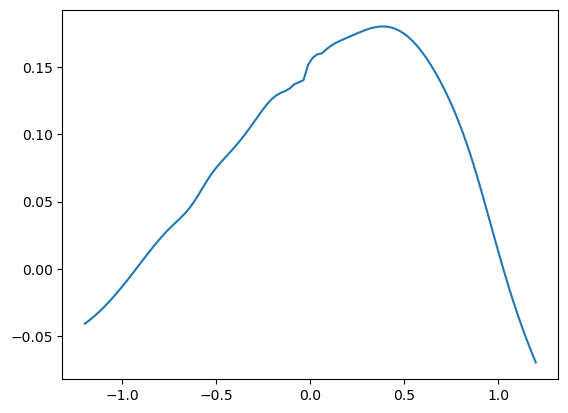

Epoch 1000 with loss 0.0014658827567473054


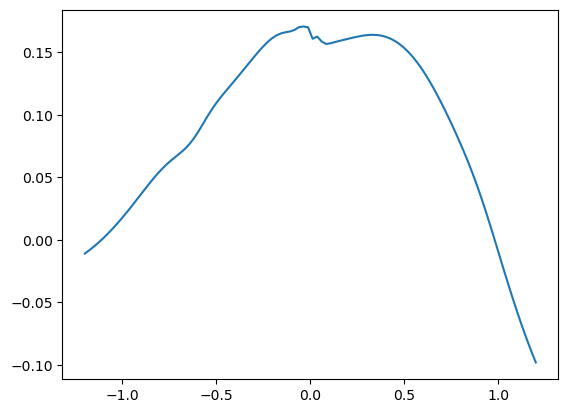

Epoch 1500 with loss 0.0007319708820432425


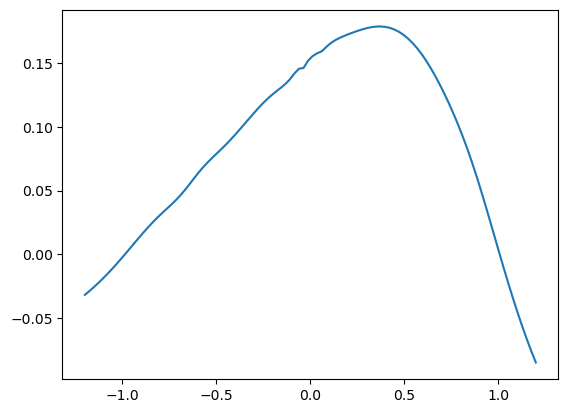

Epoch 2000 with loss 3.820979327429086e-05


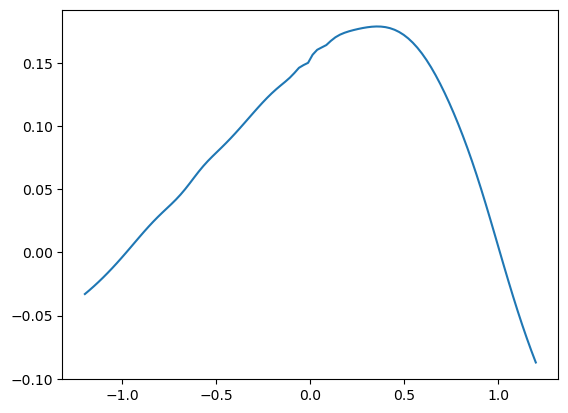

Epoch 2500 with loss 8.119313861243427e-05


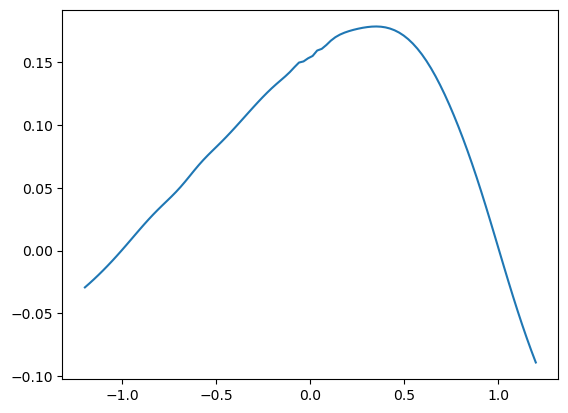

Epoch 3000 with loss 7.345676567638293e-05


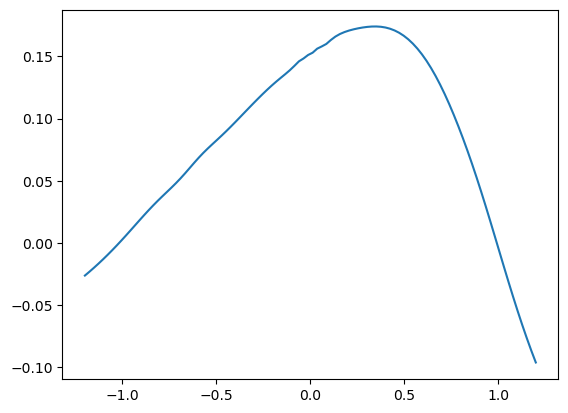

Epoch 3500 with loss 9.437801782041788e-05


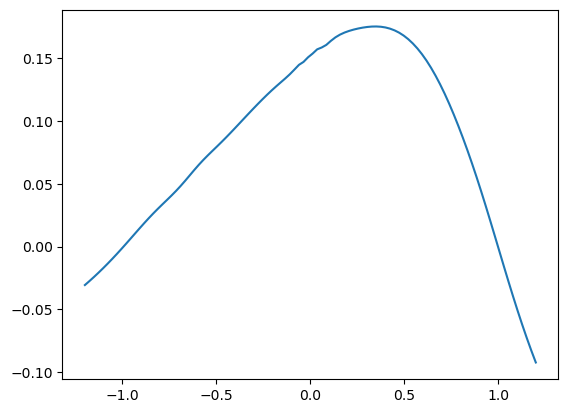

Epoch 4000 with loss 7.578949589515105e-05


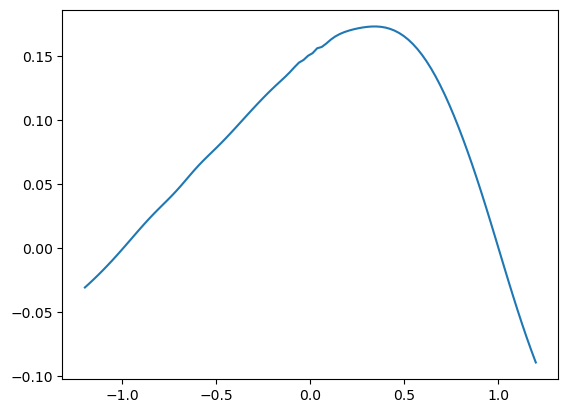

Epoch 4500 with loss 3.4722535929176956e-05


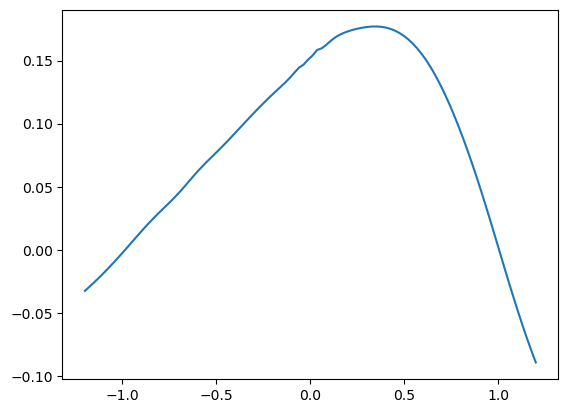

Epoch 4999 with loss 2.1958821889711544e-05
Training of neural network with 5000 epochs take 238.89125180244446 seconds.
Time taken: 239 seconds; L1 error: 4.57E-03; L2 error: 3.33E-05; rel error: INF.




######## Summary for deep branching method
runtime:        92
fdb runtime:    0
total runtime:  92
mean L1 error:  3.13E-03
std L1 error:   0.00E+00
mean L2 error:  1.89E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        256
mean L1 error:  1.63E-02
std L1 error:   0.00E+00
mean L2 error:  3.26E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        239
mean L1 error:  4.57E-03
std L1 error:   0.00E+00
mean L2 error:  3.33E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


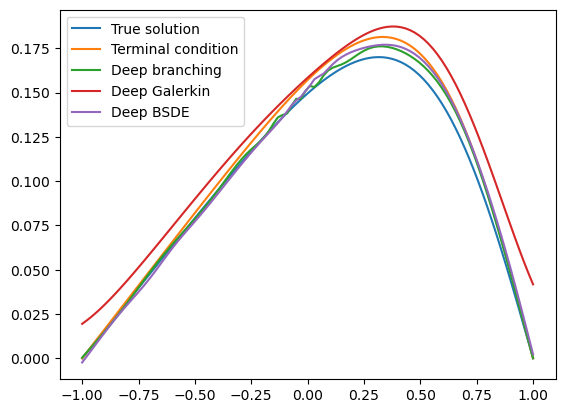

In [7]:
dim = 2
T=0.1/dim

grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 3

Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


#### Starting deep branching method with seed 0 - 1 out of 1 times


Patch 0: generation of u samples take 109.55430340766907 seconds.
Patch  0: epoch    0 with loss 3.05E+00


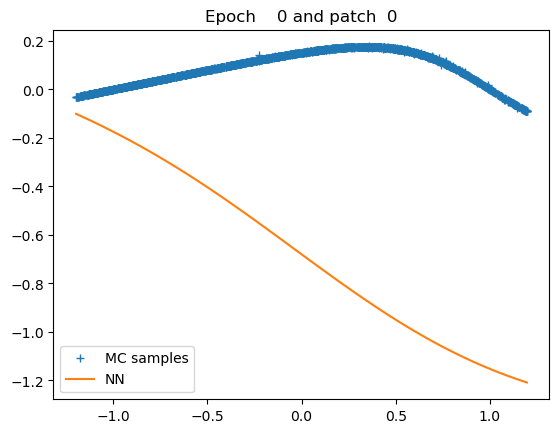

Patch  0: epoch  500 with loss 4.90E-06


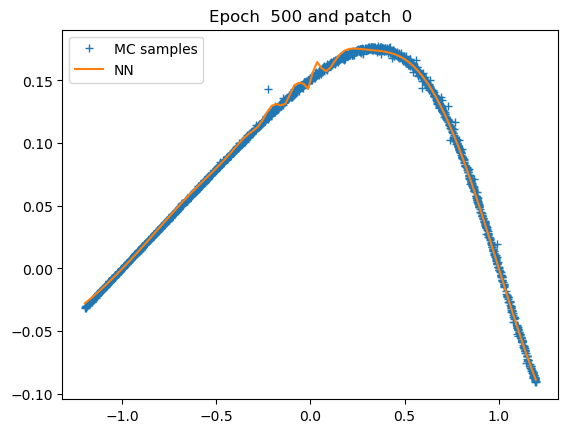

Patch  0: epoch 1000 with loss 2.20E-06


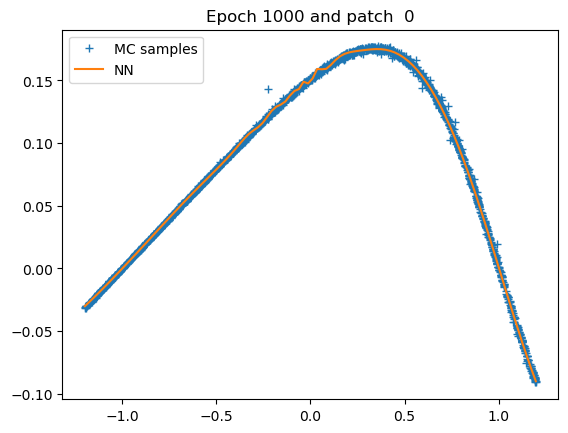

Patch  0: epoch 1500 with loss 2.13E-06


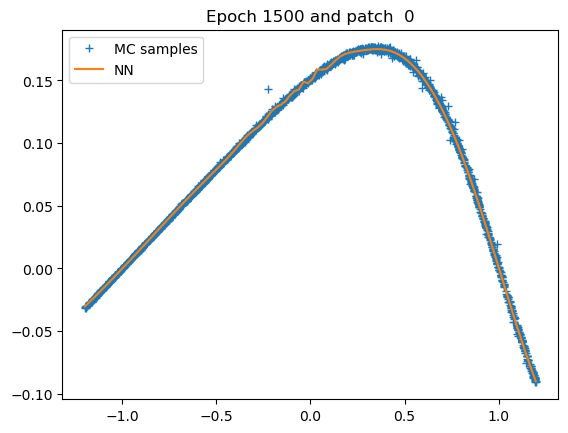

Patch  0: epoch 2000 with loss 2.07E-06


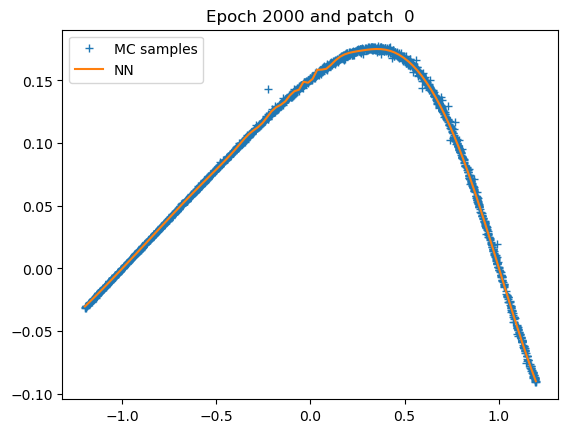

Patch  0: epoch 2500 with loss 2.06E-06


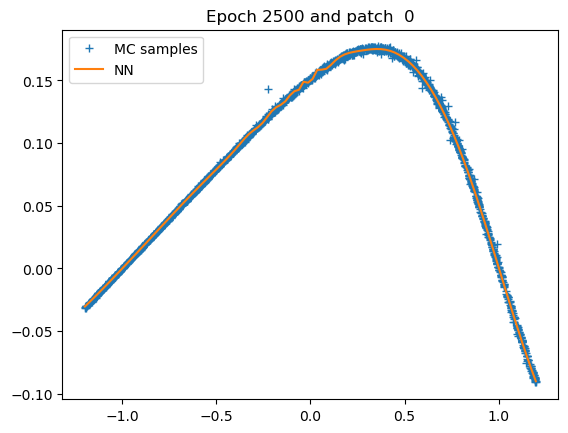

Patch  0: epoch 3000 with loss 2.05E-06


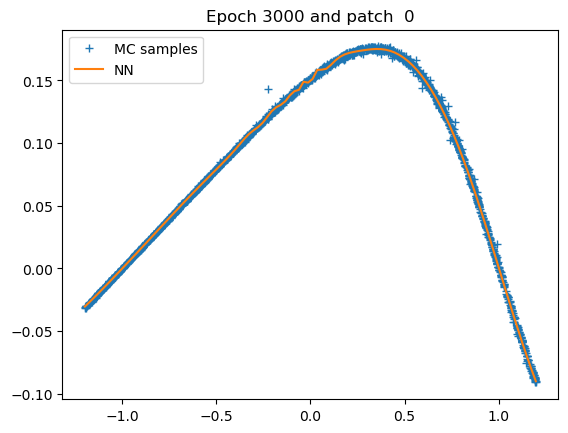

Patch  0: epoch 3500 with loss 2.04E-06


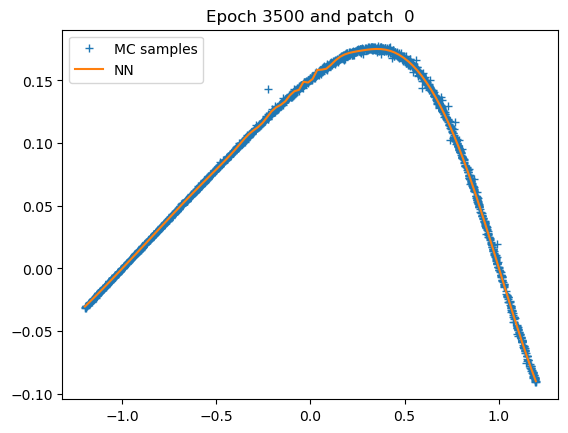

Patch  0: epoch 4000 with loss 2.03E-06


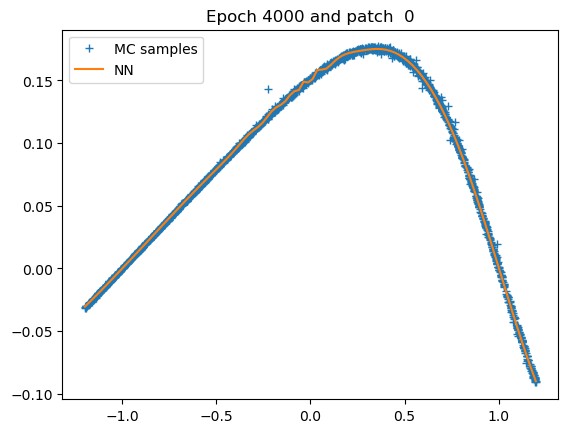

Patch  0: epoch 4500 with loss 2.01E-06


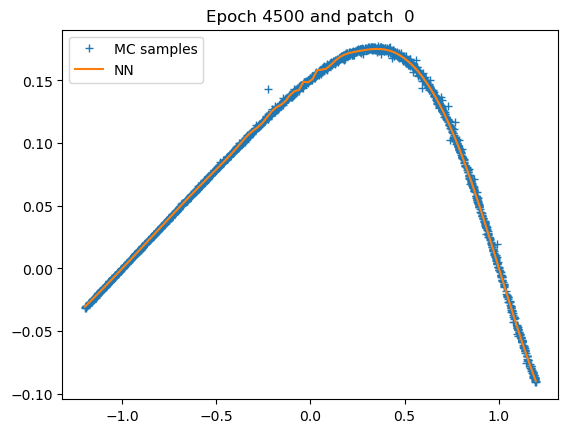

Patch  0: epoch 4999 with loss 2.00E-06


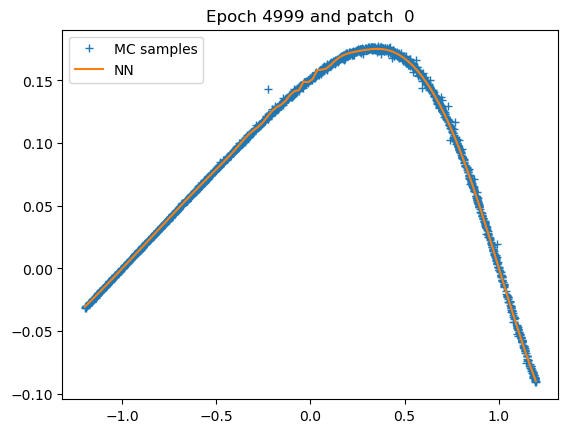

Patch 0: training of u with 5000 epochs take 43.45886421203613 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 151 seconds; L1 error: 3.14E-03; L2 error: 1.96E-05; rel error: INF.
fdb runtime: 2 seconds; total runtime: 153 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


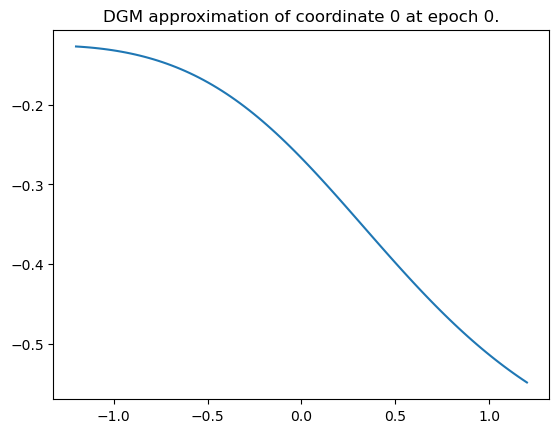

Epoch 0 with loss 0.9219703078269958


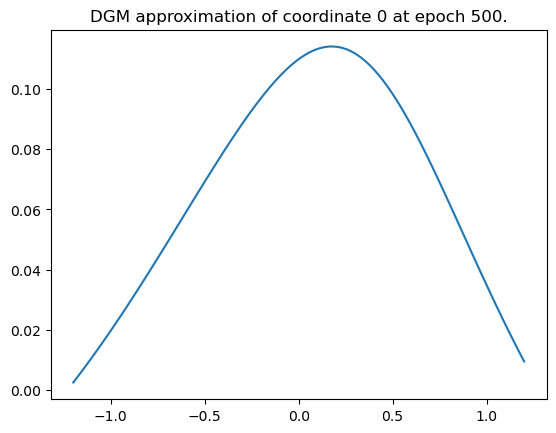

Epoch 500 with loss 0.00847416091710329


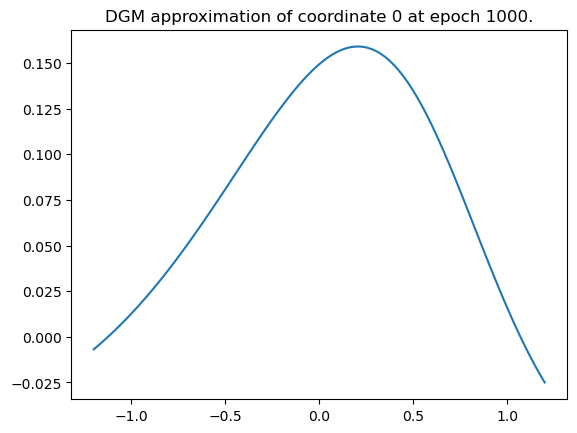

Epoch 1000 with loss 0.006433190777897835


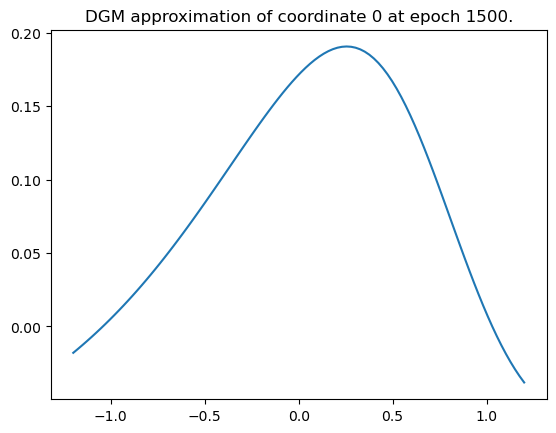

Epoch 1500 with loss 0.005471250507980585


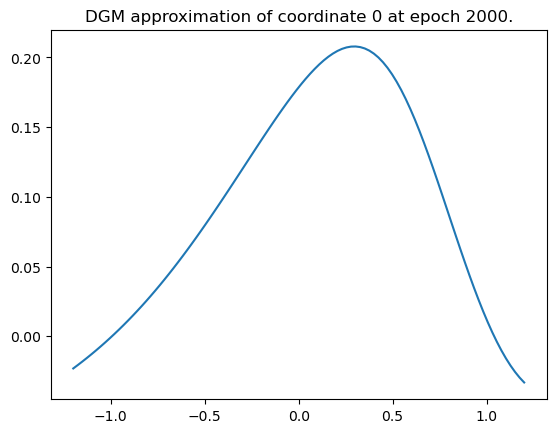

Epoch 2000 with loss 0.004799123853445053


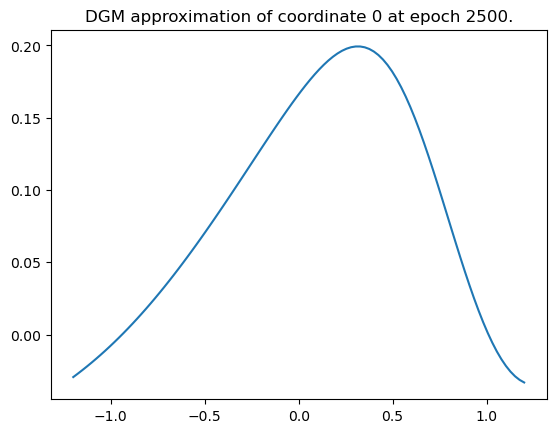

Epoch 2500 with loss 0.0045023271813988686


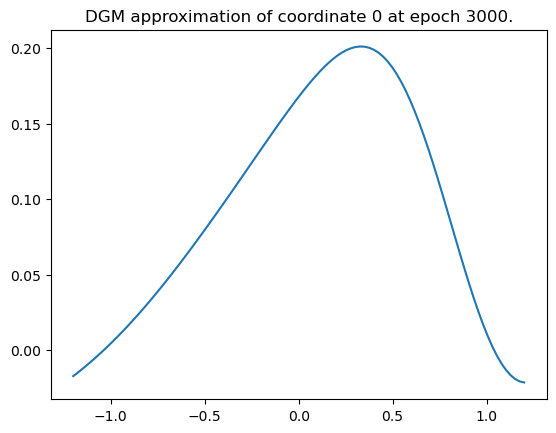

Epoch 3000 with loss 0.004084866028279066


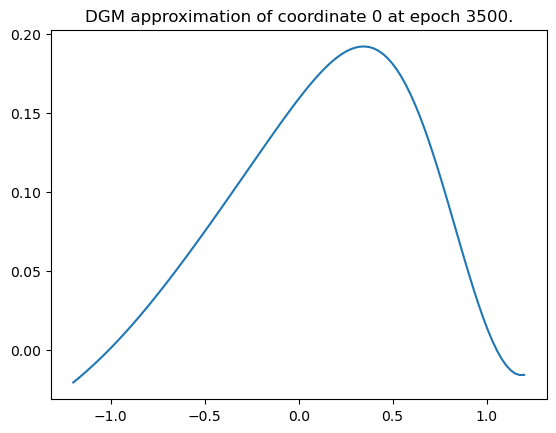

Epoch 3500 with loss 0.0037031671963632107


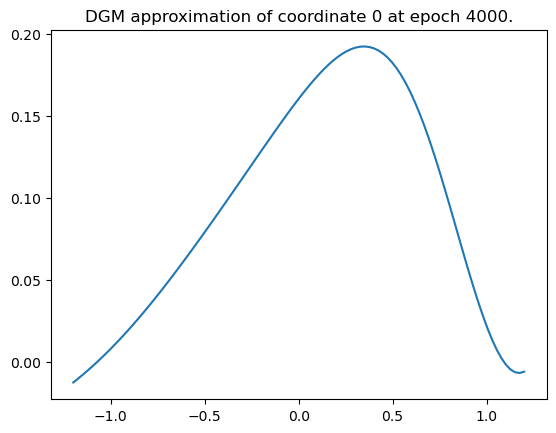

Epoch 4000 with loss 0.0035894557368010283


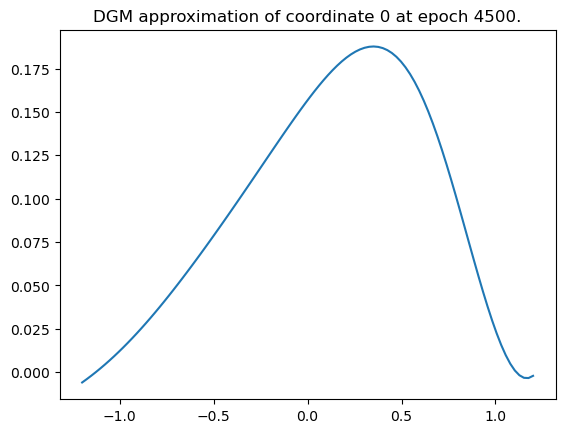

Epoch 4500 with loss 0.003627180587500334


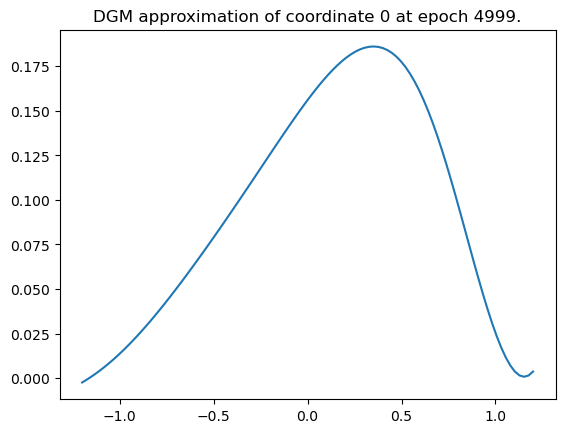

Epoch 4999 with loss 0.003304269164800644
Training of neural network with 5000 epochs take 330.7184398174286 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


Time taken: 331 seconds; L1 error: 9.15E-03; L2 error: 1.30E-04; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


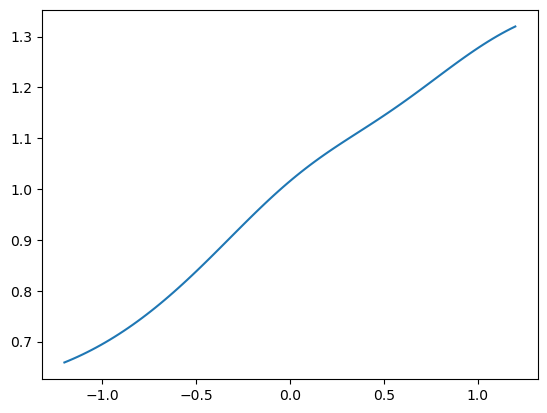

Epoch 0 with loss 0.8056908249855042


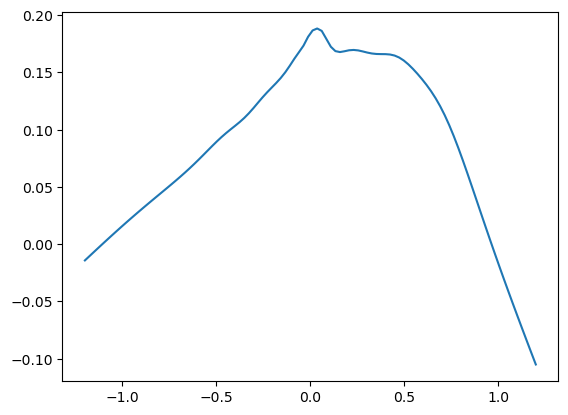

Epoch 500 with loss 0.00022440485190600157


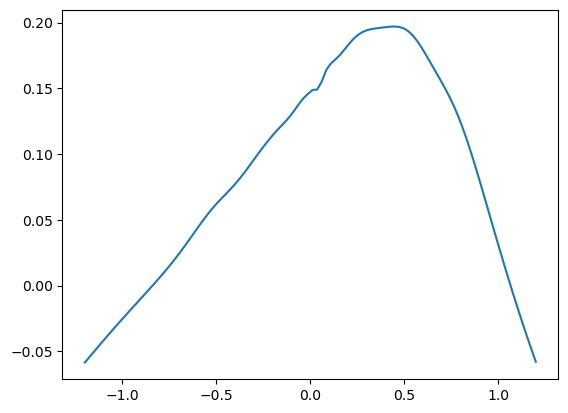

Epoch 1000 with loss 8.303143840748817e-05


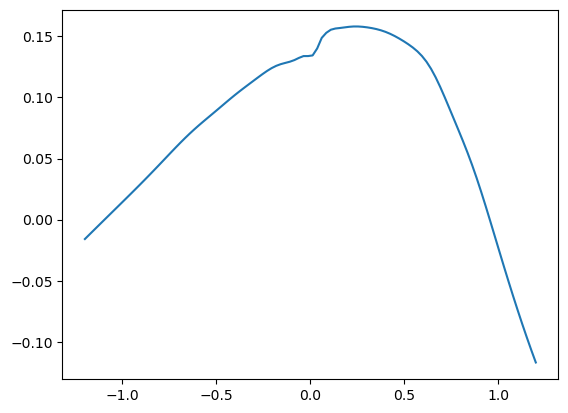

Epoch 1500 with loss 0.0002446327998768538


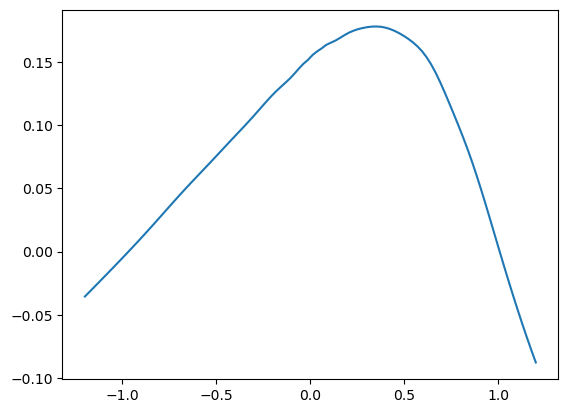

Epoch 2000 with loss 3.5691009543370456e-05


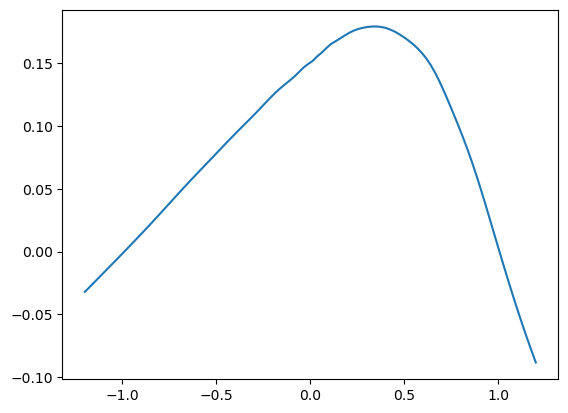

Epoch 2500 with loss 3.324895442347042e-05


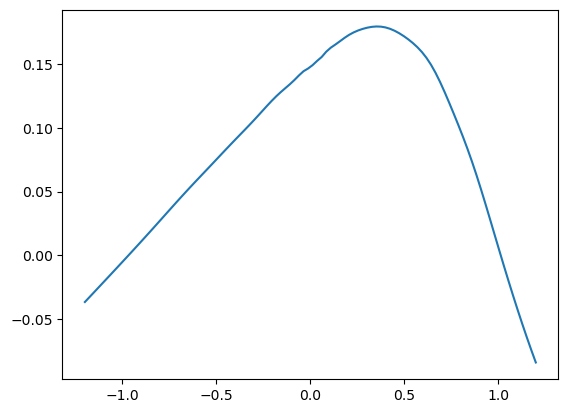

Epoch 3000 with loss 9.615265298634768e-05


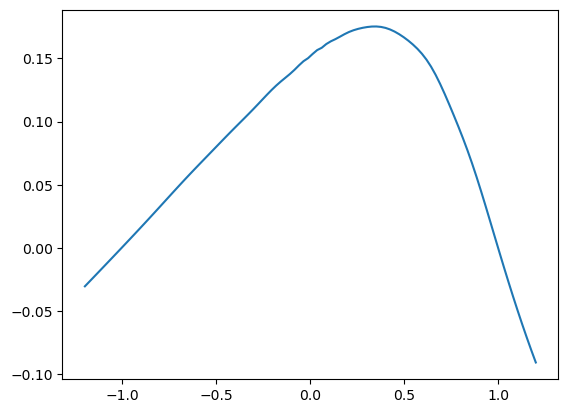

Epoch 3500 with loss 4.3453288526507095e-05


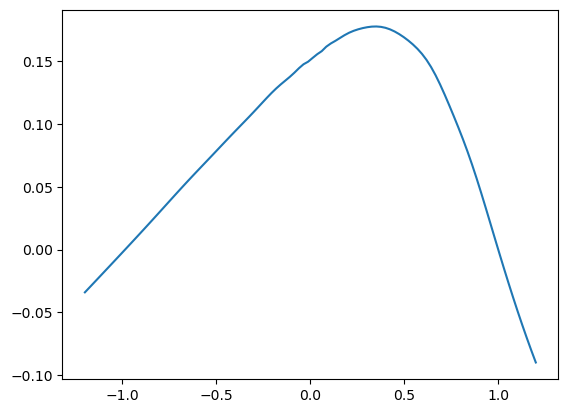

Epoch 4000 with loss 4.198043097858317e-05


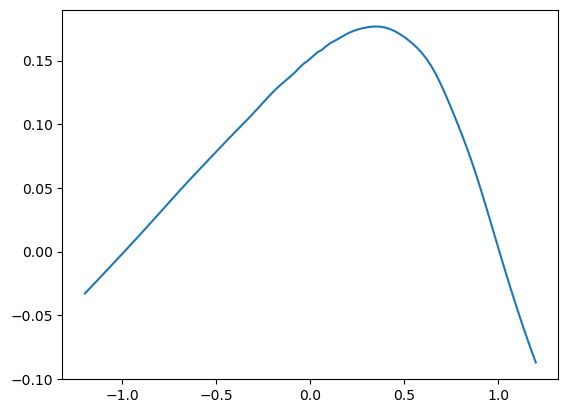

Epoch 4500 with loss 6.0316906456137076e-05


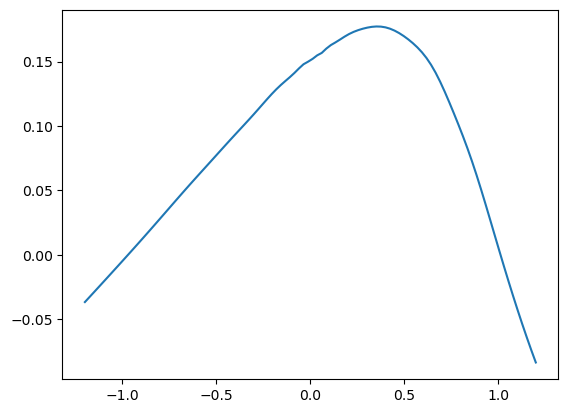

Epoch 4999 with loss 7.07335930201225e-05
Training of neural network with 5000 epochs take 236.87131810188293 seconds.
Time taken: 237 seconds; L1 error: 5.43E-03; L2 error: 4.77E-05; rel error: INF.




######## Summary for deep branching method
runtime:        151
fdb runtime:    2
total runtime:  153
mean L1 error:  3.14E-03
std L1 error:   0.00E+00
mean L2 error:  1.96E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        331
mean L1 error:  9.15E-03
std L1 error:   0.00E+00
mean L2 error:  1.30E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        237
mean L1 error:  5.43E-03
std L1 error:   0.00E+00
mean L2 error:  4.77E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


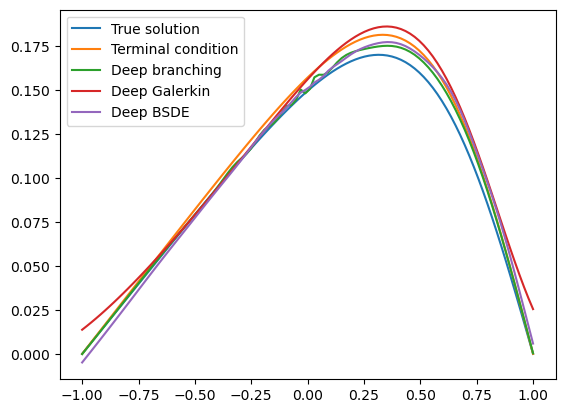

In [8]:
dim = 3
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 4

Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


#### Starting deep branching method with seed 0 - 1 out of 1 times


Patch 0: generation of u samples take 223.84653186798096 seconds.
Patch  0: epoch    0 with loss 1.03E-01


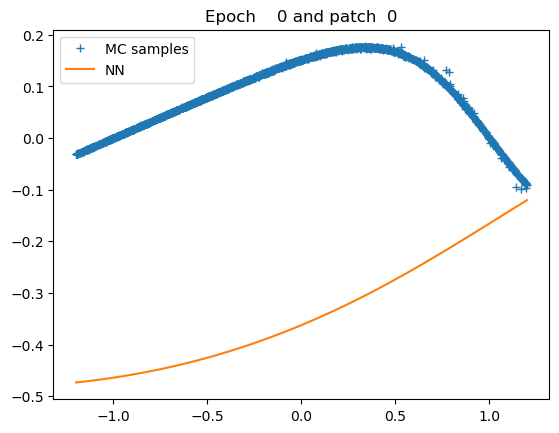

Patch  0: epoch  500 with loss 4.41E-06


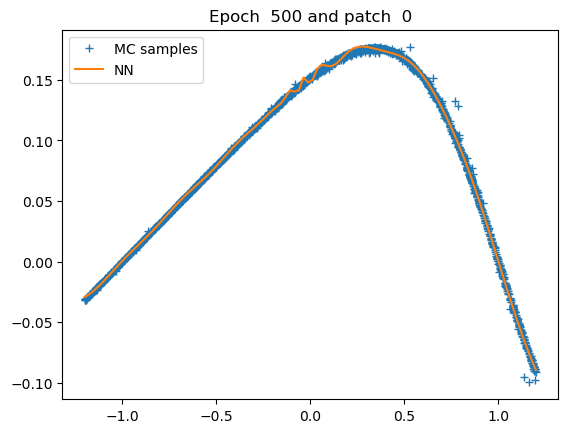

Patch  0: epoch 1000 with loss 3.63E-06


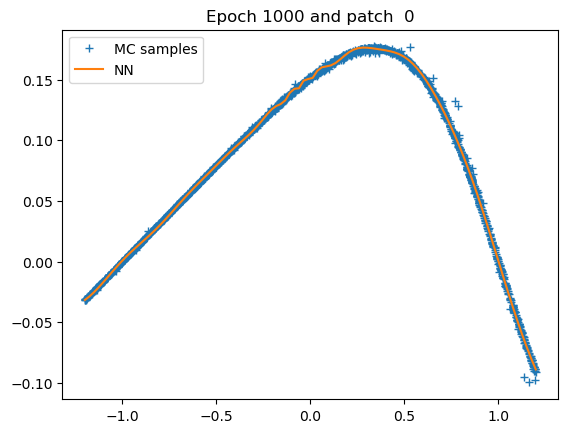

Patch  0: epoch 1500 with loss 3.33E-06


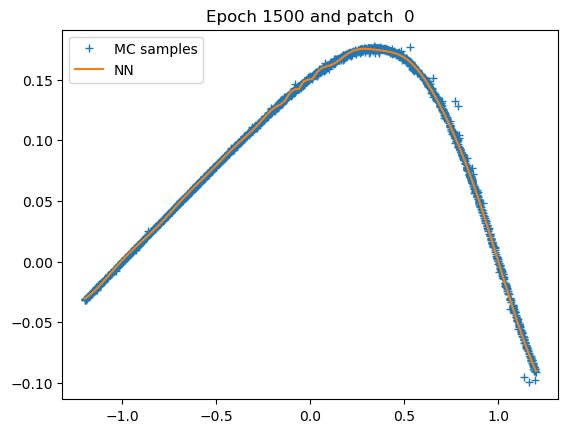

Patch  0: epoch 2000 with loss 3.24E-06


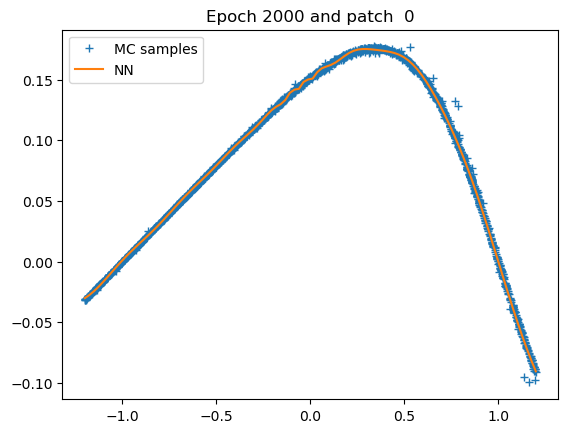

Patch  0: epoch 2500 with loss 3.23E-06


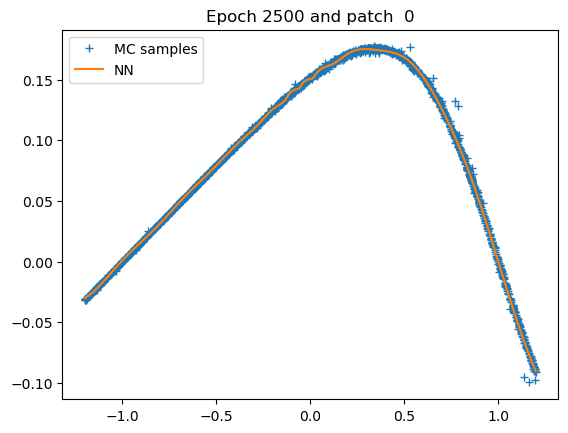

Patch  0: epoch 3000 with loss 3.22E-06


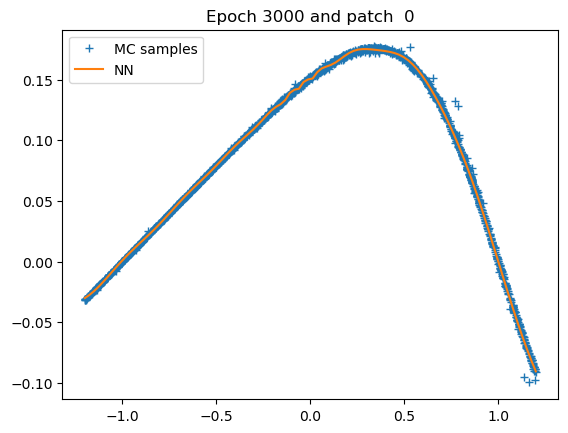

Patch  0: epoch 3500 with loss 3.21E-06


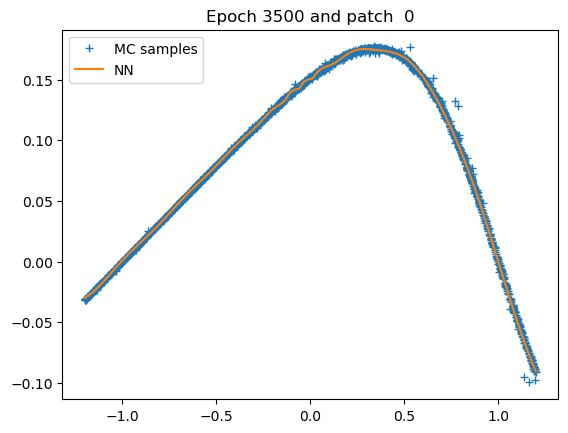

Patch  0: epoch 4000 with loss 3.19E-06


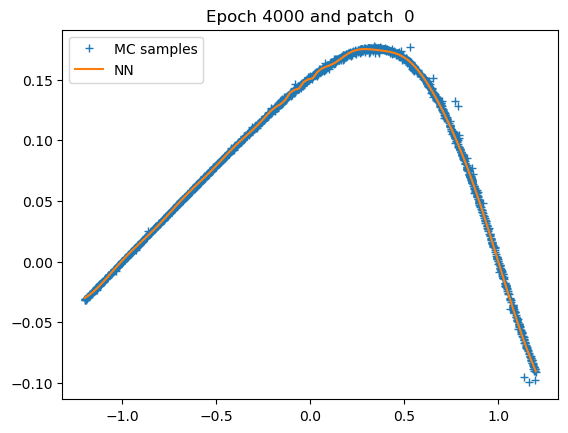

Patch  0: epoch 4500 with loss 3.18E-06


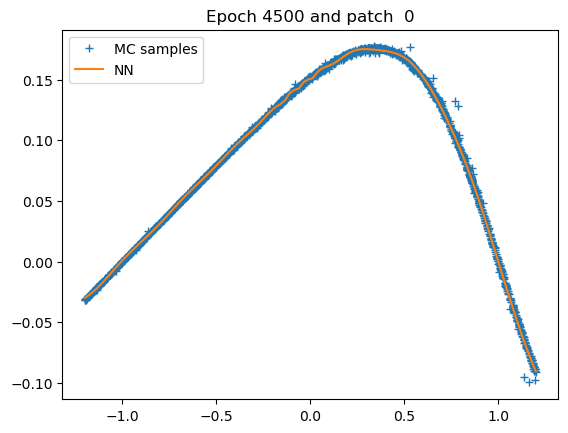

Patch  0: epoch 4999 with loss 3.16E-06


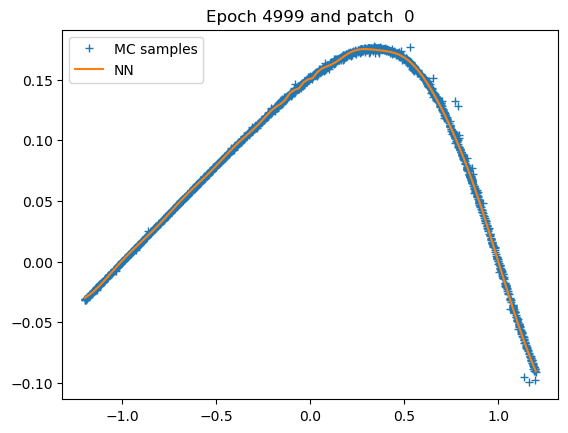

Patch 0: training of u with 5000 epochs take 40.68985557556152 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 255 seconds; L1 error: 3.13E-03; L2 error: 1.97E-05; rel error: INF.
fdb runtime: 9 seconds; total runtime: 265 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


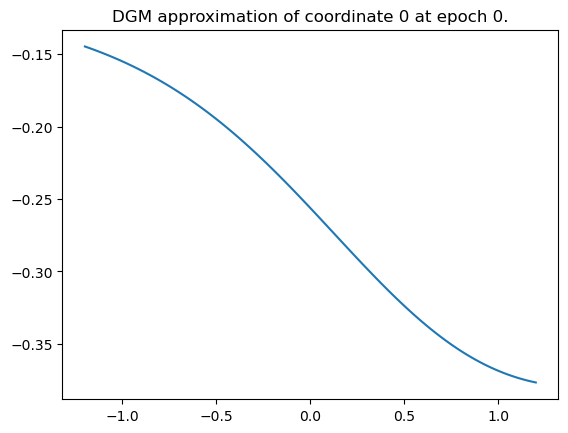

Epoch 0 with loss 0.5107811689376831


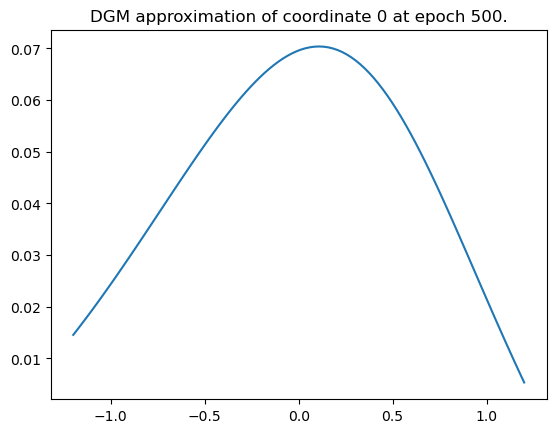

Epoch 500 with loss 0.011432499624788761


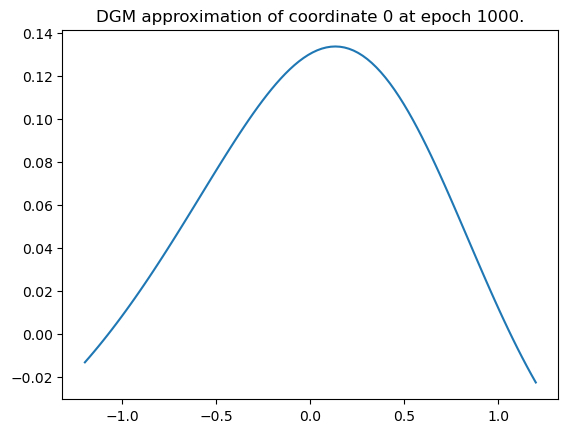

Epoch 1000 with loss 0.007803887128829956


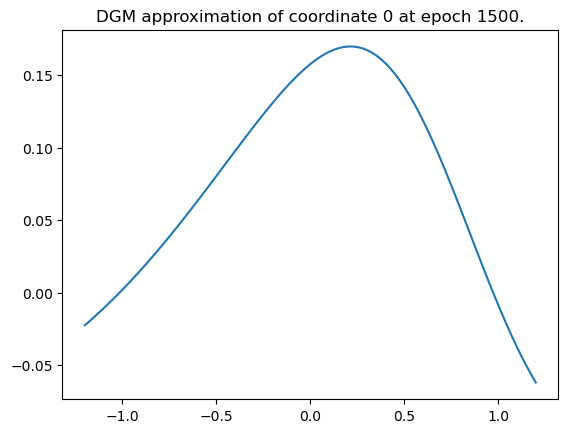

Epoch 1500 with loss 0.0066122994758188725


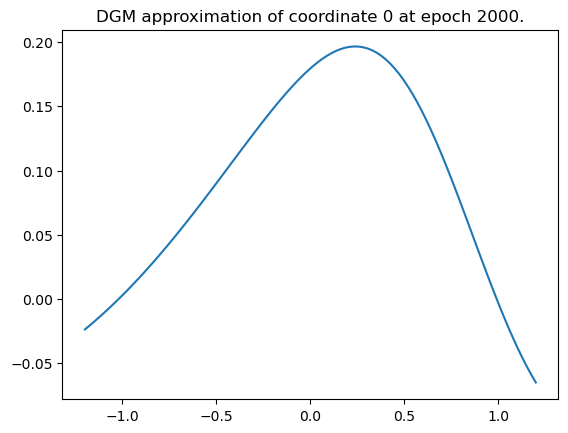

Epoch 2000 with loss 0.00622443575412035


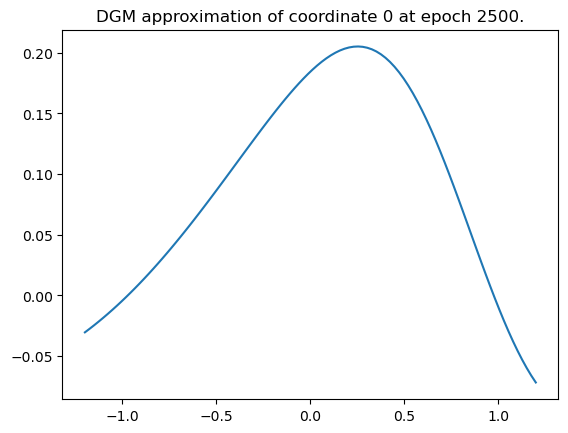

Epoch 2500 with loss 0.005796072538942099


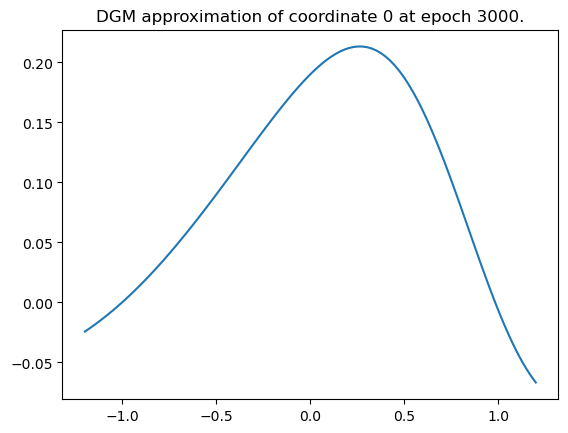

Epoch 3000 with loss 0.005605344660580158


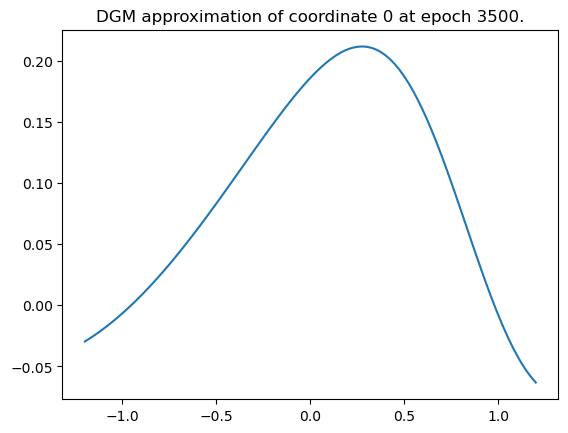

Epoch 3500 with loss 0.005434047430753708


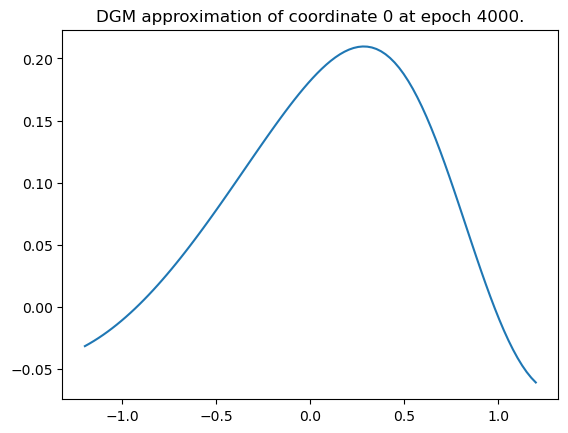

Epoch 4000 with loss 0.0052865613251924515


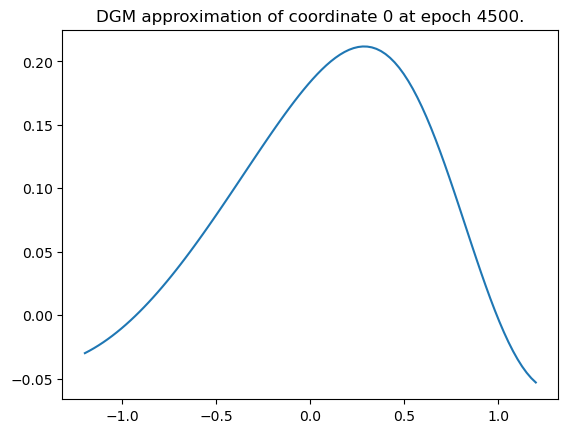

Epoch 4500 with loss 0.005221440922468901


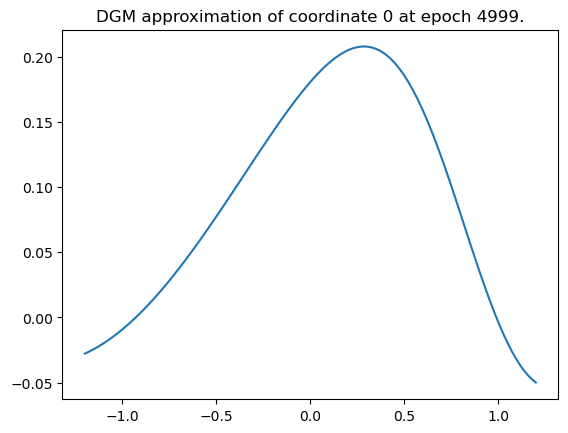

Epoch 4999 with loss 0.005067774094641209
Training of neural network with 5000 epochs take 400.8330738544464 seconds.


Time taken: 401 seconds; L1 error: 1.71E-02; L2 error: 4.42E-04; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


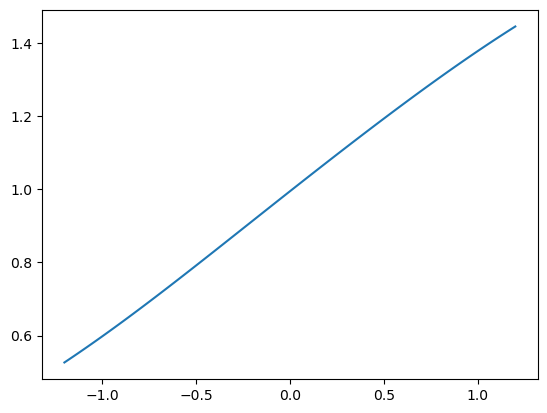

Epoch 0 with loss 0.665654718875885


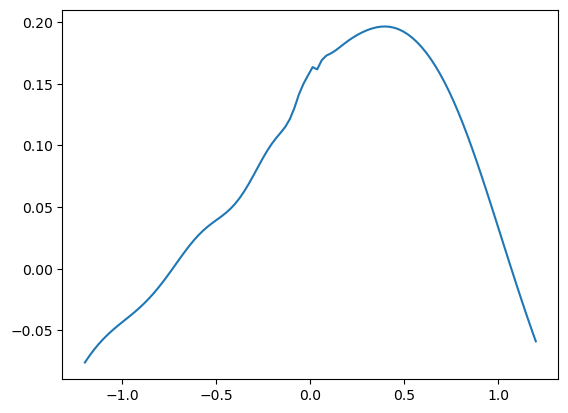

Epoch 500 with loss 0.0004667218017857522


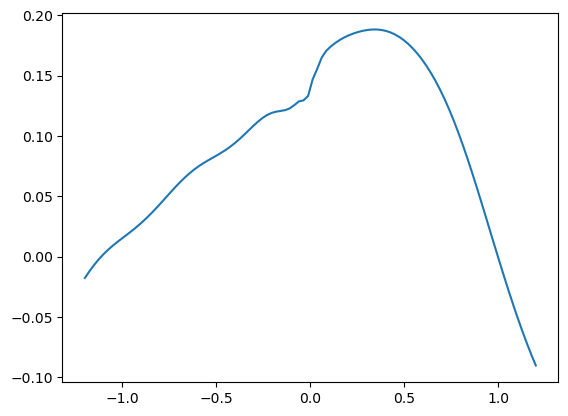

Epoch 1000 with loss 0.0002475627698004246


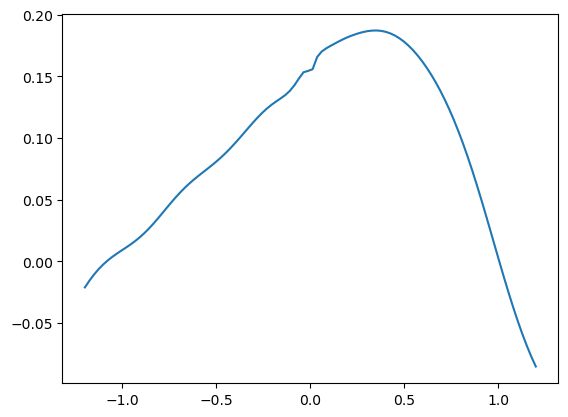

Epoch 1500 with loss 0.00016470212722197175


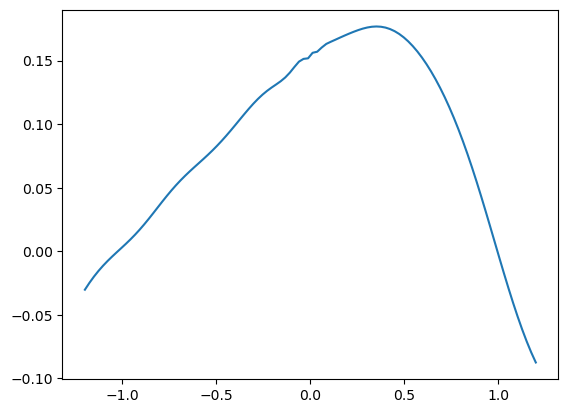

Epoch 2000 with loss 8.46496841404587e-05


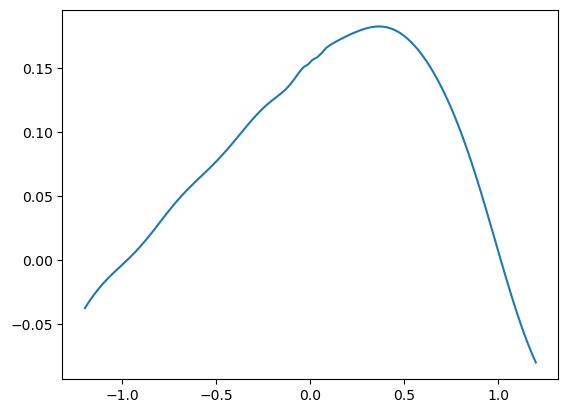

Epoch 2500 with loss 0.00010071614815387875


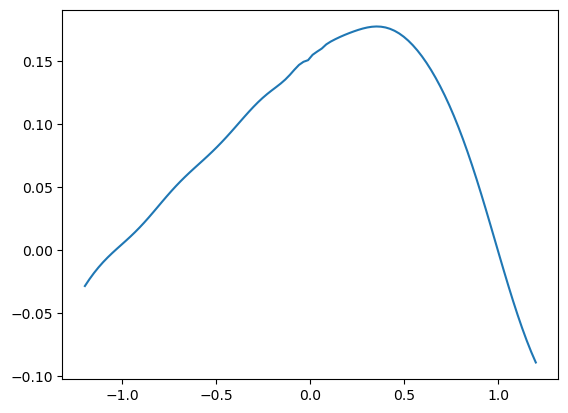

Epoch 3000 with loss 8.548100595362484e-05


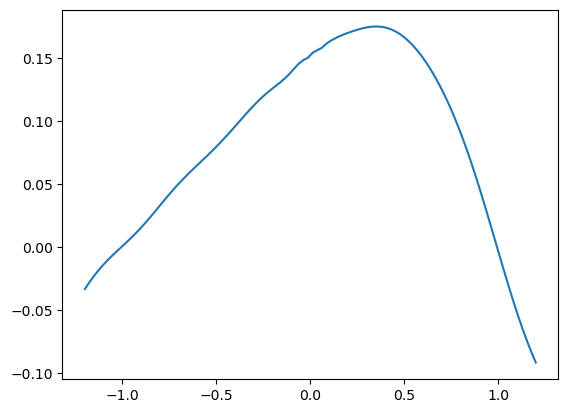

Epoch 3500 with loss 5.447483999887481e-05


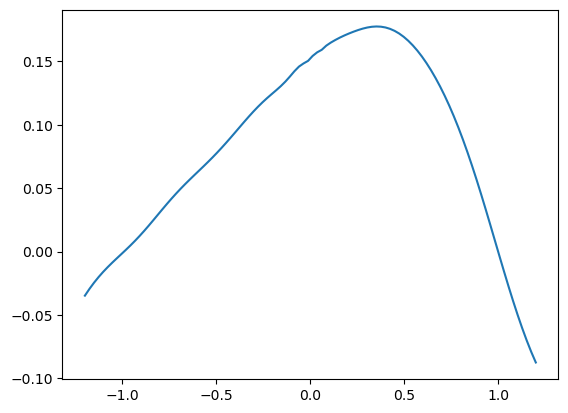

Epoch 4000 with loss 7.162482506828383e-05


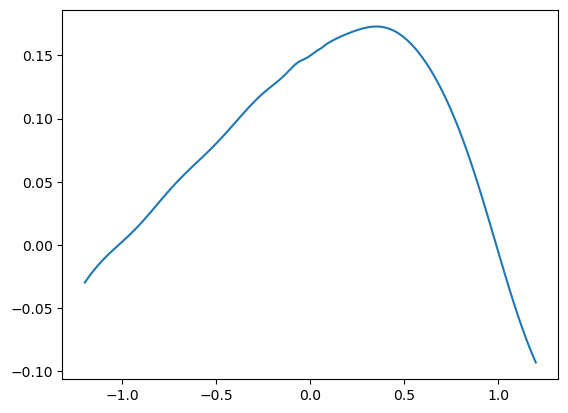

Epoch 4500 with loss 4.4824024371337146e-05


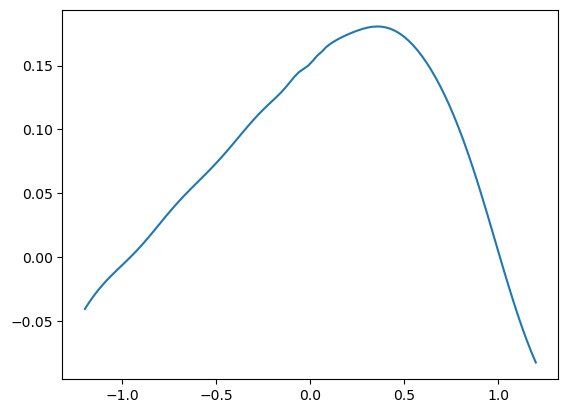

Epoch 4999 with loss 3.591651693568565e-05
Training of neural network with 5000 epochs take 232.09148621559143 seconds.
Time taken: 232 seconds; L1 error: 6.98E-03; L2 error: 6.56E-05; rel error: INF.




######## Summary for deep branching method
runtime:        255
fdb runtime:    9
total runtime:  265
mean L1 error:  3.13E-03
std L1 error:   0.00E+00
mean L2 error:  1.97E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        401
mean L1 error:  1.71E-02
std L1 error:   0.00E+00
mean L2 error:  4.42E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        232
mean L1 error:  6.98E-03
std L1 error:   0.00E+00
mean L2 error:  6.56E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


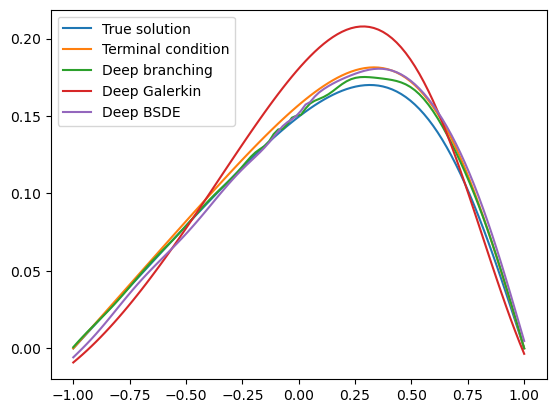

In [9]:
dim = 4
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 5

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 400.3964841365814 seconds.
Patch  0: epoch    0 with loss 2.08E+00


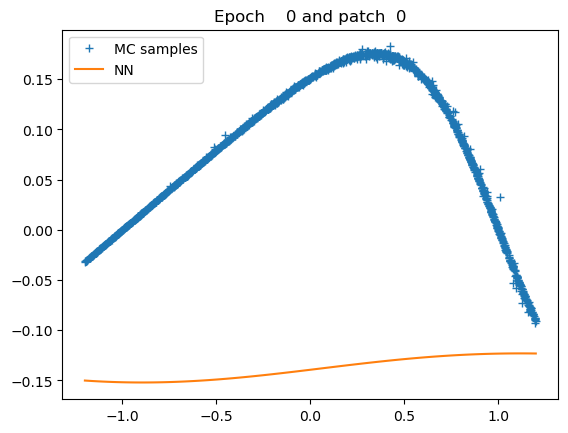

Patch  0: epoch  500 with loss 7.60E-06


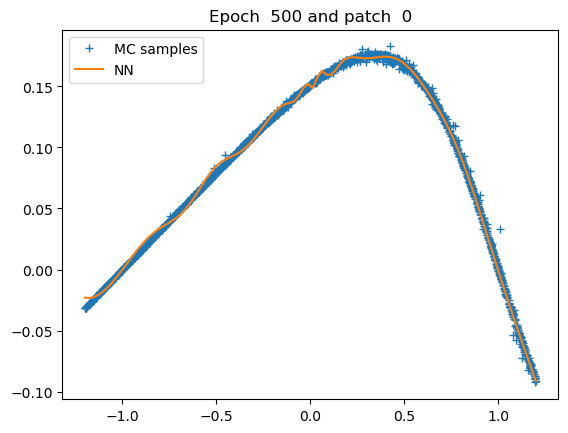

Patch  0: epoch 1000 with loss 4.14E-06


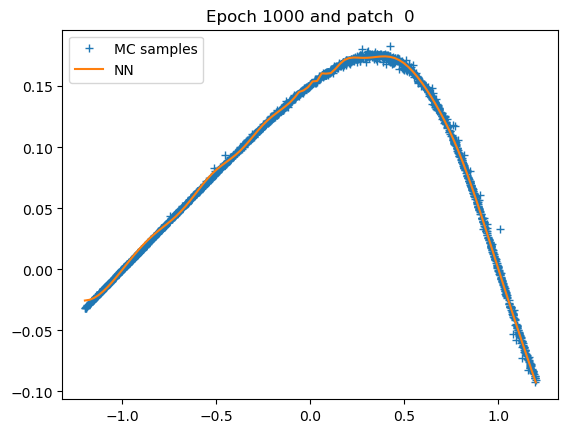

Patch  0: epoch 1500 with loss 4.00E-06


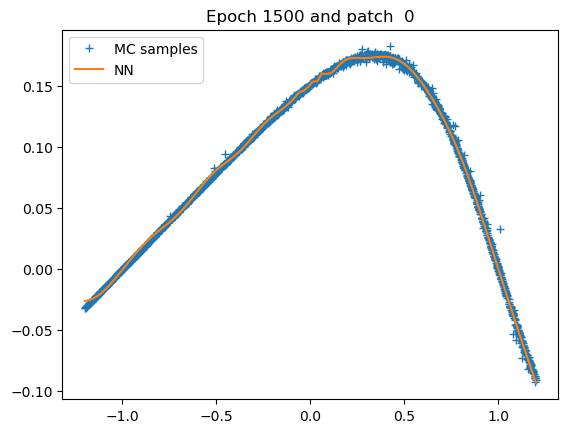

Patch  0: epoch 2000 with loss 3.83E-06


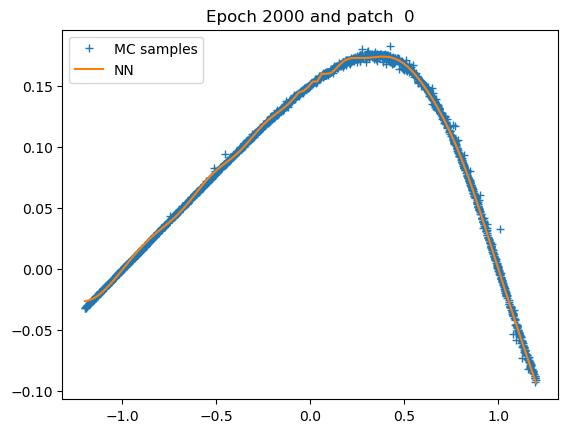

Patch  0: epoch 2500 with loss 3.82E-06


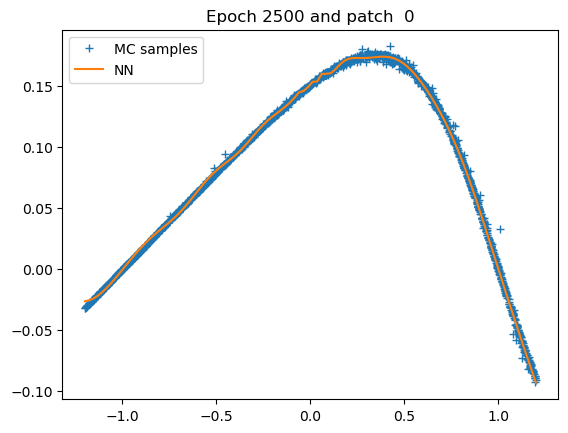

Patch  0: epoch 3000 with loss 3.79E-06


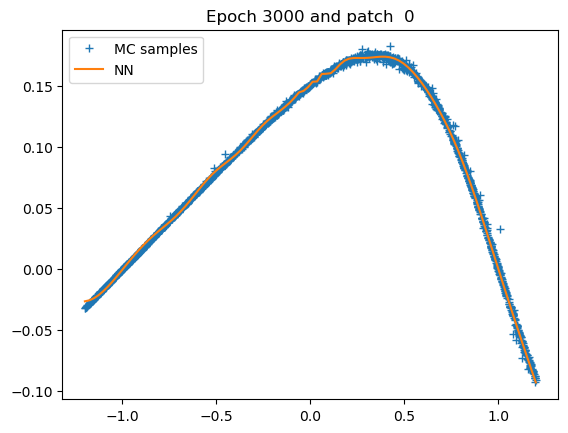

Patch  0: epoch 3500 with loss 3.76E-06


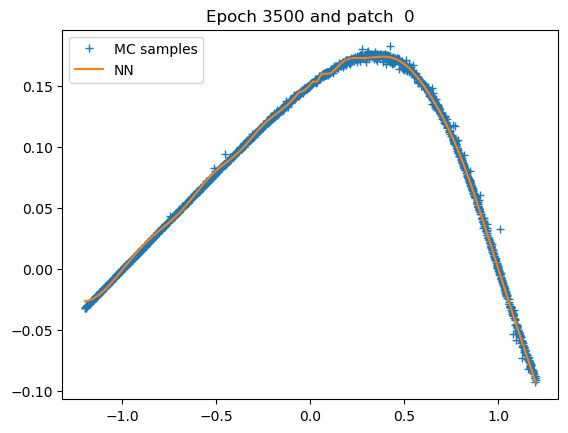

Patch  0: epoch 4000 with loss 3.72E-06


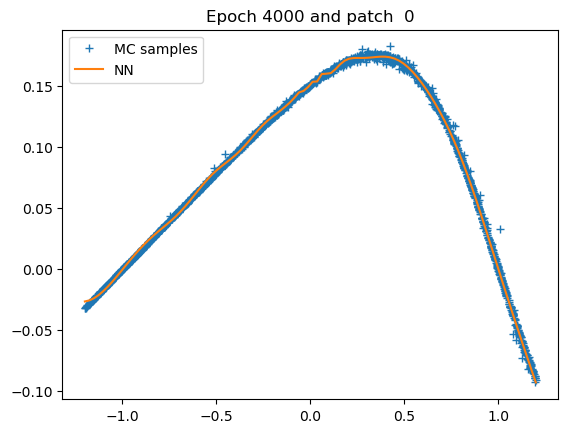

Patch  0: epoch 4500 with loss 3.68E-06


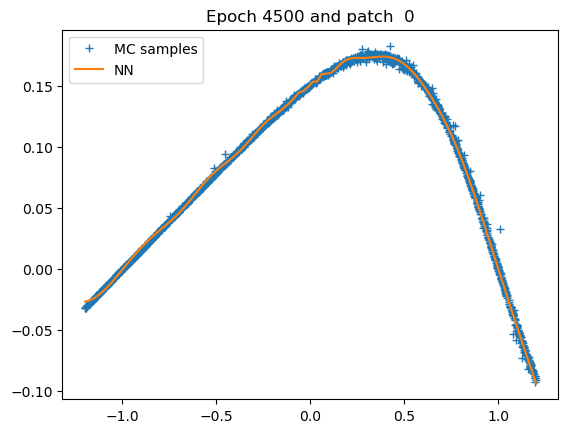

Patch  0: epoch 4999 with loss 3.62E-06


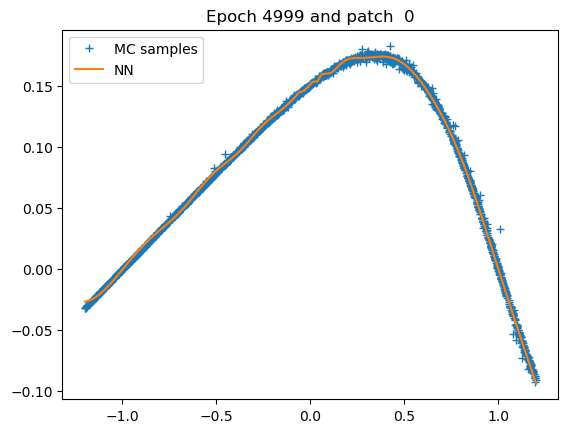

Patch 0: training of u with 5000 epochs take 37.742902994155884 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 416 seconds; L1 error: 3.29E-03; L2 error: 1.91E-05; rel error: INF.
fdb runtime: 22 seconds; total runtime: 438 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


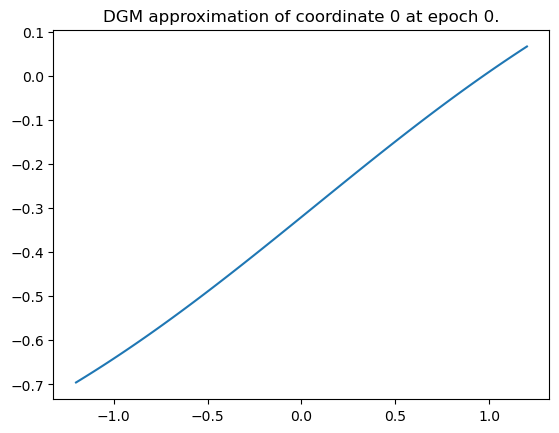

Epoch 0 with loss 1.473960518836975


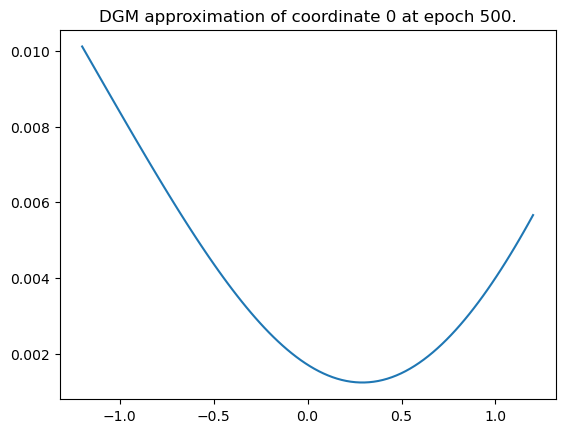

Epoch 500 with loss 0.014680732972919941


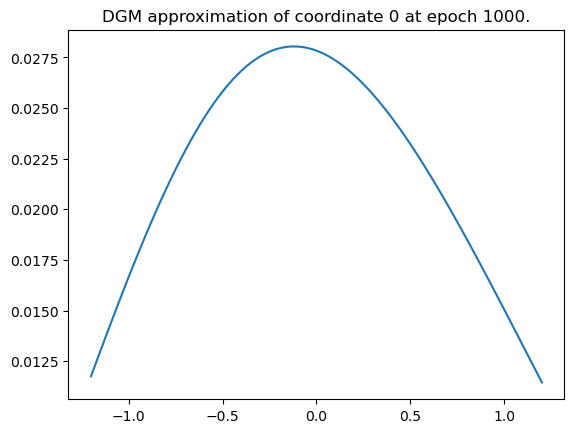

Epoch 1000 with loss 0.013843003660440445


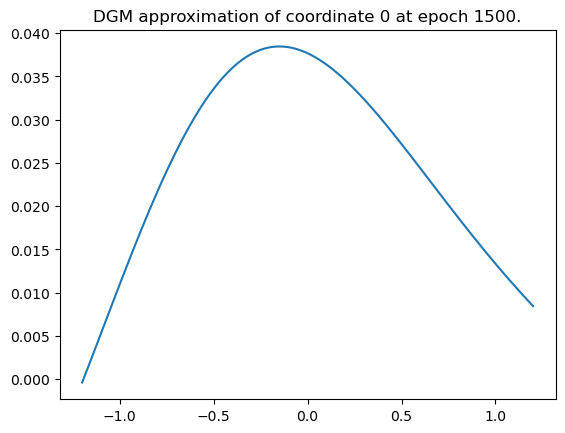

Epoch 1500 with loss 0.012053837068378925


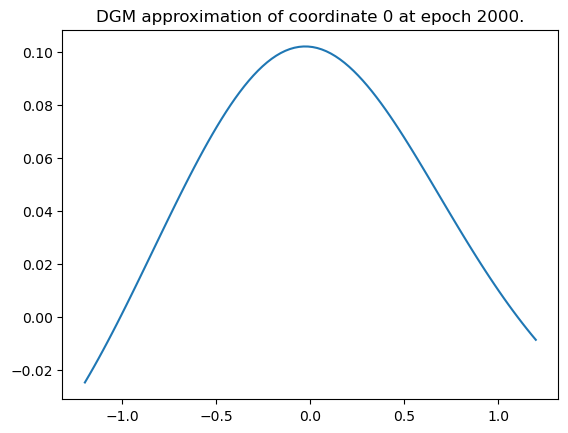

Epoch 2000 with loss 0.008671469986438751


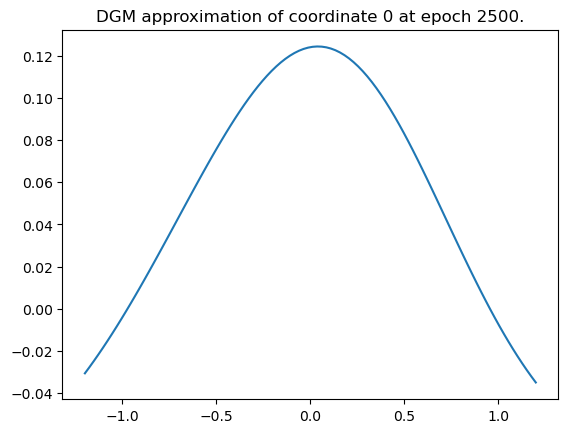

Epoch 2500 with loss 0.007739521563053131


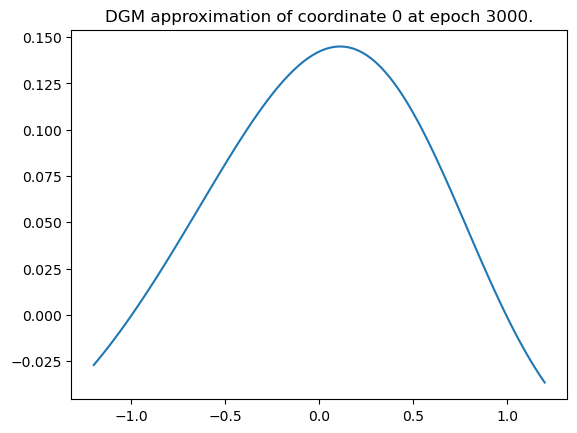

Epoch 3000 with loss 0.007355303503572941


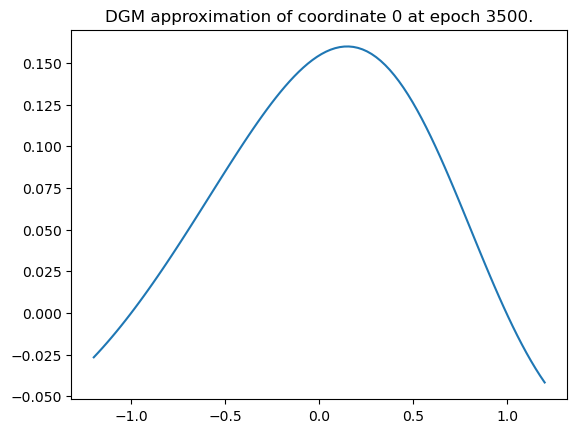

Epoch 3500 with loss 0.006934484466910362


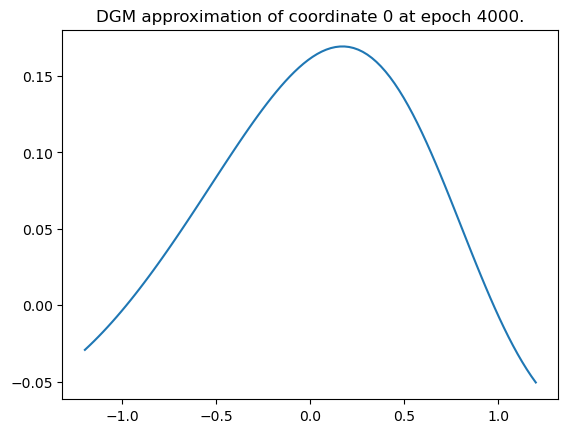

Epoch 4000 with loss 0.006709669250994921


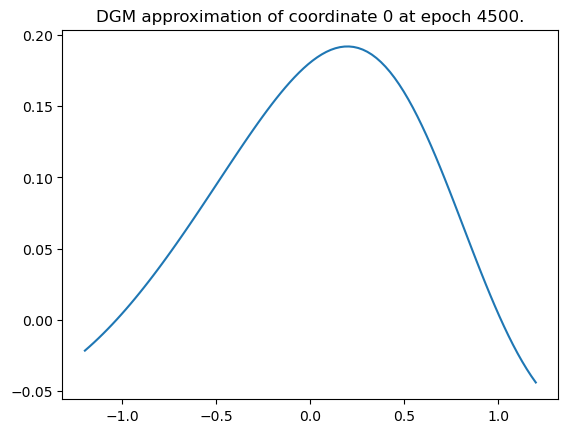

Epoch 4500 with loss 0.006601740140467882


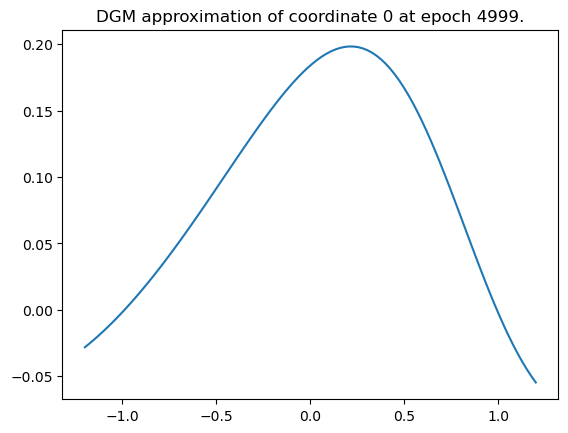

Epoch 4999 with loss 0.006289917975664139
Training of neural network with 5000 epochs take 482.9687795639038 seconds.


Time taken: 483 seconds; L1 error: 1.58E-02; L2 error: 3.85E-04; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


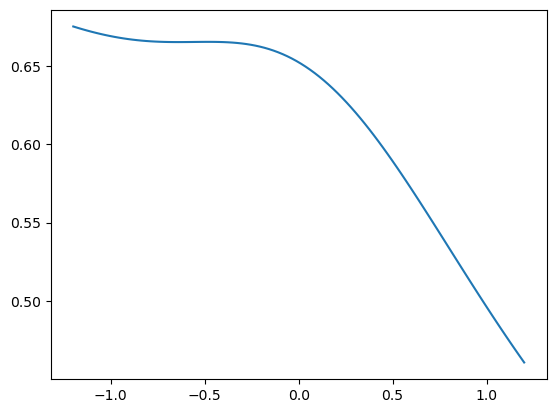

Epoch 0 with loss 0.7858270406723022


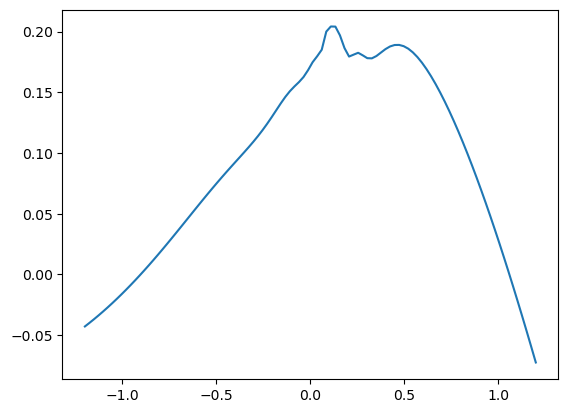

Epoch 500 with loss 0.00016749177302699536


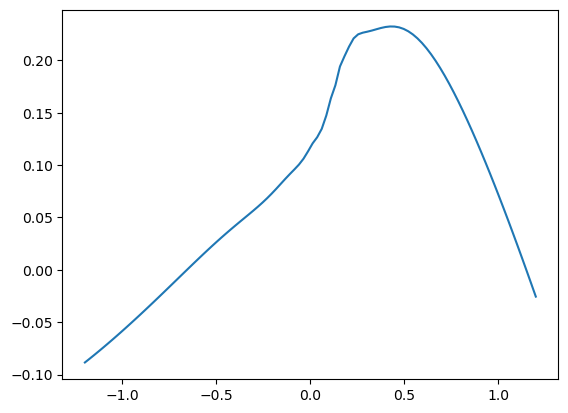

Epoch 1000 with loss 0.0010947142727673054


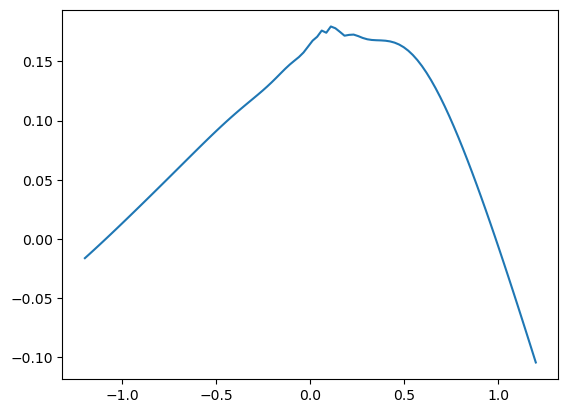

Epoch 1500 with loss 0.0003320752875879407


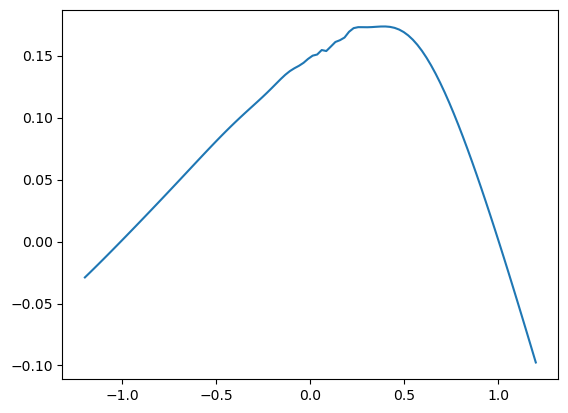

Epoch 2000 with loss 4.0001901652431116e-05


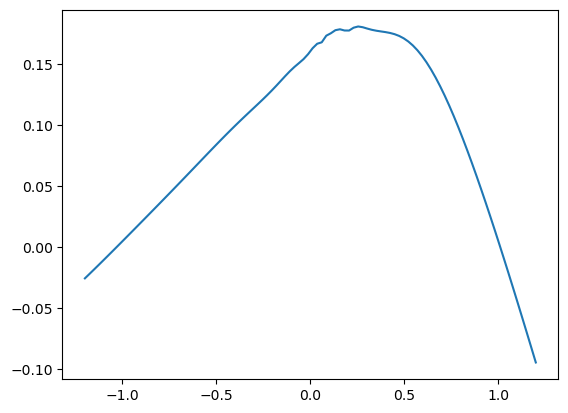

Epoch 2500 with loss 7.490708230761811e-05


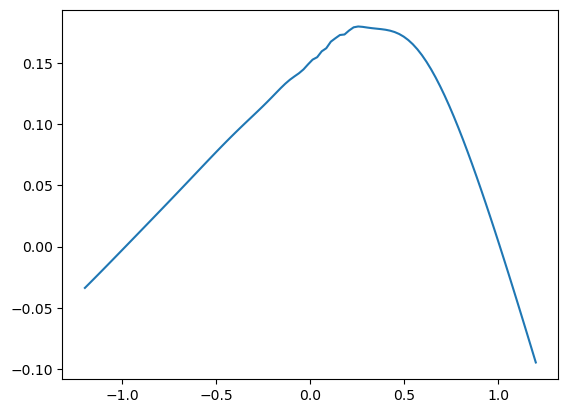

Epoch 3000 with loss 5.563764716498554e-05


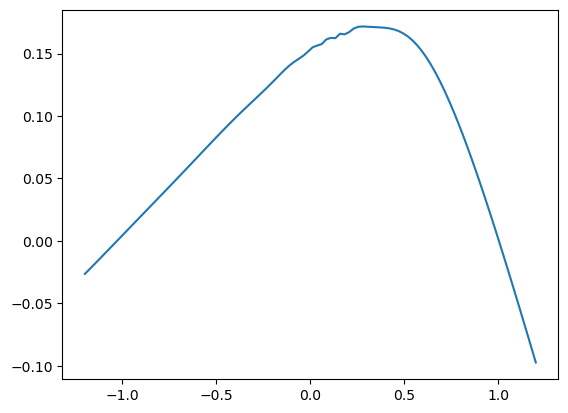

Epoch 3500 with loss 5.337746551958844e-05


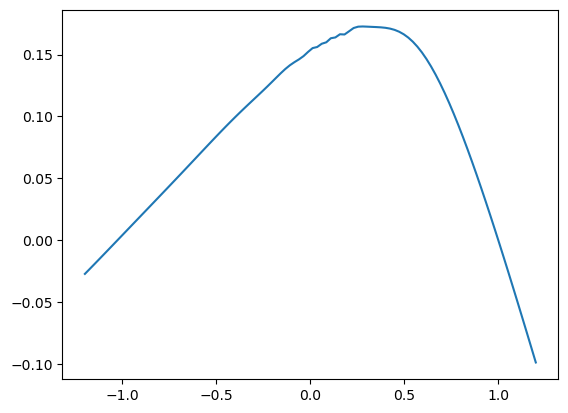

Epoch 4000 with loss 6.912462413311005e-05


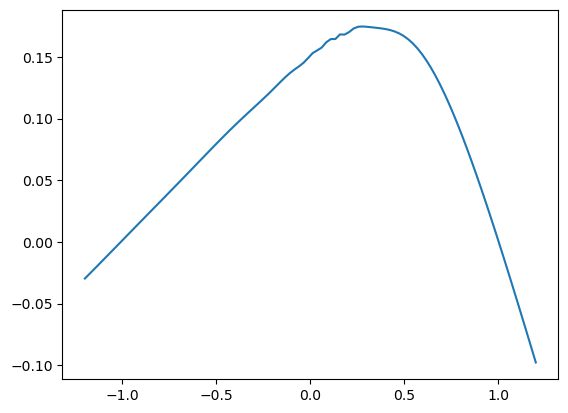

Epoch 4500 with loss 5.7011540775420144e-05


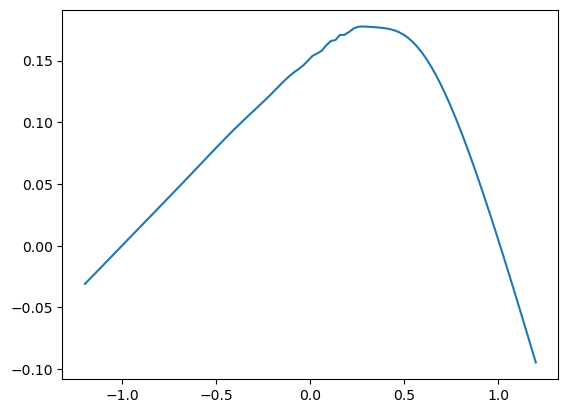

Epoch 4999 with loss 6.858737469883636e-05
Training of neural network with 5000 epochs take 231.00241565704346 seconds.
Time taken: 231 seconds; L1 error: 4.25E-03; L2 error: 3.68E-05; rel error: INF.




######## Summary for deep branching method
runtime:        416
fdb runtime:    22
total runtime:  438
mean L1 error:  3.29E-03
std L1 error:   0.00E+00
mean L2 error:  1.91E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        483
mean L1 error:  1.58E-02
std L1 error:   0.00E+00
mean L2 error:  3.85E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        231
mean L1 error:  4.25E-03
std L1 error:   0.00E+00
mean L2 error:  3.68E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


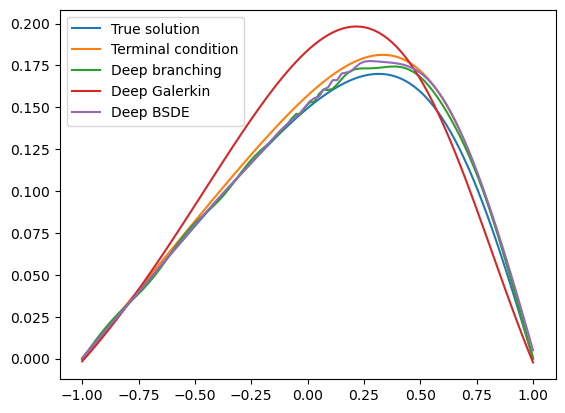

In [10]:
dim = 5
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 6

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 244.71984696388245 seconds.
Patch  0: epoch    0 with loss 4.93E+00


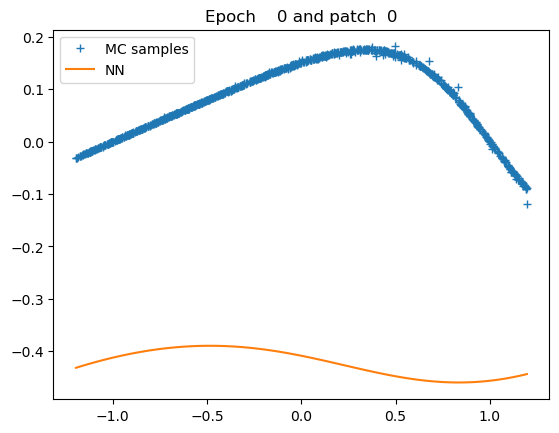

Patch  0: epoch  500 with loss 7.13E-06


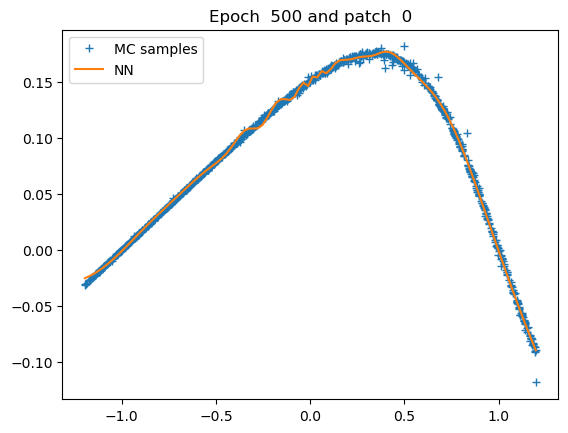

Patch  0: epoch 1000 with loss 4.64E-06


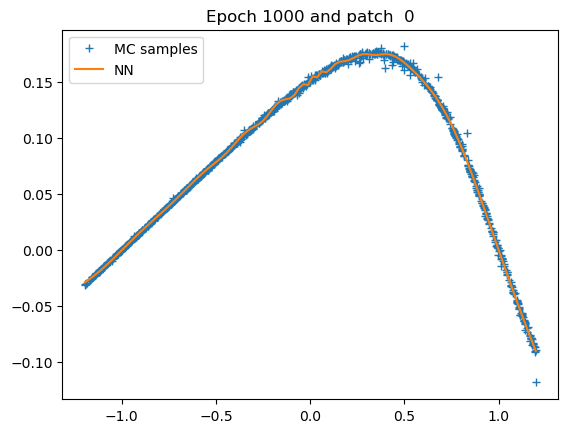

Patch  0: epoch 1500 with loss 4.53E-06


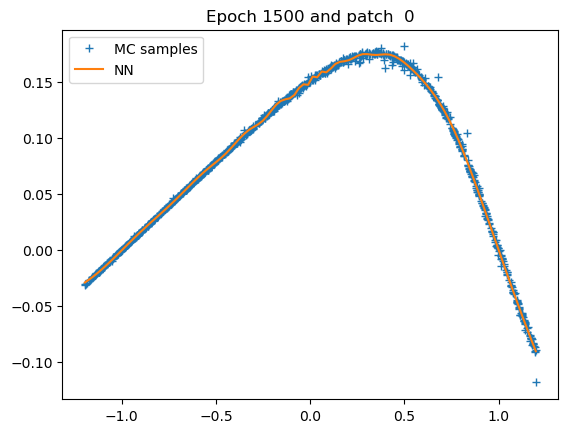

Patch  0: epoch 2000 with loss 4.41E-06


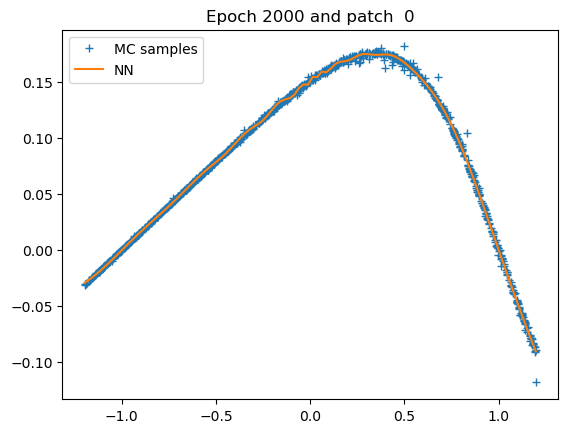

Patch  0: epoch 2500 with loss 4.39E-06


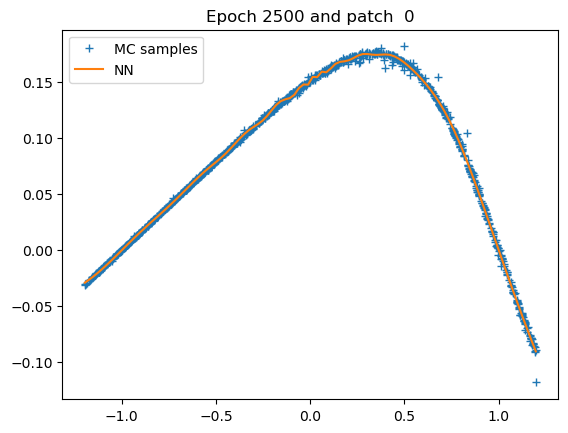

Patch  0: epoch 3000 with loss 4.38E-06


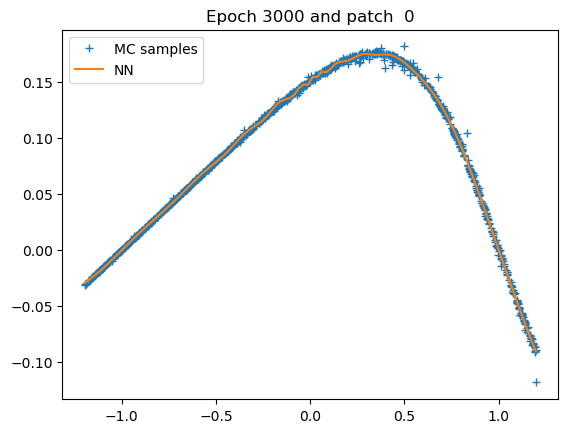

Patch  0: epoch 3500 with loss 4.36E-06


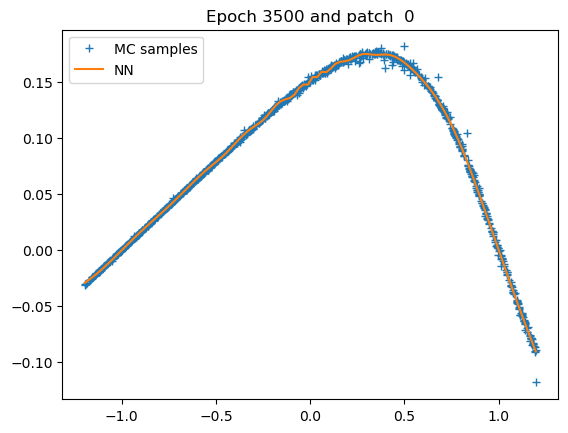

Patch  0: epoch 4000 with loss 4.33E-06


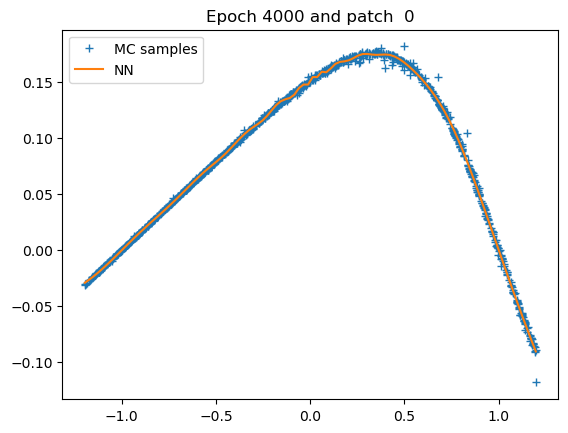

Patch  0: epoch 4500 with loss 4.30E-06


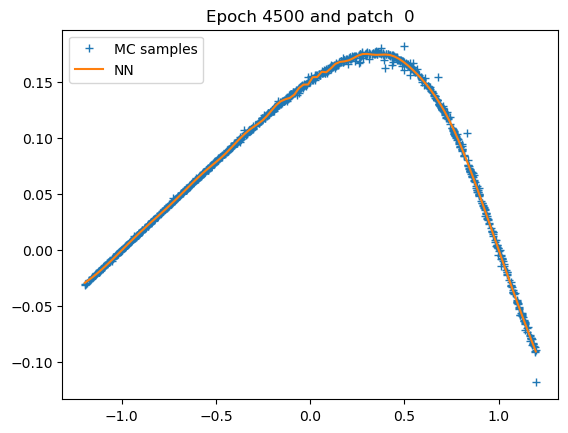

Patch  0: epoch 4999 with loss 4.26E-06


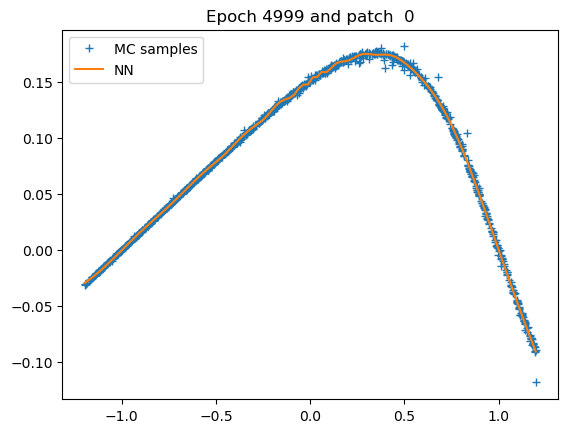

Patch 0: training of u with 5000 epochs take 33.718708992004395 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 223 seconds; L1 error: 3.15E-03; L2 error: 2.03E-05; rel error: INF.
fdb runtime: 55 seconds; total runtime: 279 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


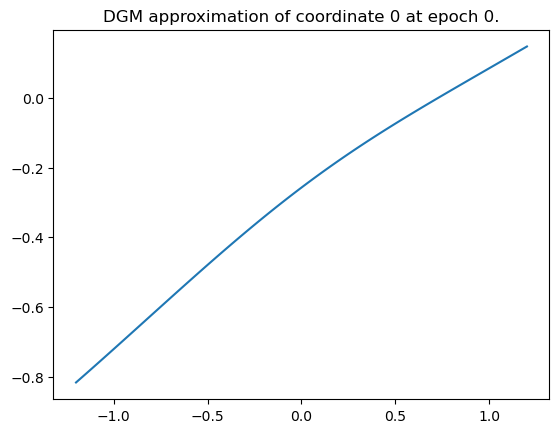

Epoch 0 with loss 1.0997971296310425


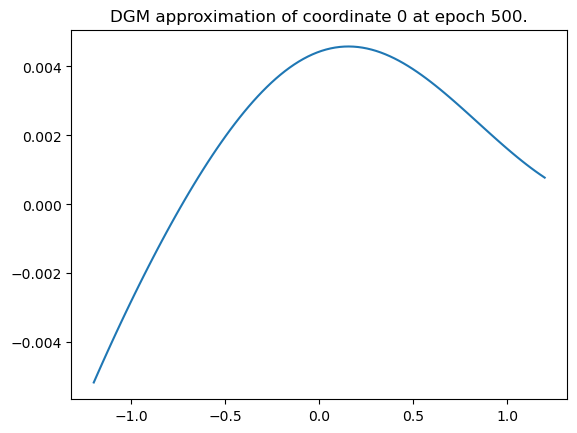

Epoch 500 with loss 0.015347958542406559


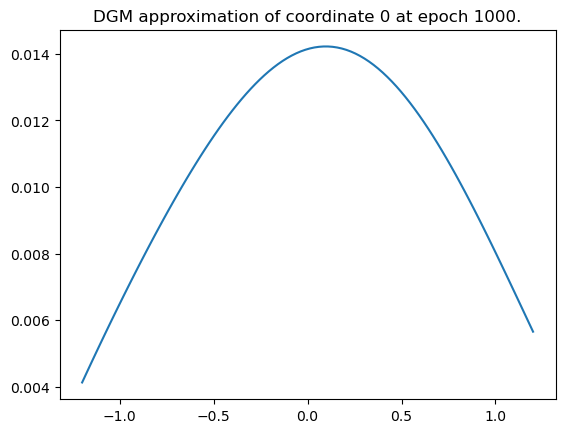

Epoch 1000 with loss 0.015094361267983913


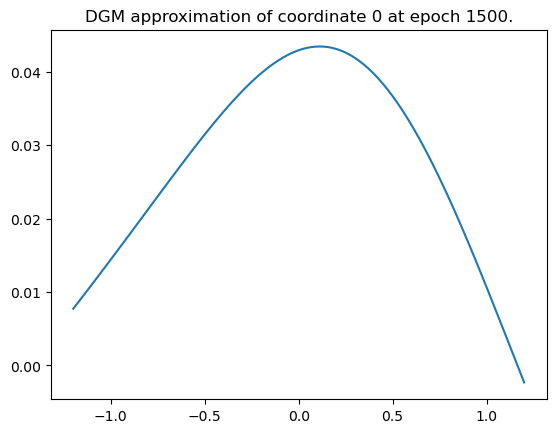

Epoch 1500 with loss 0.01230192556977272


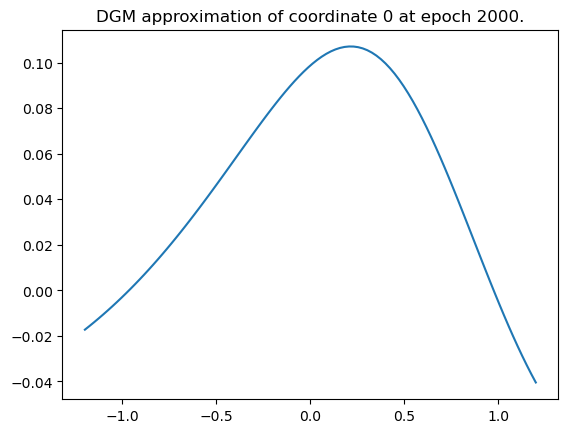

Epoch 2000 with loss 0.008520089089870453


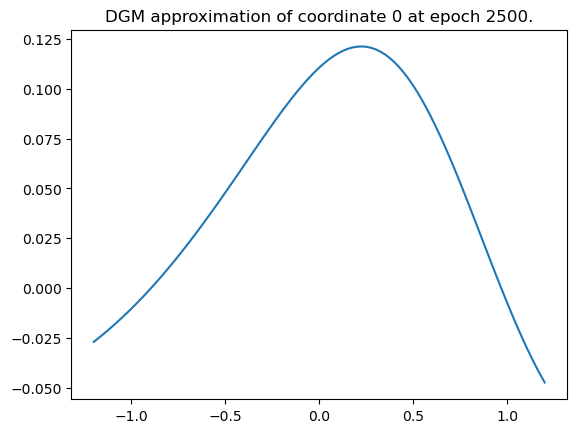

Epoch 2500 with loss 0.00782268587499857


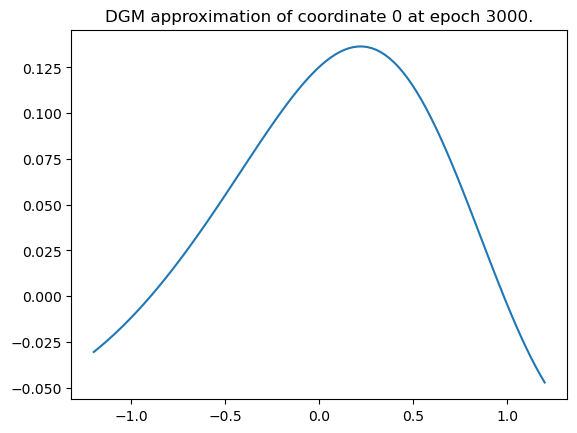

Epoch 3000 with loss 0.007684609387069941


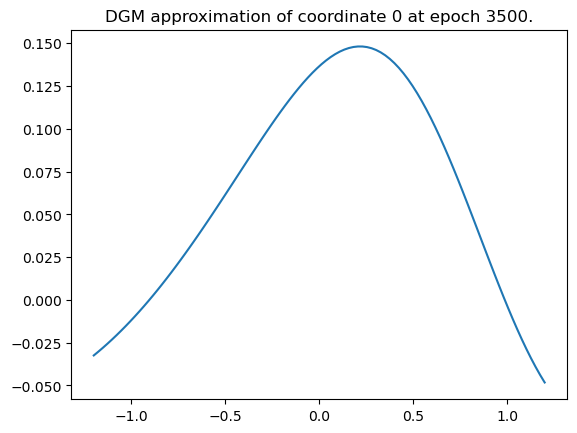

Epoch 3500 with loss 0.007332142908126116


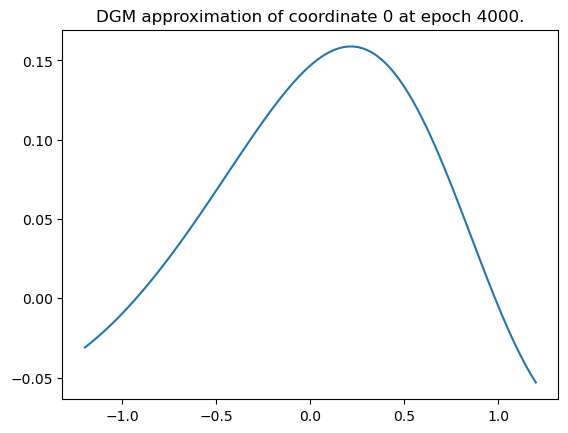

Epoch 4000 with loss 0.007088073529303074


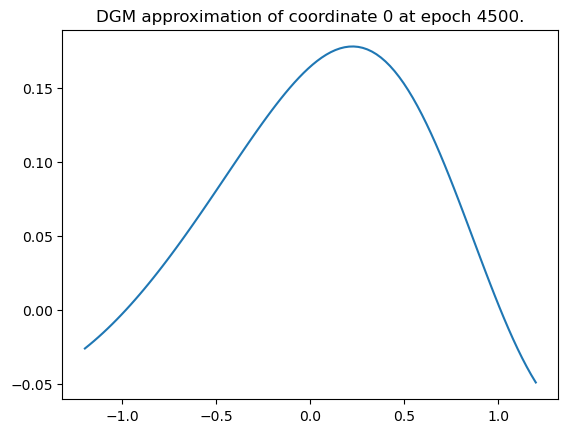

Epoch 4500 with loss 0.006928168702870607


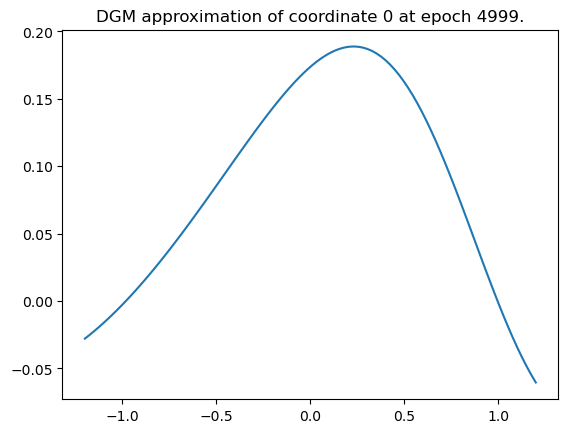

Epoch 4999 with loss 0.006779124494642019
Training of neural network with 5000 epochs take 545.3054039478302 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


Time taken: 545 seconds; L1 error: 1.09E-02; L2 error: 1.82E-04; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


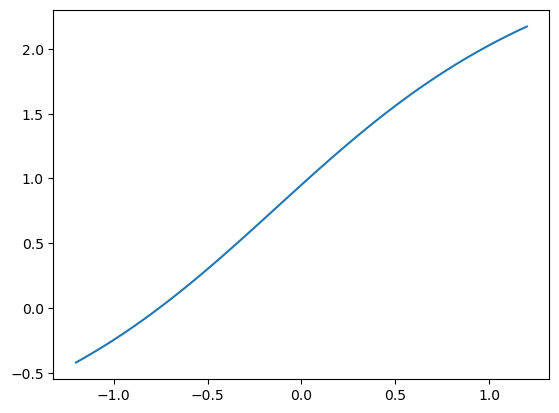

Epoch 0 with loss 0.597385585308075


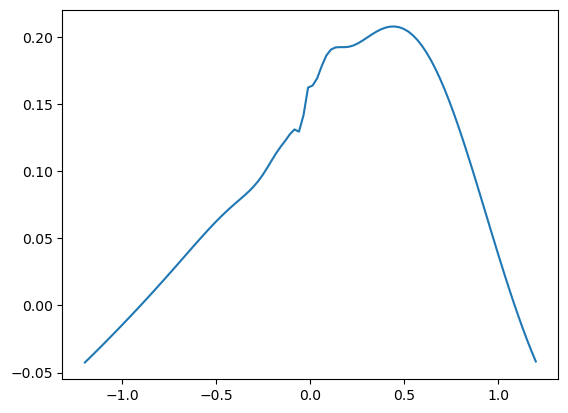

Epoch 500 with loss 0.00018923504103440791


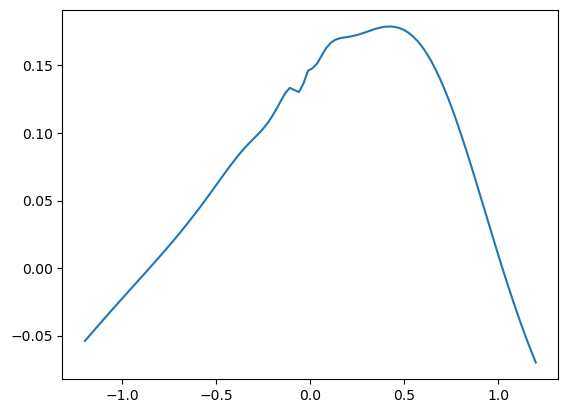

Epoch 1000 with loss 0.0002418489893898368


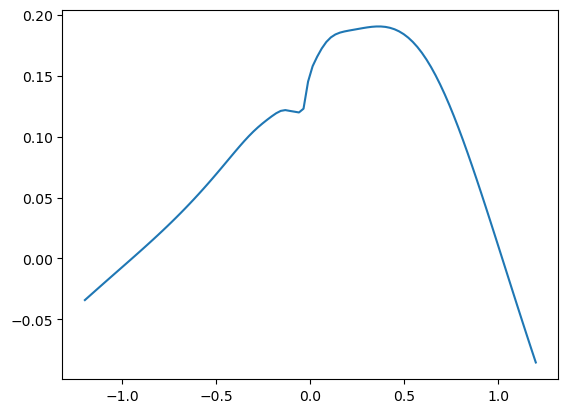

Epoch 1500 with loss 0.0018547738436609507


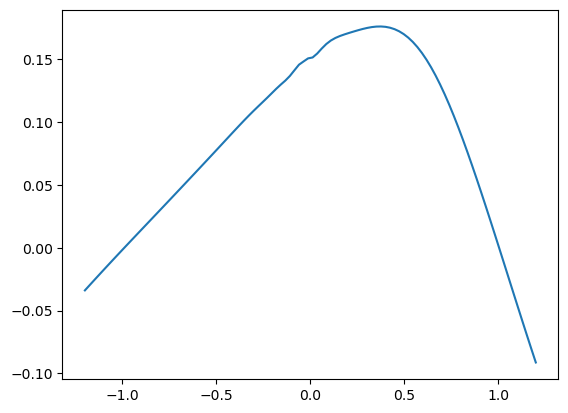

Epoch 2000 with loss 2.9415477911243215e-05


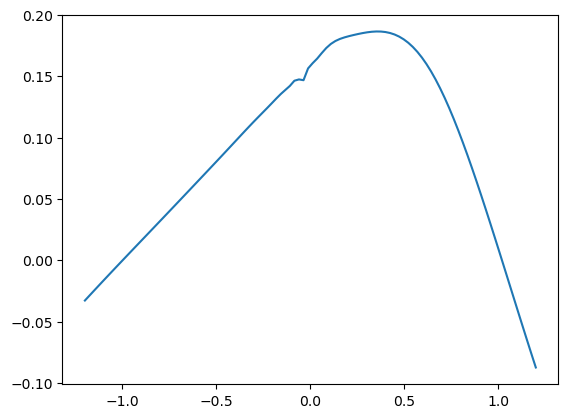

Epoch 2500 with loss 7.289322093129158e-05


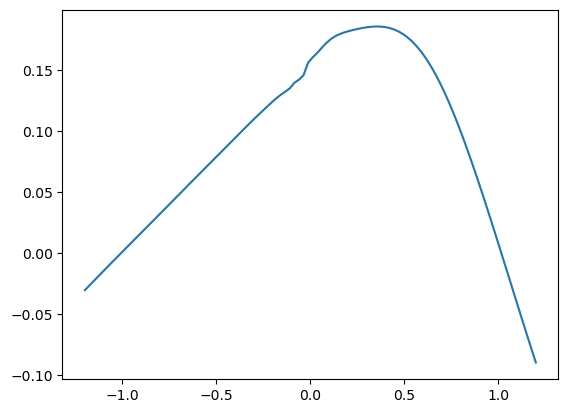

Epoch 3000 with loss 6.88129075570032e-05


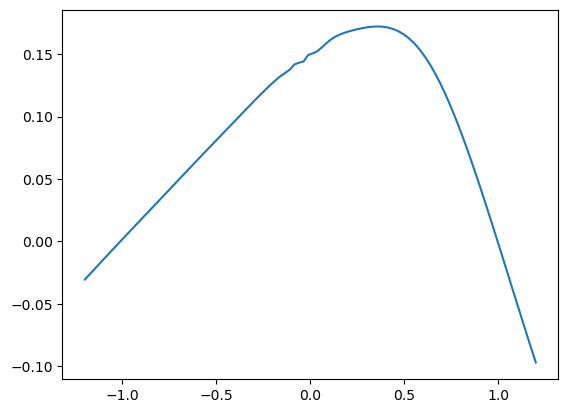

Epoch 3500 with loss 3.439638385316357e-05


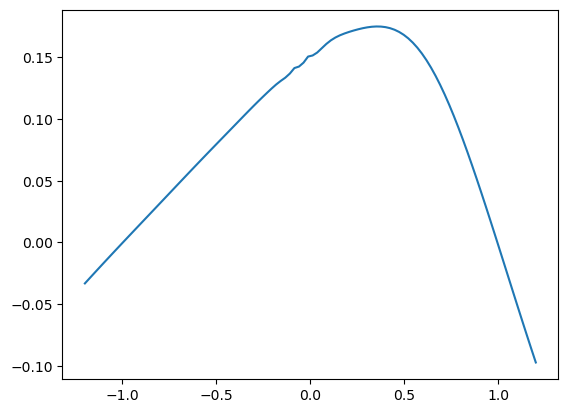

Epoch 4000 with loss 4.0137776522897184e-05


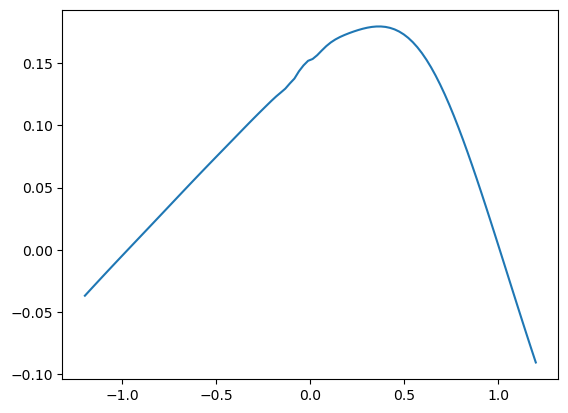

Epoch 4500 with loss 4.587120201904327e-05


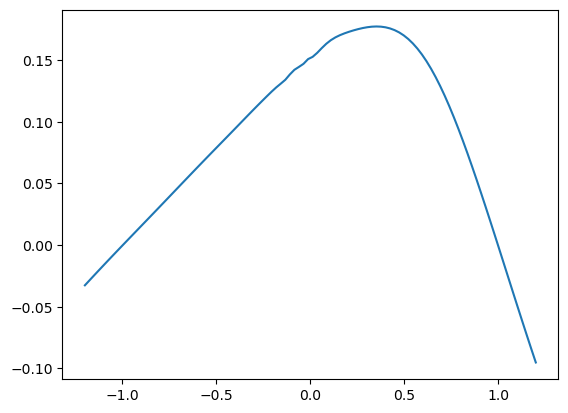

Epoch 4999 with loss 3.733699850272387e-05
Training of neural network with 5000 epochs take 241.68278551101685 seconds.
Time taken: 242 seconds; L1 error: 3.50E-03; L2 error: 2.54E-05; rel error: INF.




######## Summary for deep branching method
runtime:        223
fdb runtime:    55
total runtime:  279
mean L1 error:  3.15E-03
std L1 error:   0.00E+00
mean L2 error:  2.03E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        545
mean L1 error:  1.09E-02
std L1 error:   0.00E+00
mean L2 error:  1.82E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        242
mean L1 error:  3.50E-03
std L1 error:   0.00E+00
mean L2 error:  2.54E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


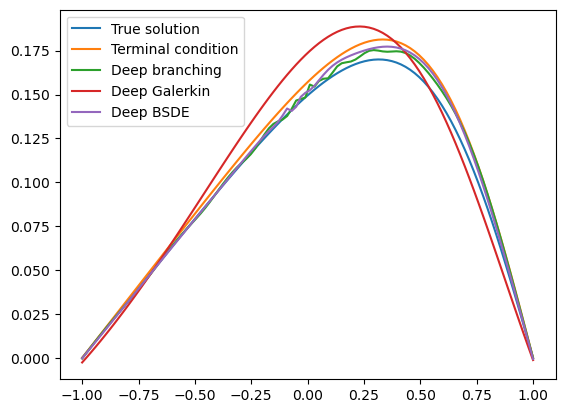

In [11]:
dim = 6
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True,  
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 7

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 1342.6996097564697 seconds.
Patch  0: epoch    0 with loss 2.94E-01


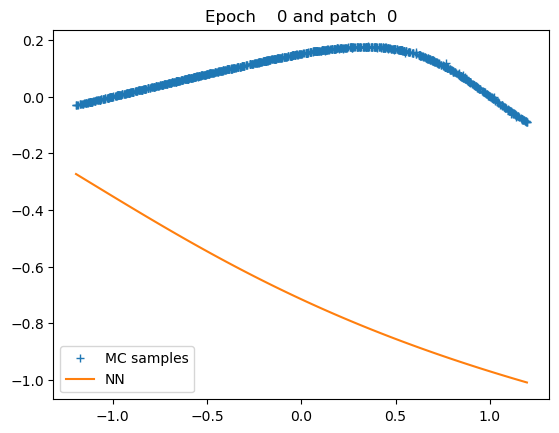

Patch  0: epoch  500 with loss 4.90E-06


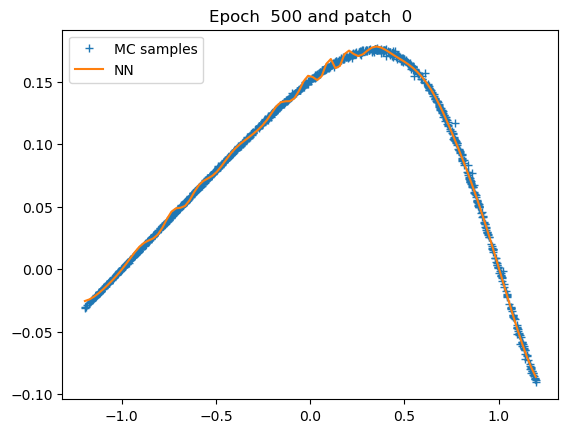

Patch  0: epoch 1000 with loss 1.97E-06


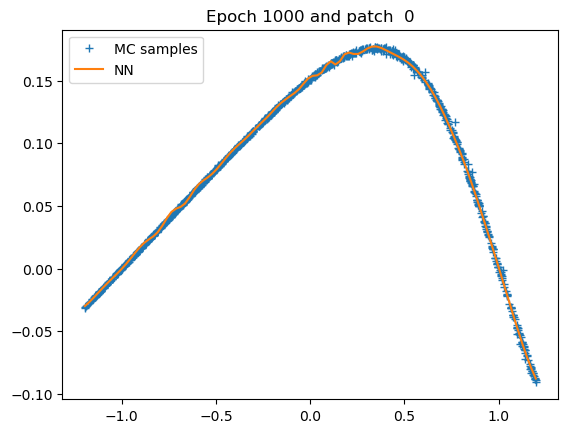

Patch  0: epoch 1500 with loss 1.84E-06


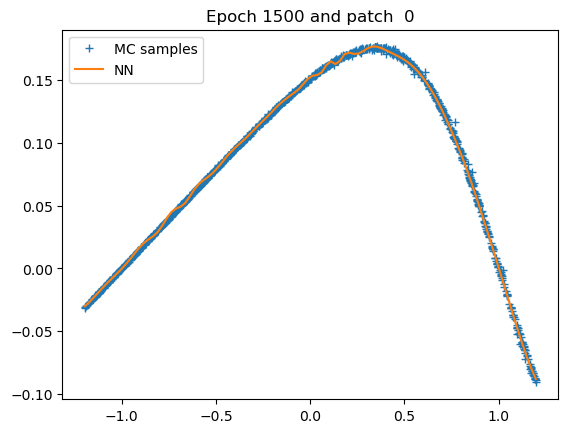

Patch  0: epoch 2000 with loss 1.71E-06


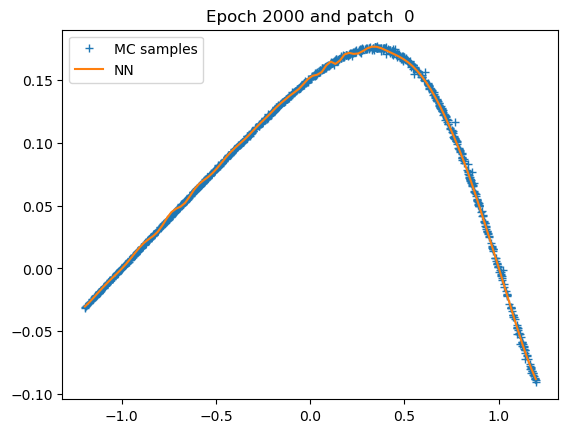

Patch  0: epoch 2500 with loss 1.69E-06


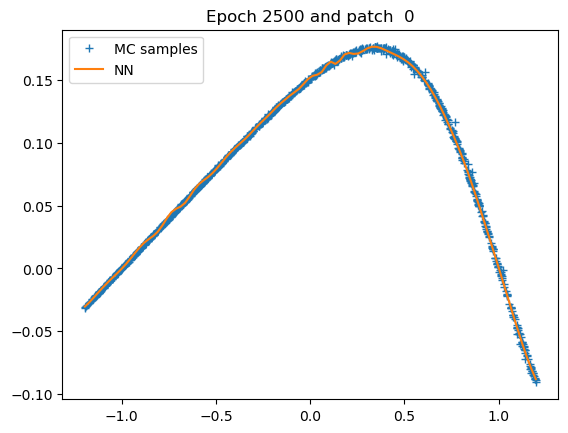

Patch  0: epoch 3000 with loss 1.67E-06


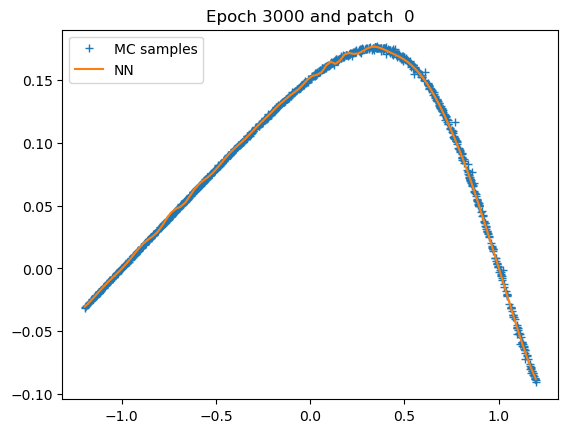

Patch  0: epoch 3500 with loss 1.65E-06


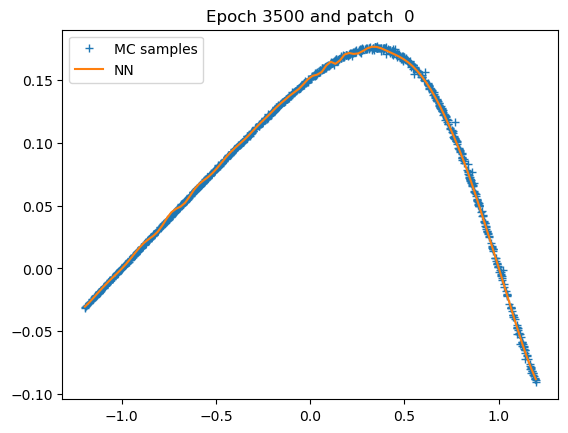

Patch  0: epoch 4000 with loss 1.62E-06


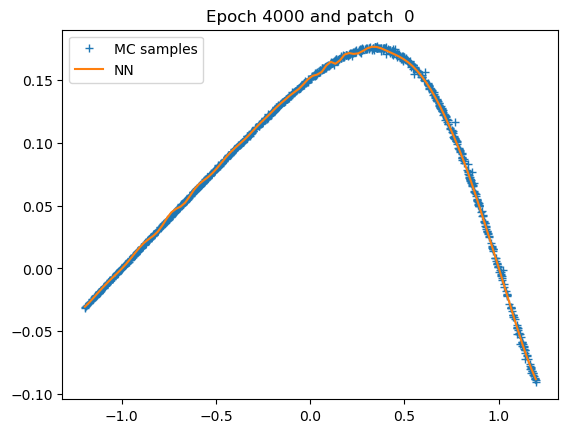

Patch  0: epoch 4500 with loss 1.59E-06


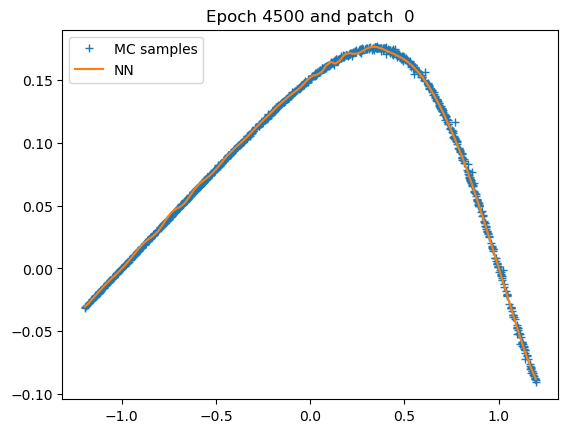

Patch  0: epoch 4999 with loss 1.55E-06


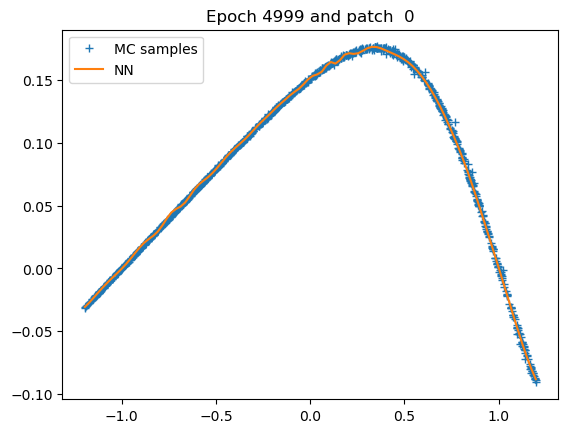

Patch 0: training of u with 5000 epochs take 39.51054668426514 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 1244 seconds; L1 error: 3.10E-03; L2 error: 1.72E-05; rel error: INF.
fdb runtime: 139 seconds; total runtime: 1383 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


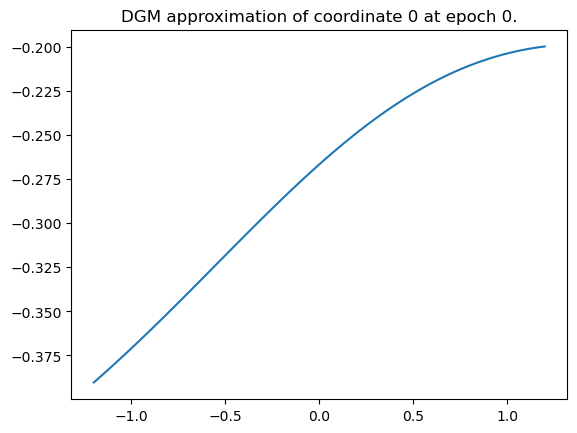

Epoch 0 with loss 0.6871408224105835


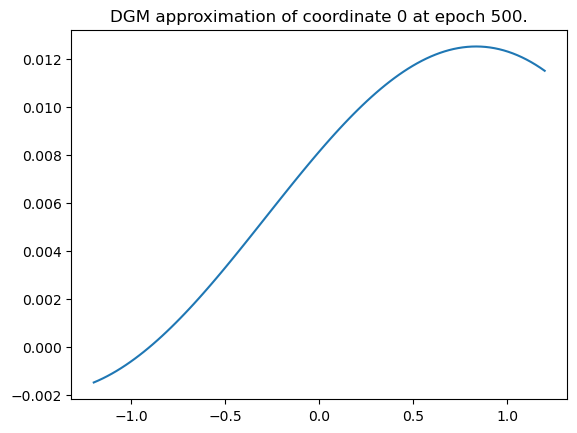

Epoch 500 with loss 0.015260168351233006


In [ ]:
dim = 7
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=10000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 8

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 438.91489458084106 seconds.
Patch  0: epoch    0 with loss 3.00E+00


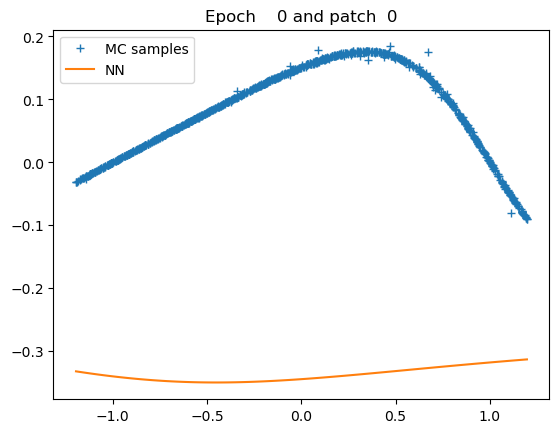

Patch  0: epoch  500 with loss 1.02E-05


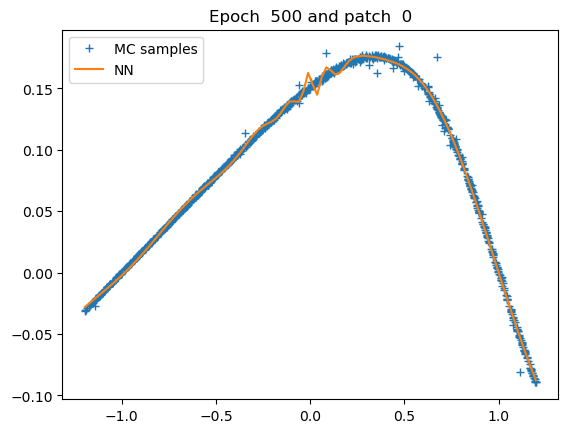

Patch  0: epoch 1000 with loss 6.95E-06


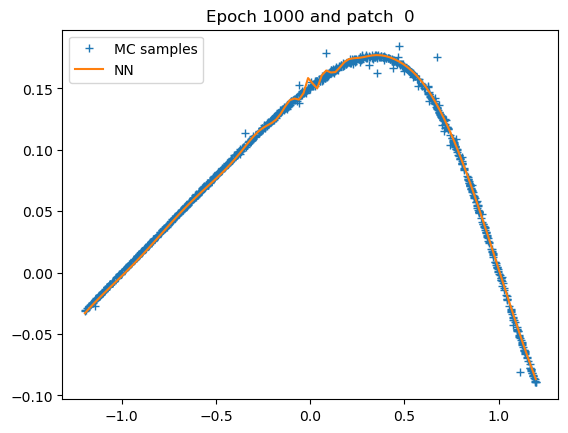

Patch  0: epoch 1500 with loss 6.43E-06


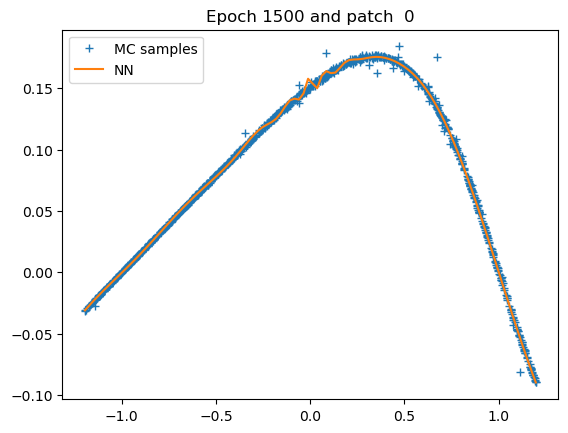

Patch  0: epoch 2000 with loss 6.17E-06


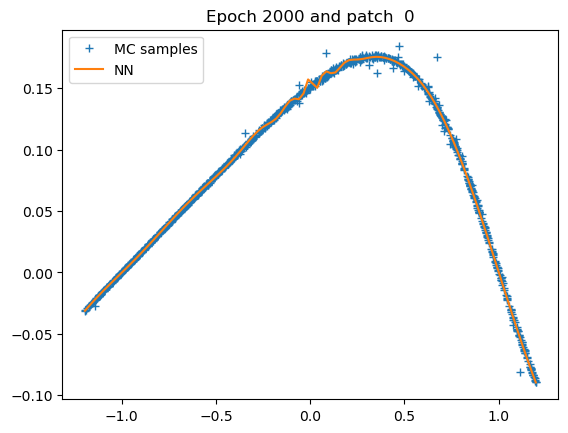

Patch  0: epoch 2500 with loss 6.14E-06


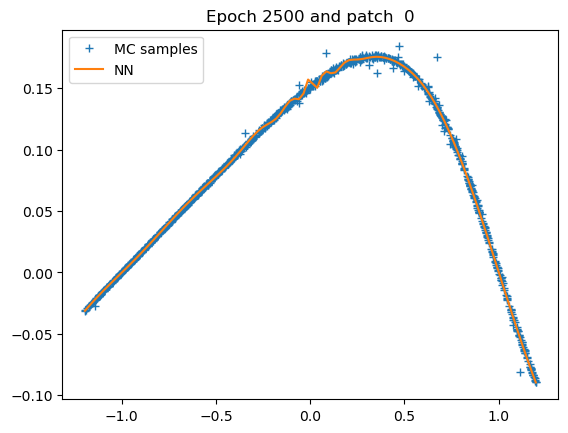

Patch  0: epoch 3000 with loss 6.11E-06


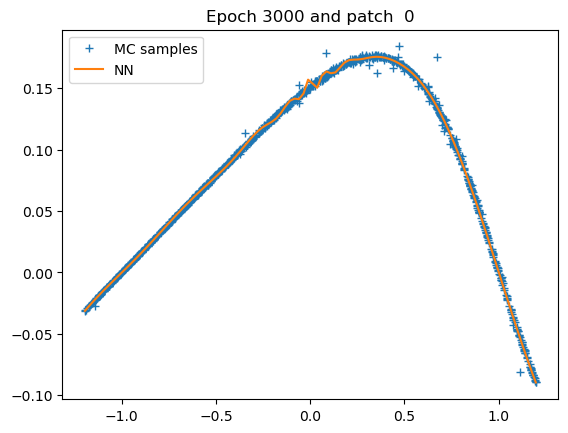

Patch  0: epoch 3500 with loss 6.06E-06


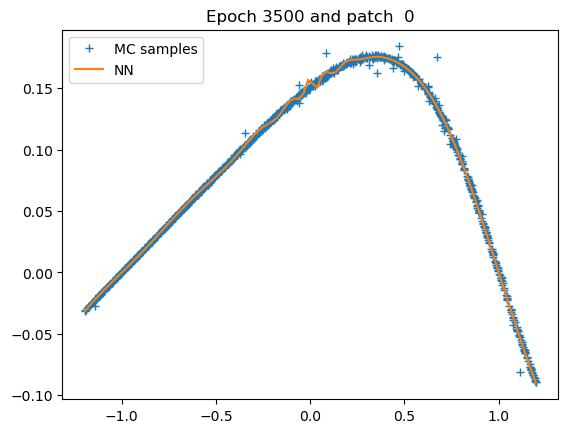

Patch  0: epoch 4000 with loss 6.00E-06


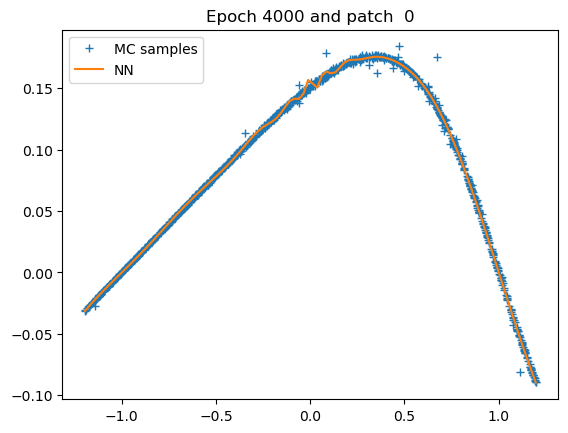

Patch  0: epoch 4500 with loss 5.93E-06


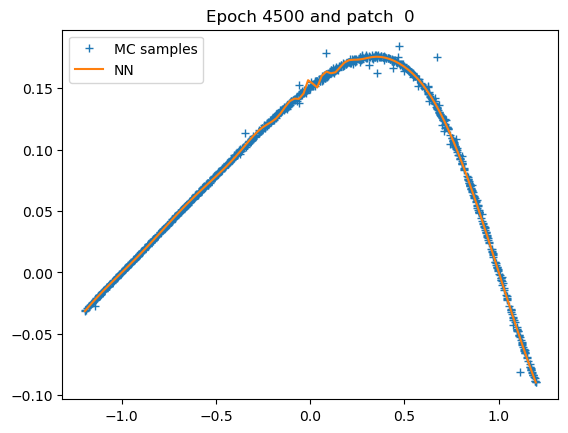

Patch  0: epoch 4999 with loss 5.84E-06


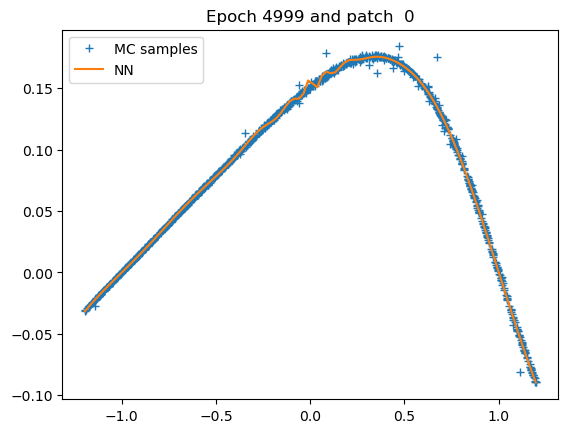

Patch 0: training of u with 5000 epochs take 36.829723834991455 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 354 seconds; L1 error: 3.38E-03; L2 error: 2.14E-05; rel error: INF.
fdb runtime: 123 seconds; total runtime: 477 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


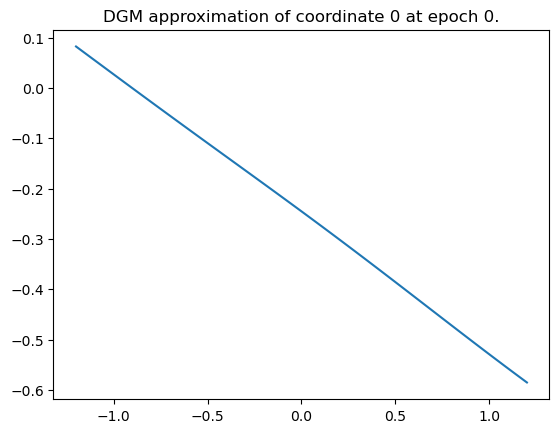

Epoch 0 with loss 0.7601200342178345


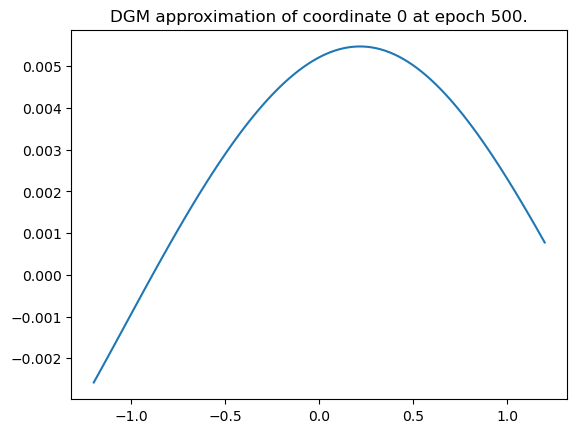

Epoch 500 with loss 0.015394329093396664


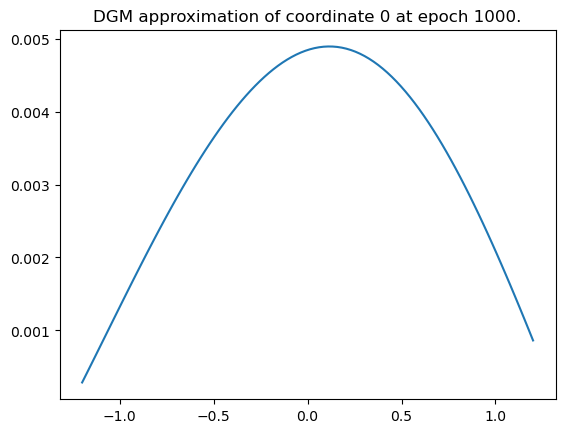

Epoch 1000 with loss 0.015337301418185234


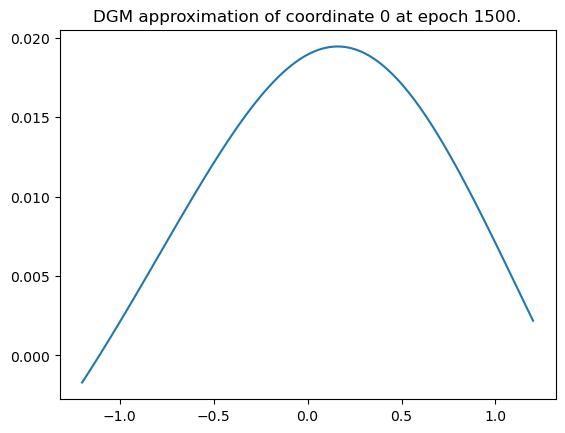

Epoch 1500 with loss 0.01416029967367649


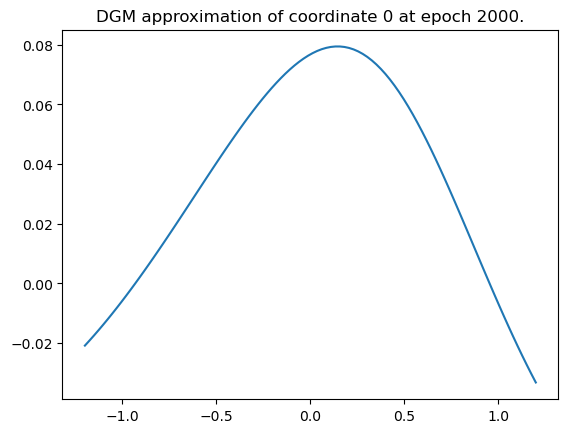

Epoch 2000 with loss 0.009753592312335968


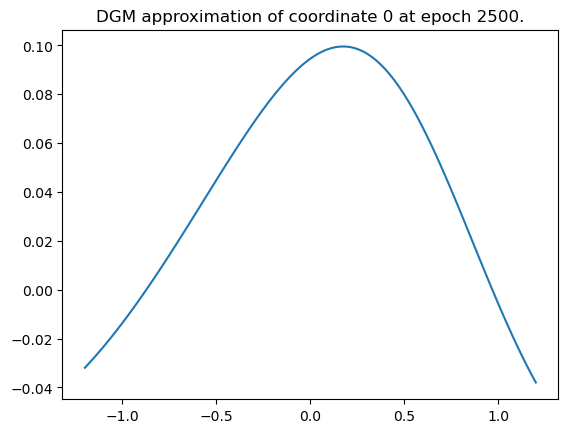

Epoch 2500 with loss 0.008494537323713303


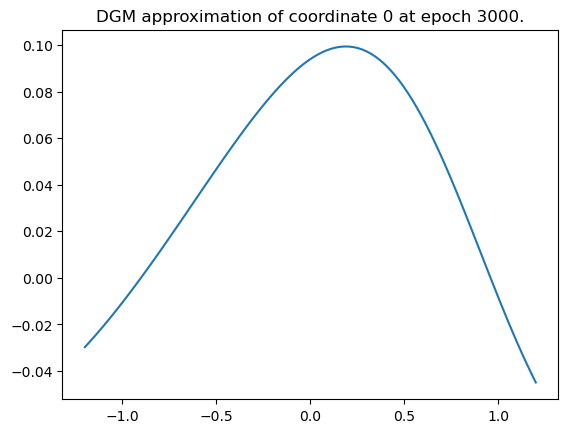

Epoch 3000 with loss 0.007920612581074238


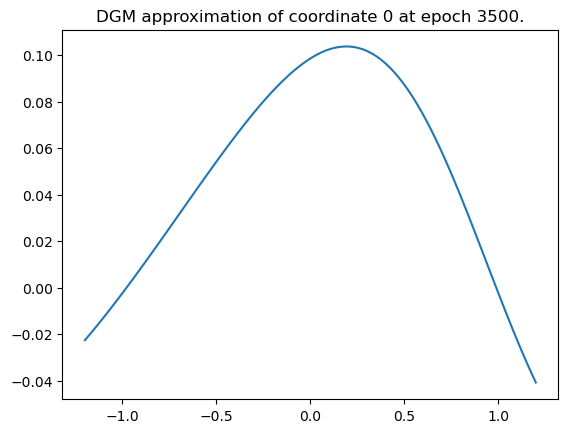

Epoch 3500 with loss 0.007777023129165173


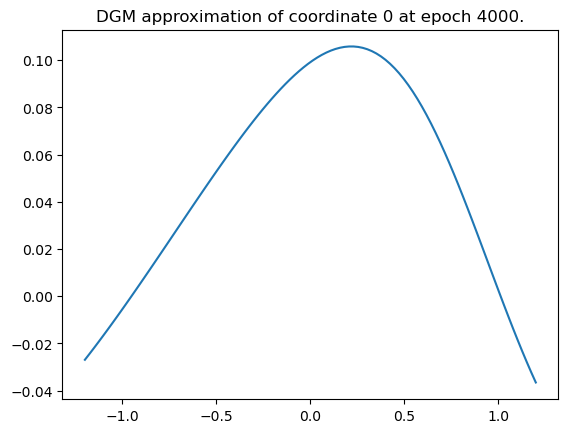

Epoch 4000 with loss 0.007646098732948303


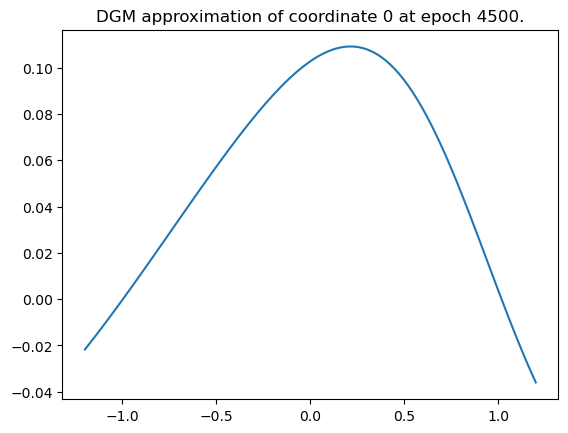

Epoch 4500 with loss 0.007540705613791943


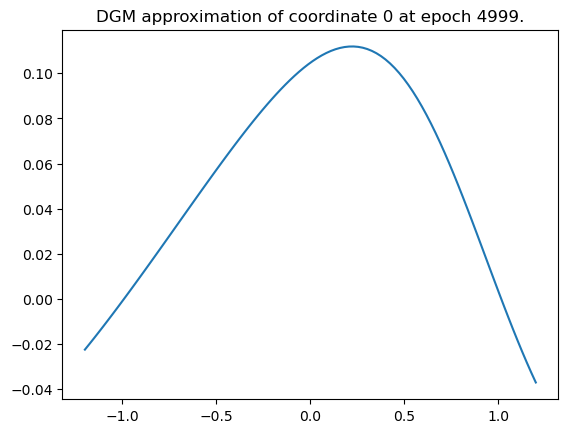

Epoch 4999 with loss 0.007399916648864746
Training of neural network with 5000 epochs take 712.870126247406 seconds.


Time taken: 713 seconds; L1 error: 3.46E-02; L2 error: 1.58E-03; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


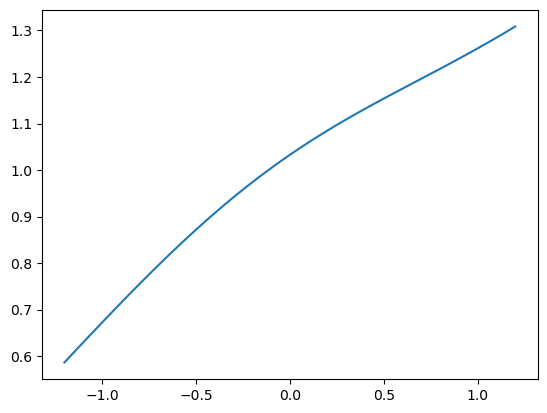

Epoch 0 with loss 0.6722729802131653


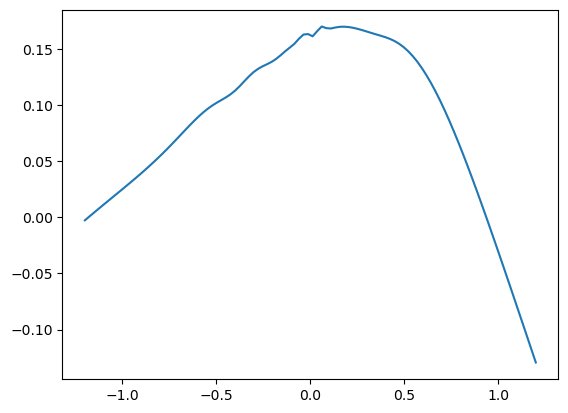

Epoch 500 with loss 0.0003019064897671342


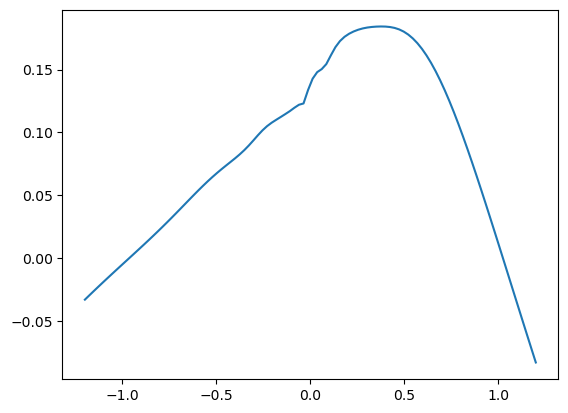

Epoch 1000 with loss 0.0002709972904995084


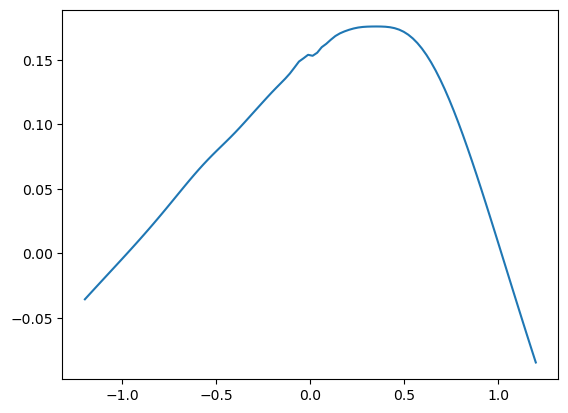

Epoch 1500 with loss 0.000557786610443145


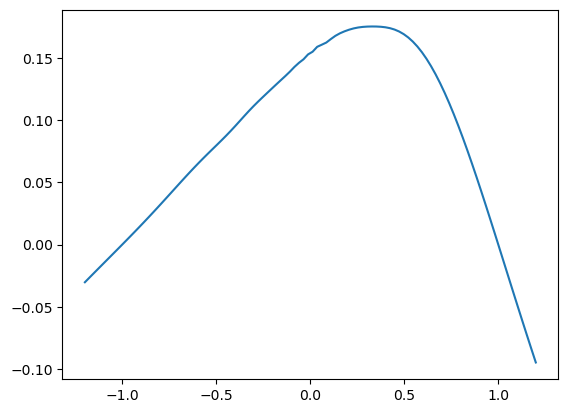

Epoch 2000 with loss 0.0001255363313248381


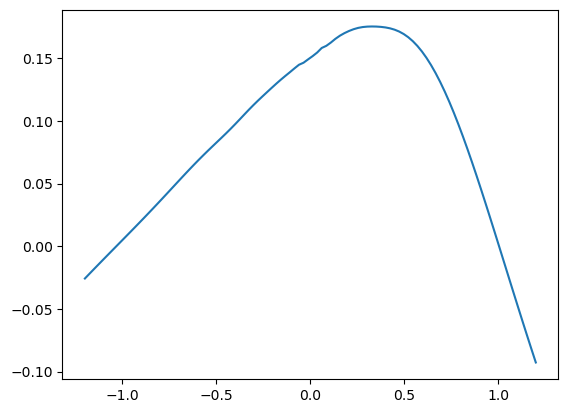

Epoch 2500 with loss 5.2582789066946134e-05


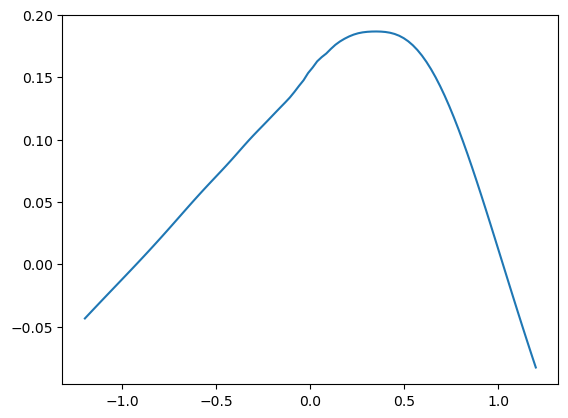

Epoch 3000 with loss 0.00013491256686393172


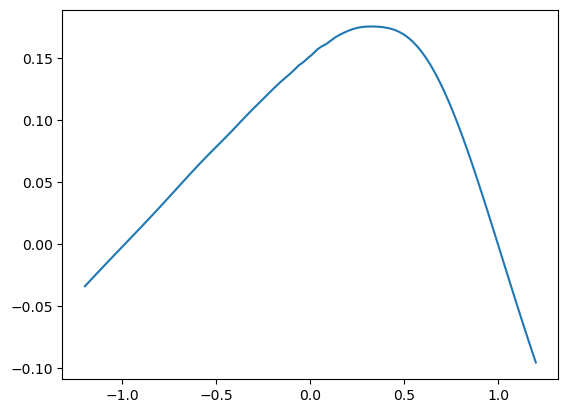

Epoch 3500 with loss 4.2623090848792344e-05


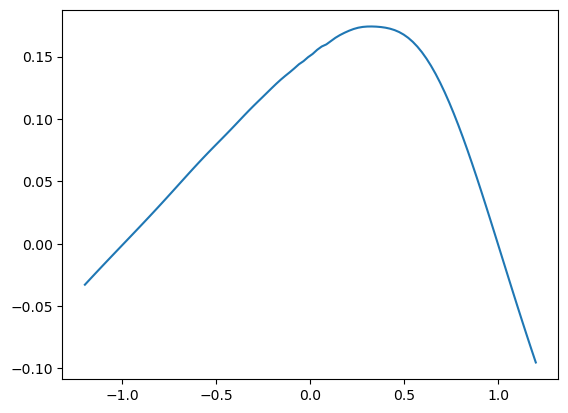

Epoch 4000 with loss 3.0866849556332454e-05


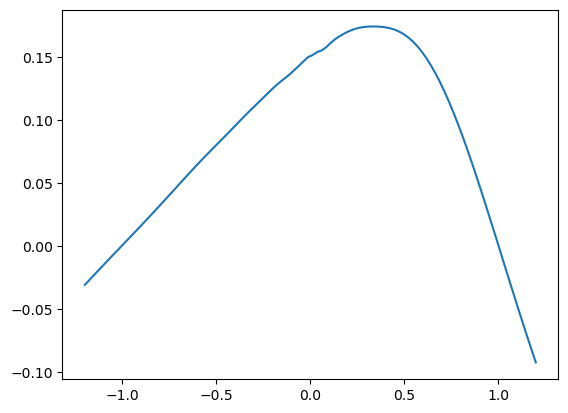

Epoch 4500 with loss 2.5995042960857973e-05


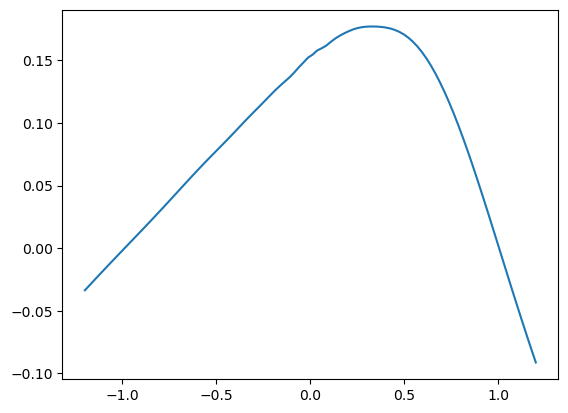

Epoch 4999 with loss 3.040193951164838e-05
Training of neural network with 5000 epochs take 230.87673807144165 seconds.
Time taken: 231 seconds; L1 error: 4.62E-03; L2 error: 3.64E-05; rel error: INF.




######## Summary for deep branching method
runtime:        354
fdb runtime:    123
total runtime:  477
mean L1 error:  3.38E-03
std L1 error:   0.00E+00
mean L2 error:  2.14E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        713
mean L1 error:  3.46E-02
std L1 error:   0.00E+00
mean L2 error:  1.58E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        231
mean L1 error:  4.62E-03
std L1 error:   0.00E+00
mean L2 error:  3.64E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


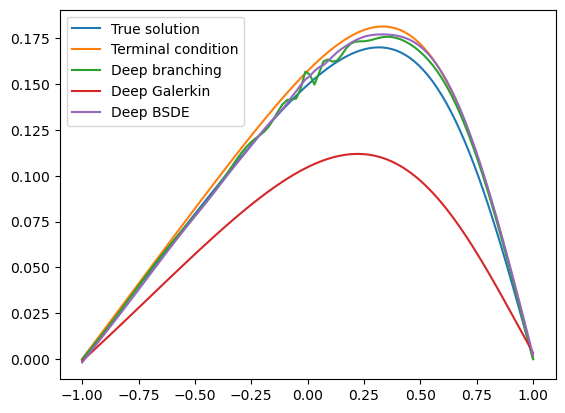

In [13]:
dim = 8
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True,  
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 9

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 592.1164140701294 seconds.
Patch  0: epoch    0 with loss 1.04E+00


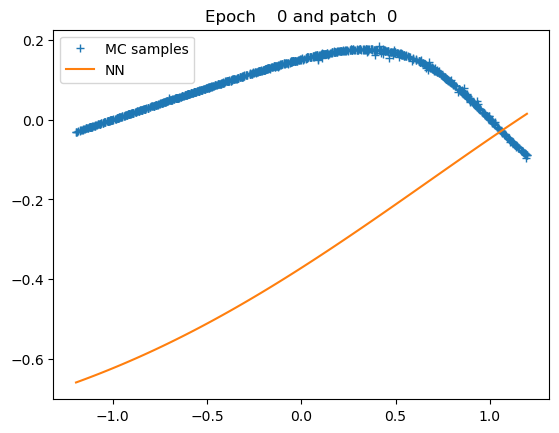

Patch  0: epoch  500 with loss 5.58E-06


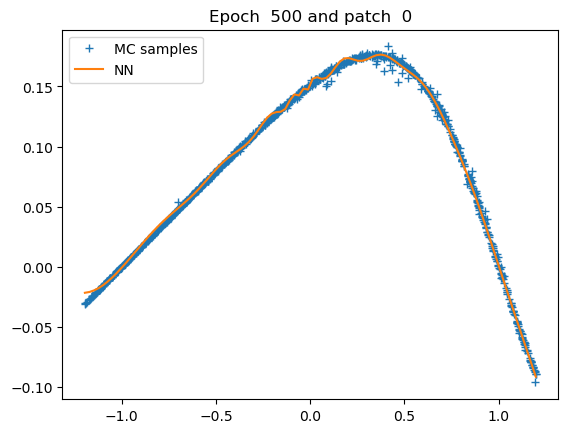

Patch  0: epoch 1000 with loss 4.74E-06


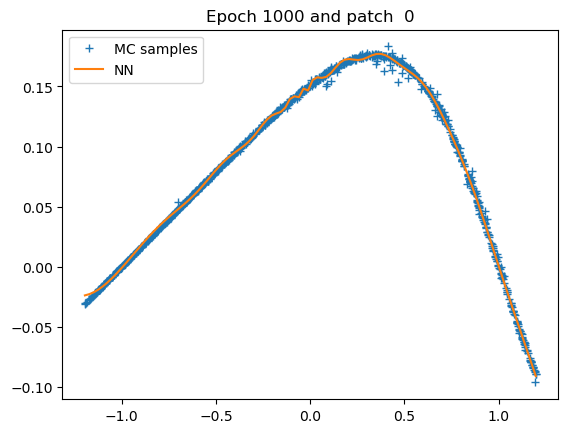

Patch  0: epoch 1500 with loss 4.66E-06


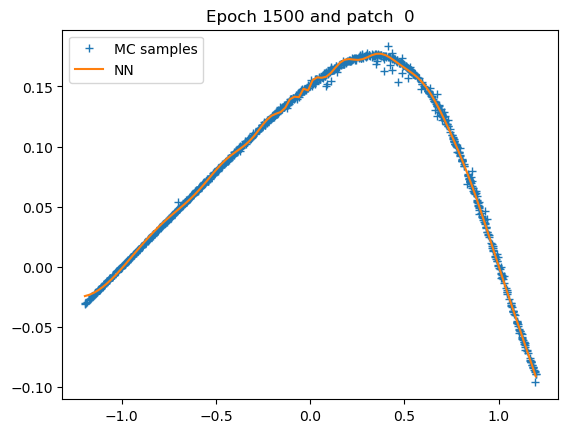

Patch  0: epoch 2000 with loss 4.57E-06


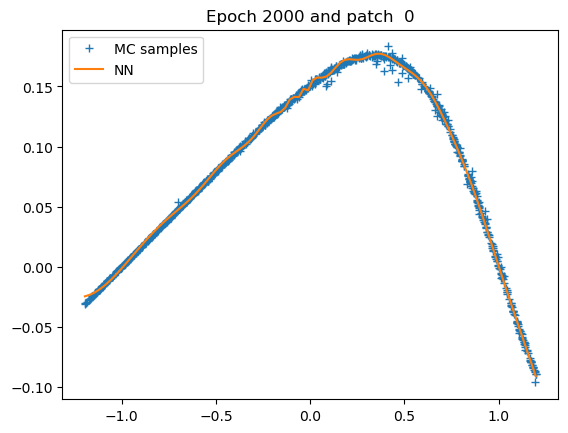

Patch  0: epoch 2500 with loss 4.56E-06


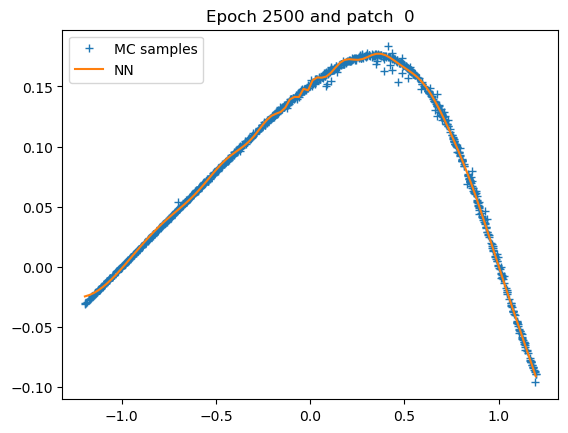

Patch  0: epoch 3000 with loss 4.55E-06


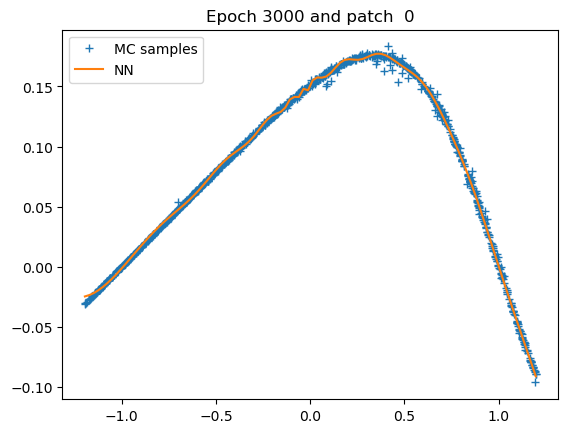

Patch  0: epoch 3500 with loss 4.53E-06


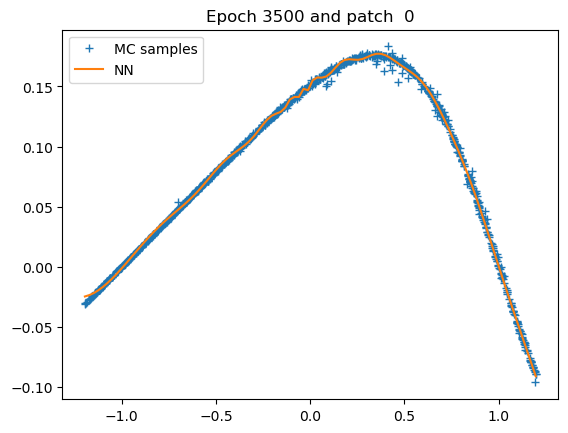

Patch  0: epoch 4000 with loss 4.51E-06


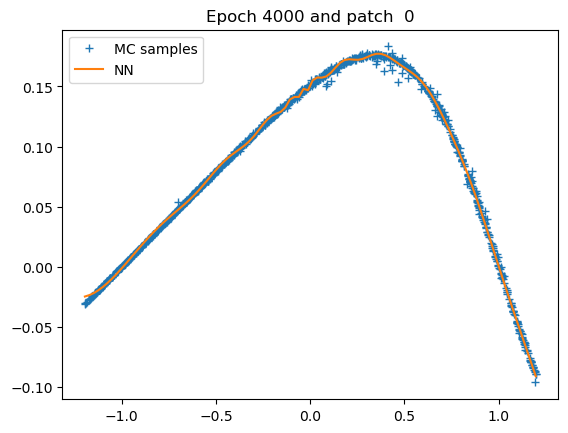

Patch  0: epoch 4500 with loss 4.48E-06


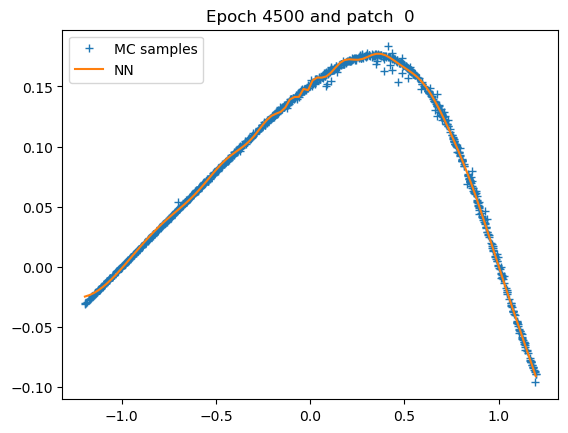

Patch  0: epoch 4999 with loss 4.44E-06


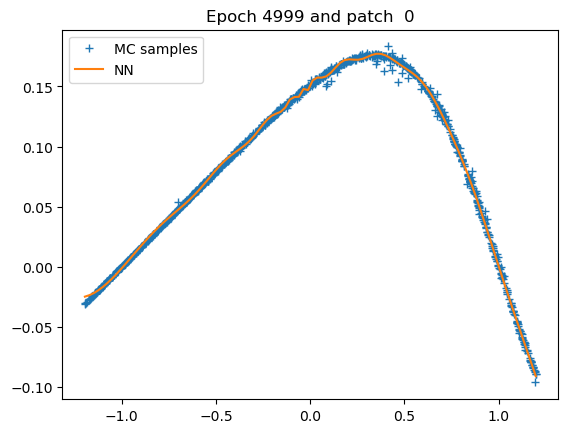

Patch 0: training of u with 5000 epochs take 41.75500774383545 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 441 seconds; L1 error: 3.39E-03; L2 error: 1.98E-05; rel error: INF.
fdb runtime: 195 seconds; total runtime: 636 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


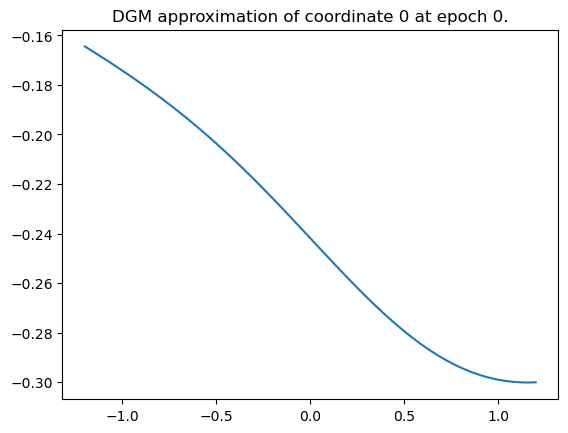

Epoch 0 with loss 0.5590869784355164


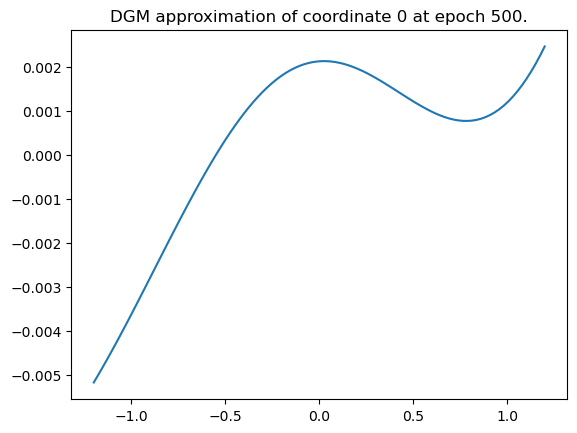

Epoch 500 with loss 0.015426560305058956


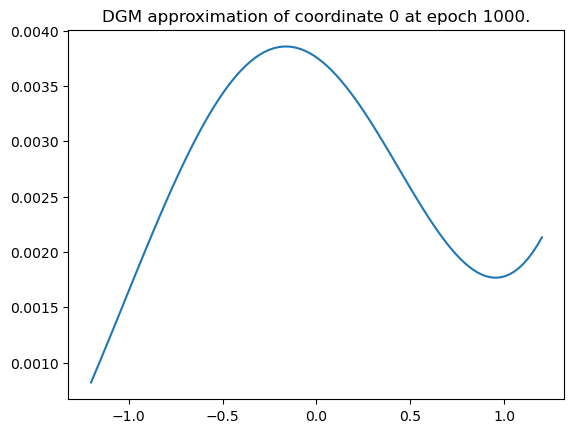

Epoch 1000 with loss 0.015475151129066944


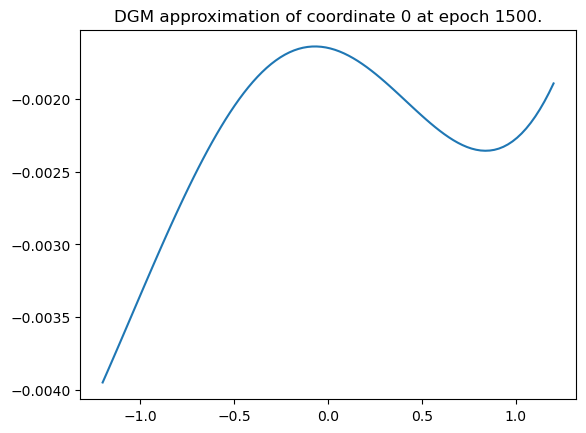

Epoch 1500 with loss 0.015326404944062233


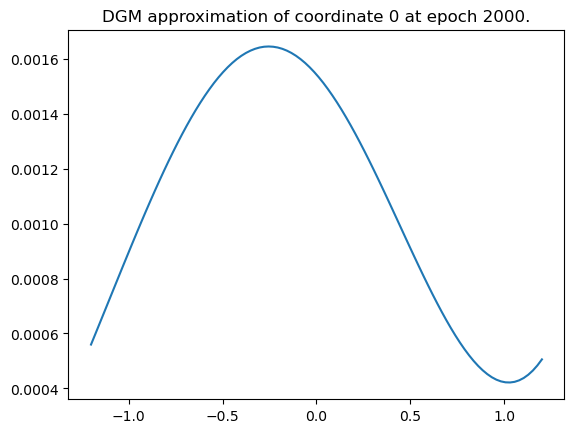

Epoch 2000 with loss 0.015088984742760658


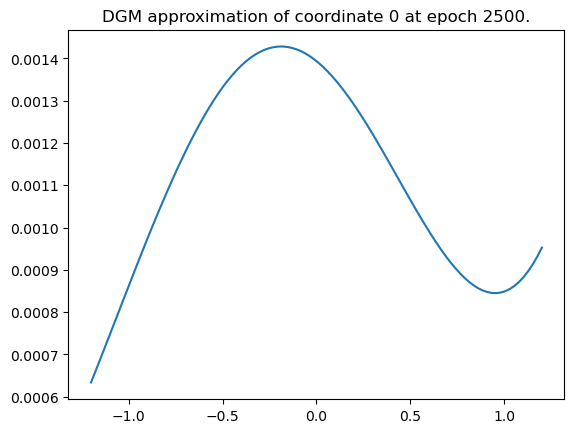

Epoch 2500 with loss 0.015180140733718872


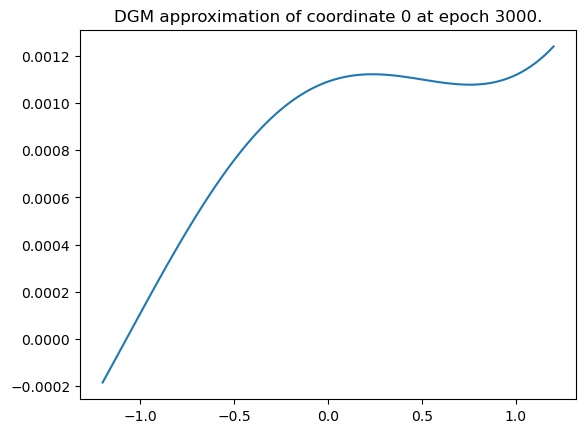

Epoch 3000 with loss 0.015307637862861156


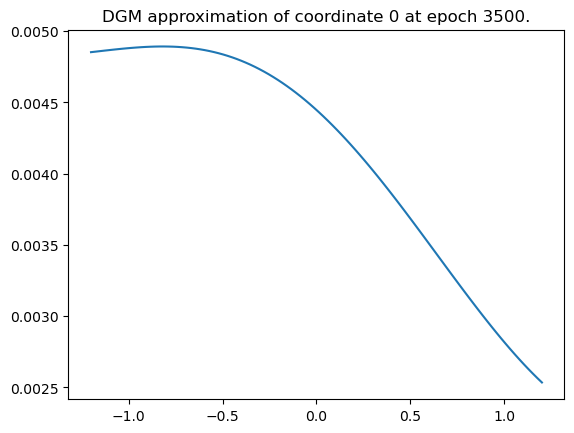

Epoch 3500 with loss 0.015314221382141113


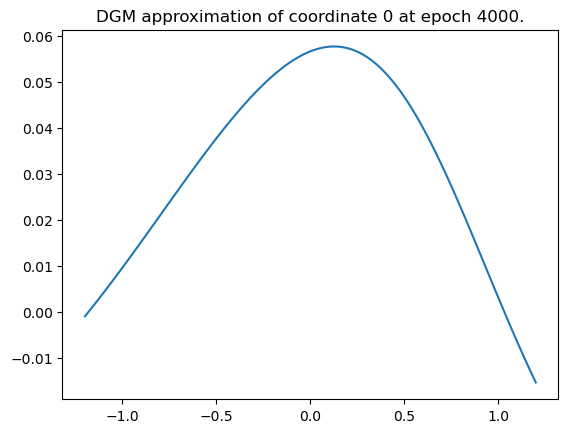

Epoch 4000 with loss 0.011364071629941463


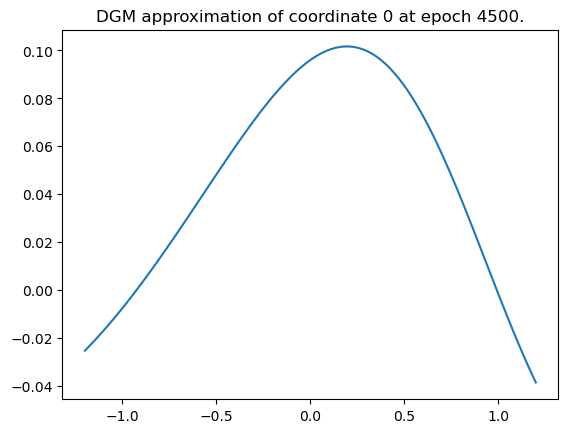

Epoch 4500 with loss 0.008514700457453728


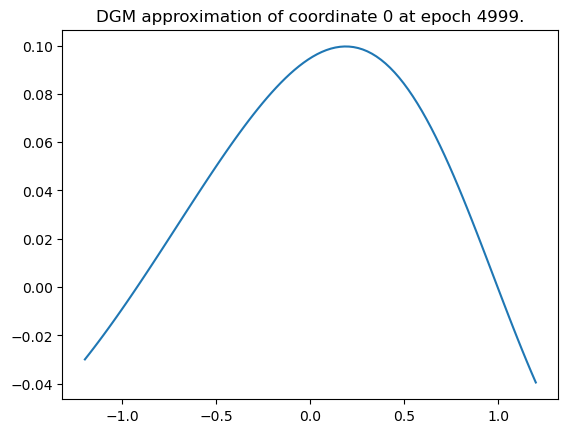

Epoch 4999 with loss 0.008095026016235352
Training of neural network with 5000 epochs take 796.7783975601196 seconds.


Time taken: 797 seconds; L1 error: 4.37E-02; L2 error: 2.39E-03; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


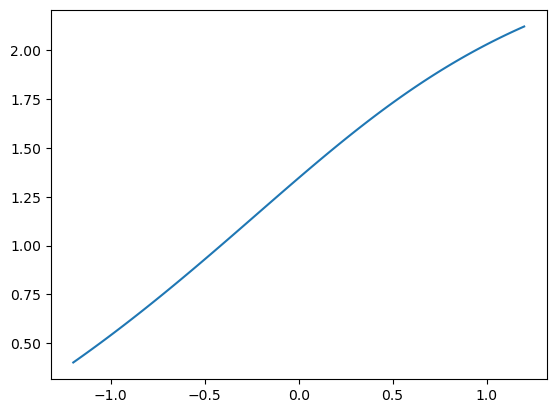

Epoch 0 with loss 0.7438547611236572


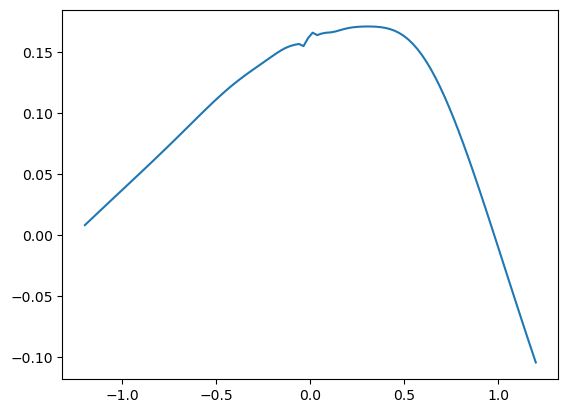

Epoch 500 with loss 0.00017757560999598354


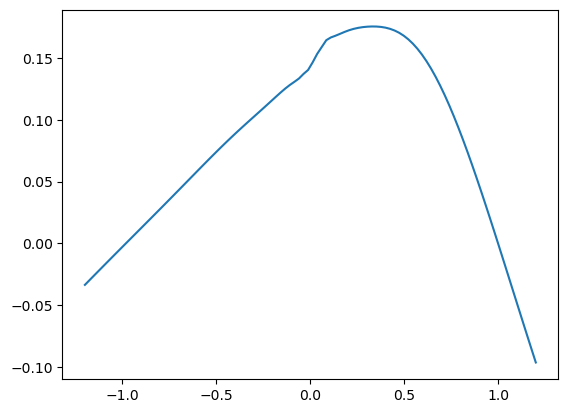

Epoch 1000 with loss 0.0005288384272716939


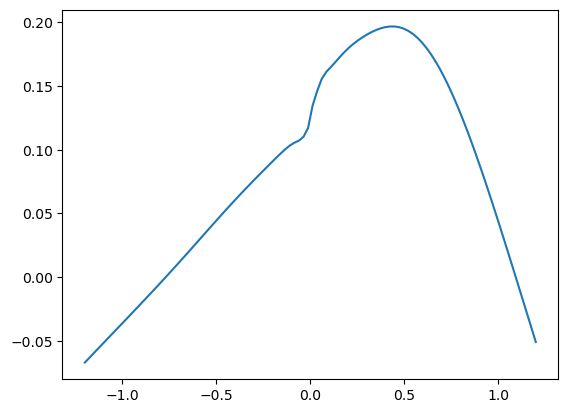

Epoch 1500 with loss 0.0005781266954727471


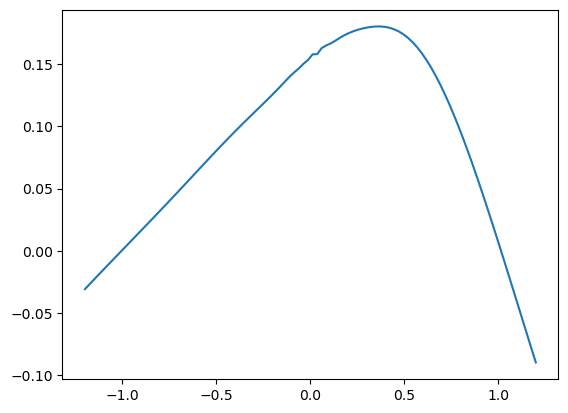

Epoch 2000 with loss 8.316463936353102e-05


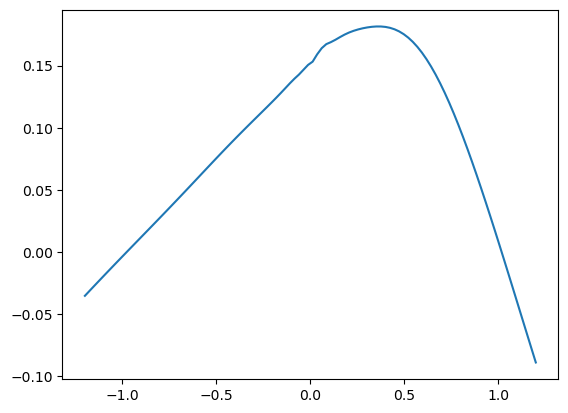

Epoch 2500 with loss 5.2487019274849445e-05


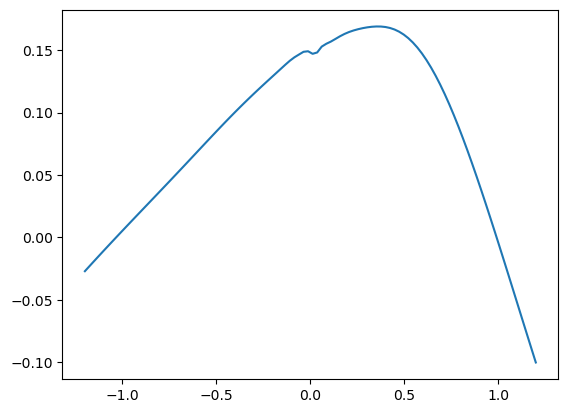

Epoch 3000 with loss 6.966237560845912e-05


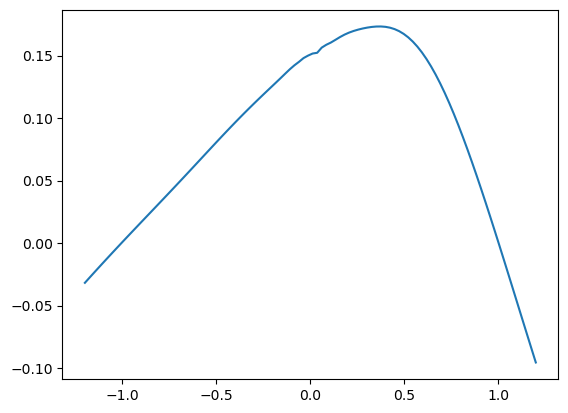

Epoch 3500 with loss 4.848790558753535e-05


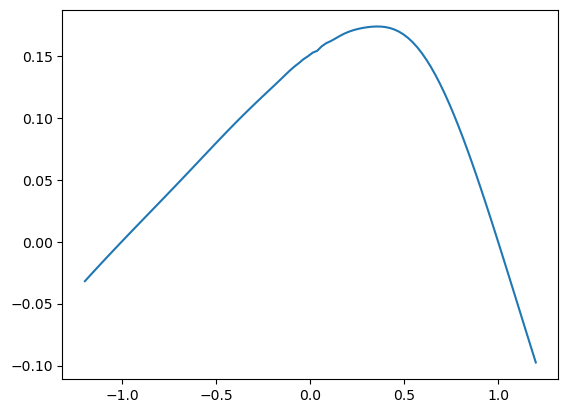

Epoch 4000 with loss 3.810786802205257e-05


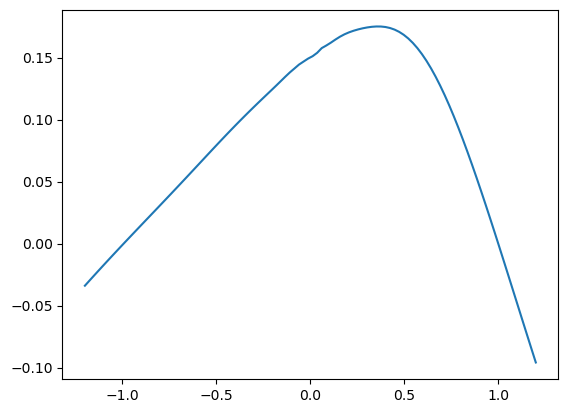

Epoch 4500 with loss 4.2052077333210036e-05


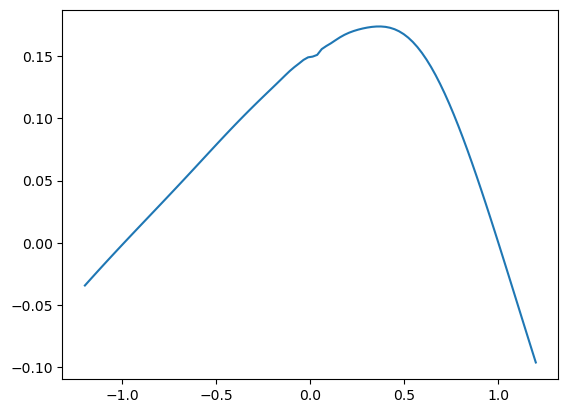

Epoch 4999 with loss 4.620334584615193e-05
Training of neural network with 5000 epochs take 222.70052123069763 seconds.
Time taken: 223 seconds; L1 error: 2.61E-03; L2 error: 1.35E-05; rel error: INF.




######## Summary for deep branching method
runtime:        441
fdb runtime:    195
total runtime:  636
mean L1 error:  3.39E-03
std L1 error:   0.00E+00
mean L2 error:  1.98E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        797
mean L1 error:  4.37E-02
std L1 error:   0.00E+00
mean L2 error:  2.39E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        223
mean L1 error:  2.61E-03
std L1 error:   0.00E+00
mean L2 error:  1.35E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


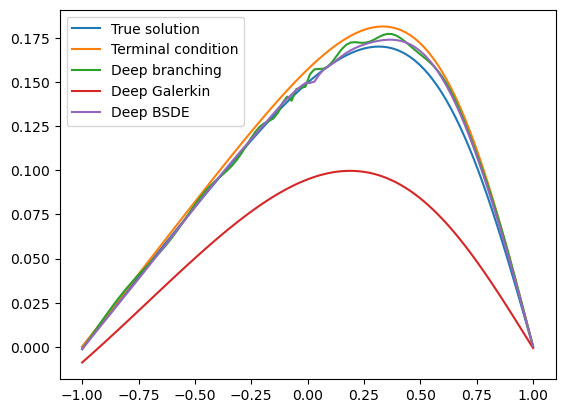

In [14]:
dim = 9
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True,  
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 10

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 993.3397154808044 seconds.
Patch  0: epoch    0 with loss 7.06E-01


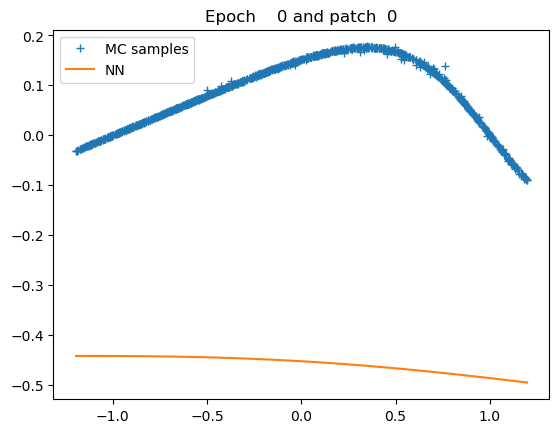

Patch  0: epoch  500 with loss 6.42E-06


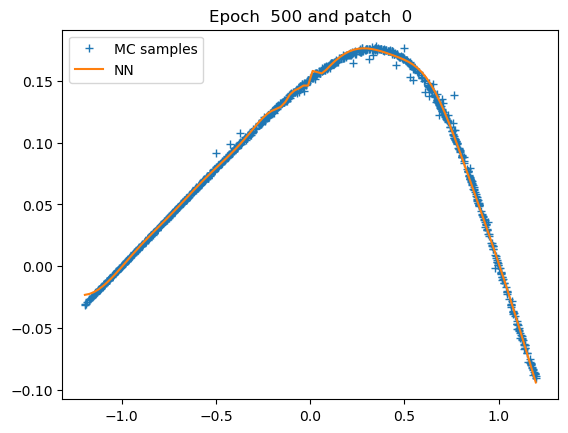

Patch  0: epoch 1000 with loss 3.99E-06


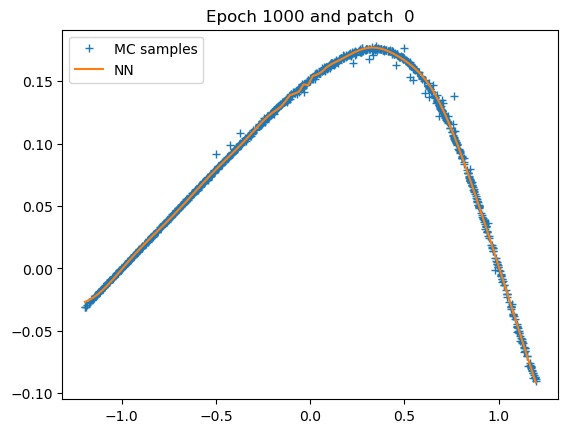

Patch  0: epoch 1500 with loss 3.91E-06


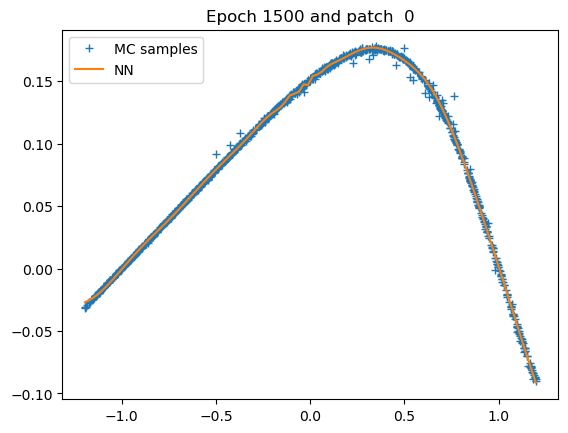

Patch  0: epoch 2000 with loss 3.84E-06


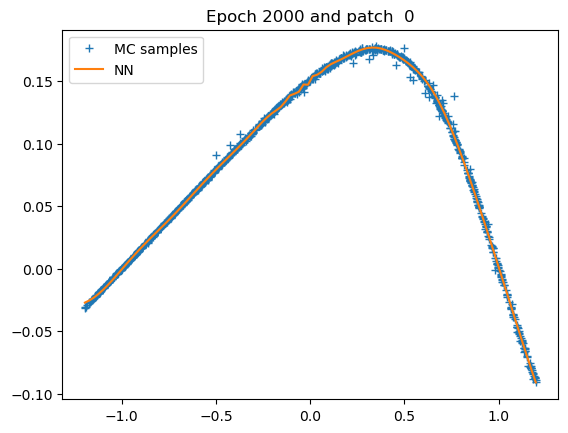

Patch  0: epoch 2500 with loss 3.83E-06


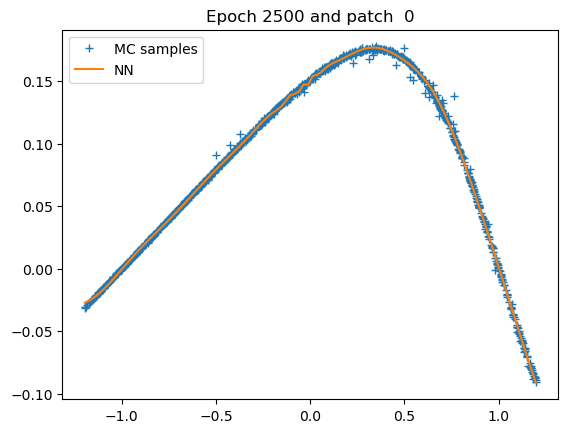

Patch  0: epoch 3000 with loss 3.82E-06


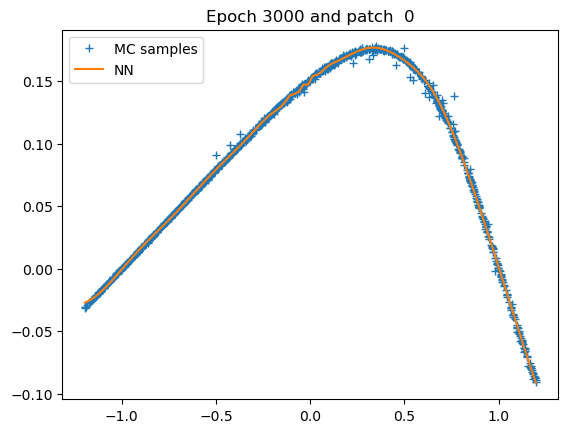

Patch  0: epoch 3500 with loss 3.80E-06


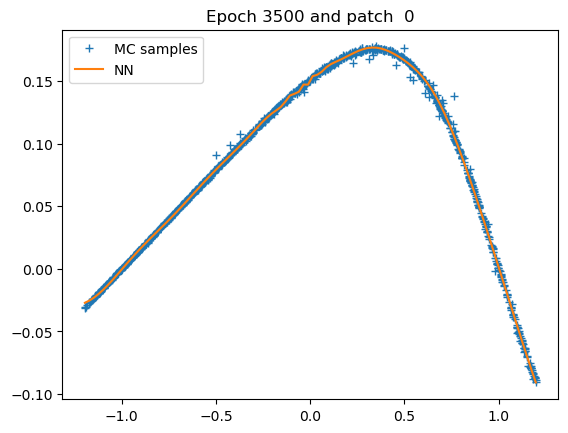

Patch  0: epoch 4000 with loss 3.79E-06


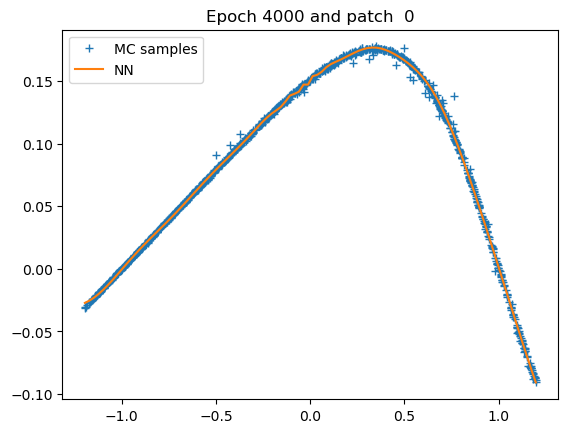

Patch  0: epoch 4500 with loss 3.77E-06


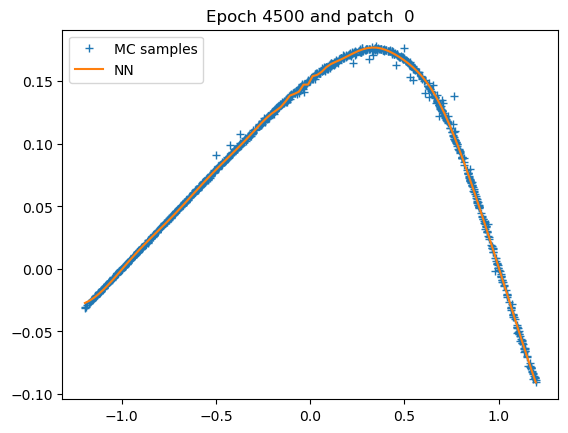

Patch  0: epoch 4999 with loss 3.74E-06


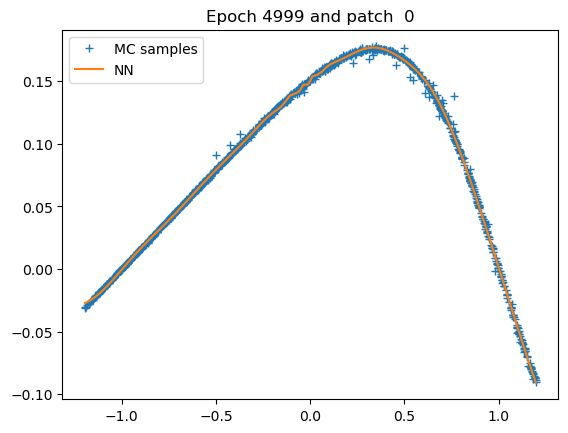

Patch 0: training of u with 5000 epochs take 37.958616971969604 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 566 seconds; L1 error: 3.20E-03; L2 error: 2.16E-05; rel error: INF.
fdb runtime: 468 seconds; total runtime: 1034 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


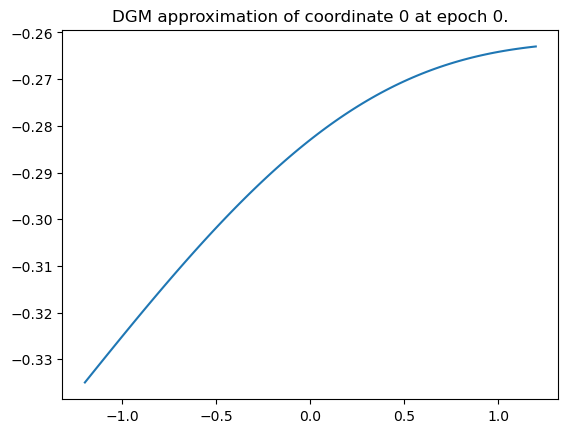

Epoch 0 with loss 0.9339234828948975


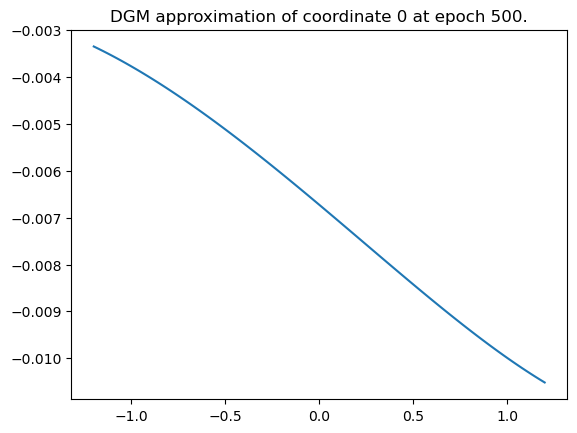

Epoch 500 with loss 0.015615466050803661


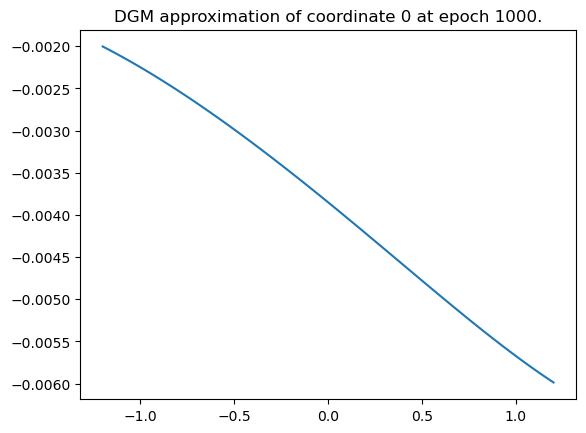

Epoch 1000 with loss 0.015517323277890682


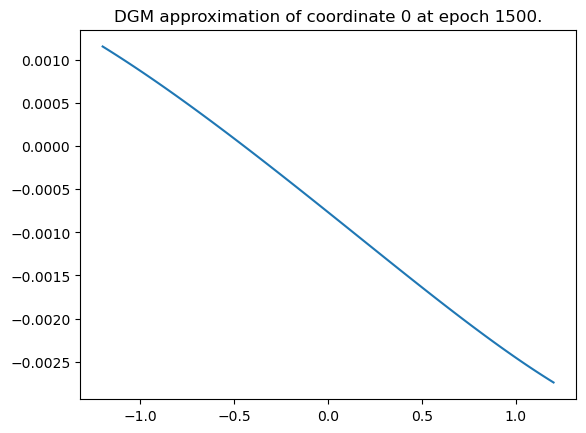

Epoch 1500 with loss 0.015356636606156826


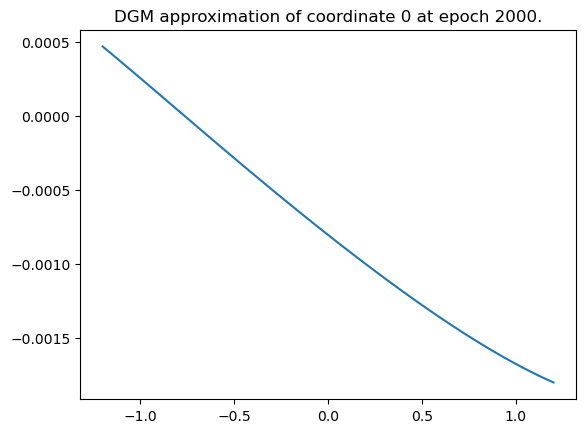

Epoch 2000 with loss 0.015420952811837196


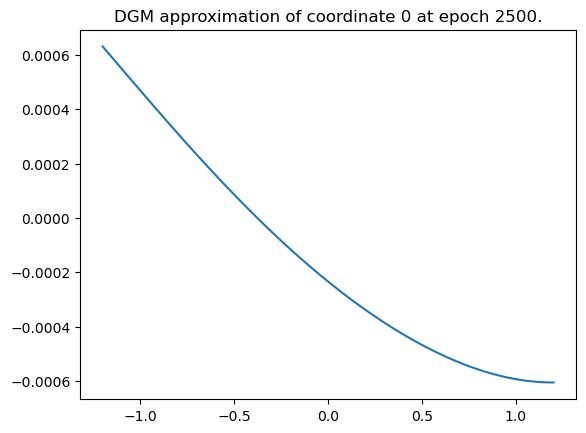

Epoch 2500 with loss 0.015292786061763763


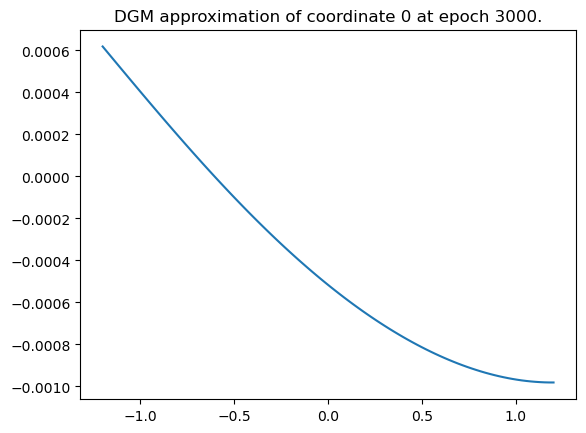

Epoch 3000 with loss 0.015295922756195068


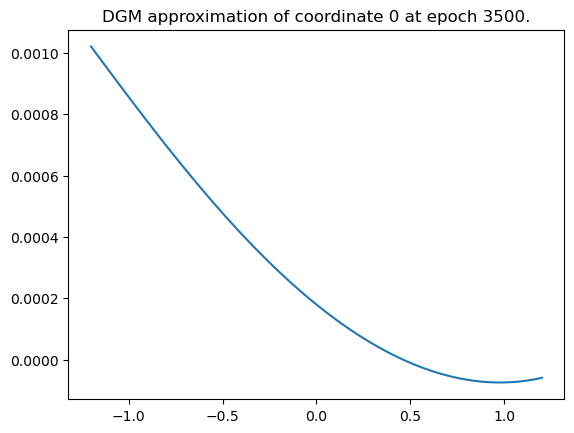

Epoch 3500 with loss 0.015305610373616219


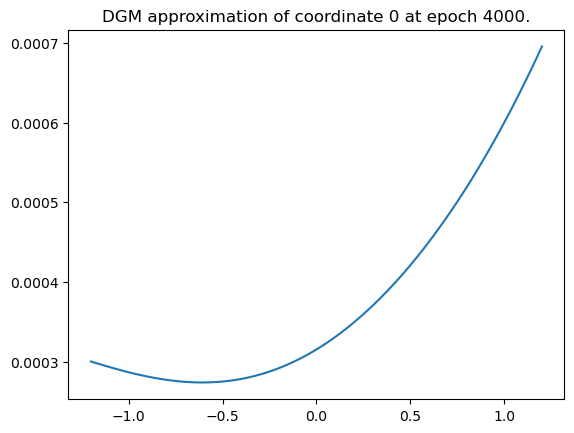

Epoch 4000 with loss 0.015054652467370033


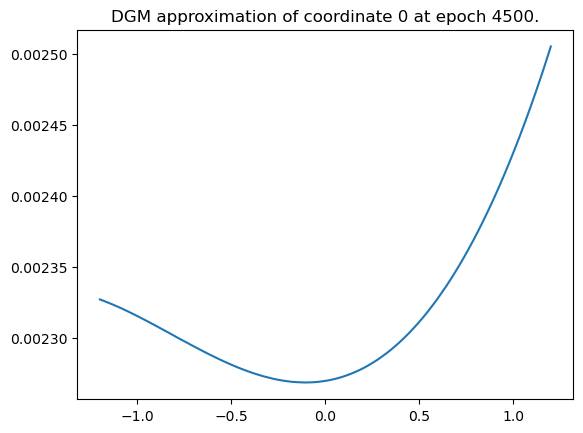

Epoch 4500 with loss 0.015067707747220993


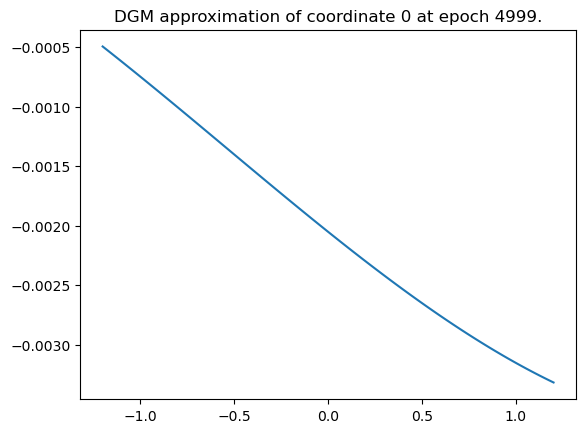

Epoch 4999 with loss 0.015264707617461681
Training of neural network with 5000 epochs take 888.5818812847137 seconds.


Time taken: 889 seconds; L1 error: 1.05E-01; L2 error: 1.38E-02; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


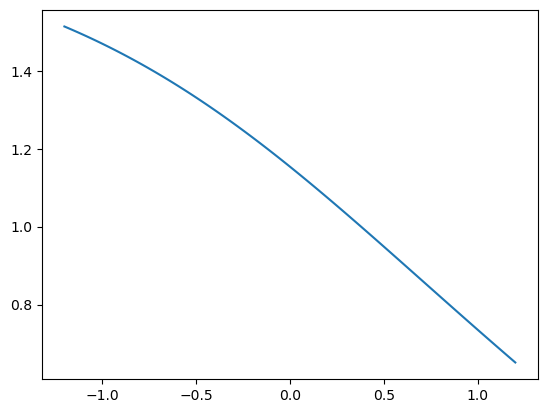

Epoch 0 with loss 0.8610029816627502


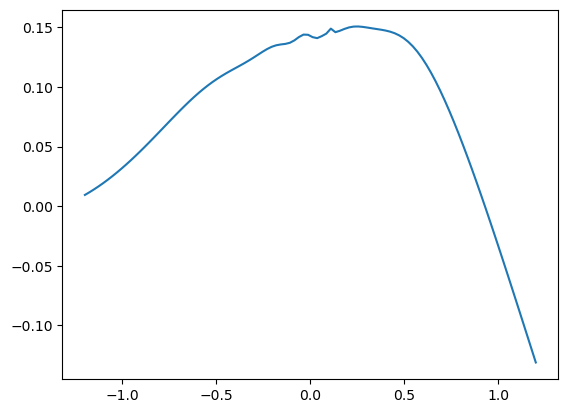

Epoch 500 with loss 0.00012167319800937548


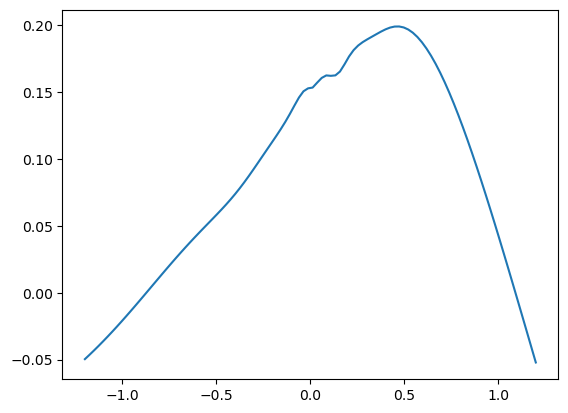

Epoch 1000 with loss 0.00031158633646555245


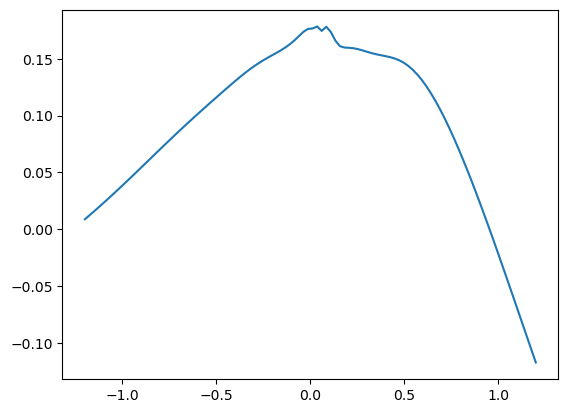

Epoch 1500 with loss 0.0005808882997371256


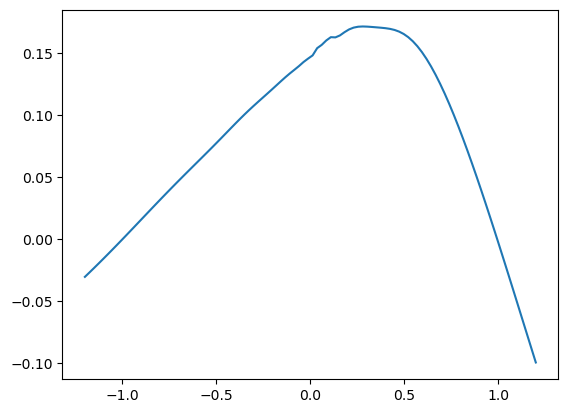

Epoch 2000 with loss 0.0001066712211468257


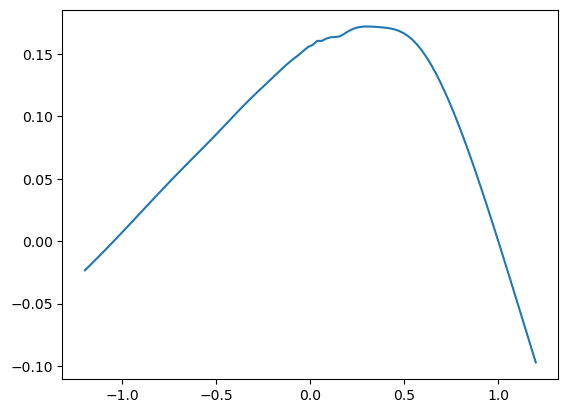

Epoch 2500 with loss 4.764259938383475e-05


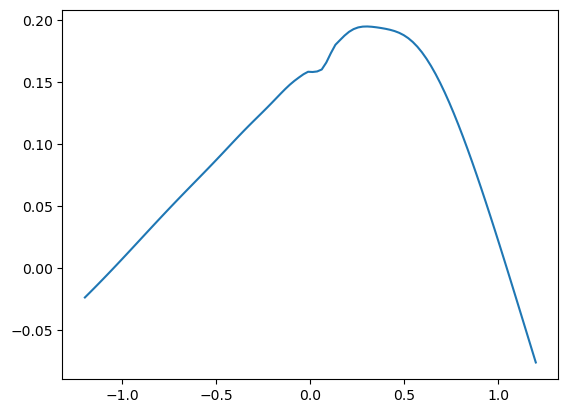

Epoch 3000 with loss 5.931964187766425e-05


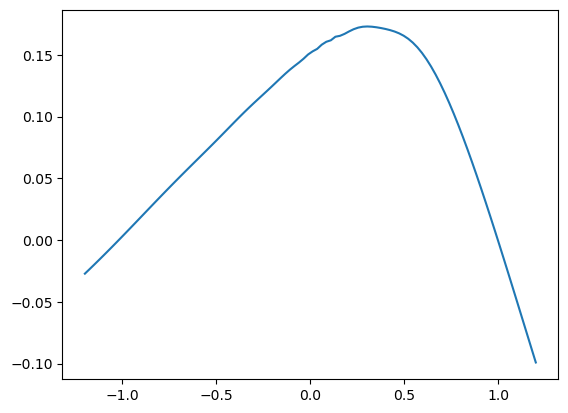

Epoch 3500 with loss 3.854323222185485e-05


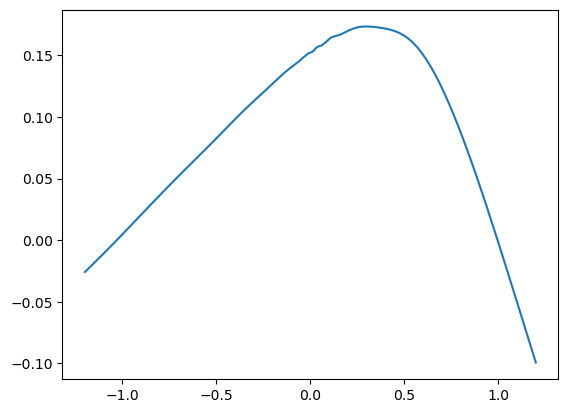

Epoch 4000 with loss 3.966625808971003e-05


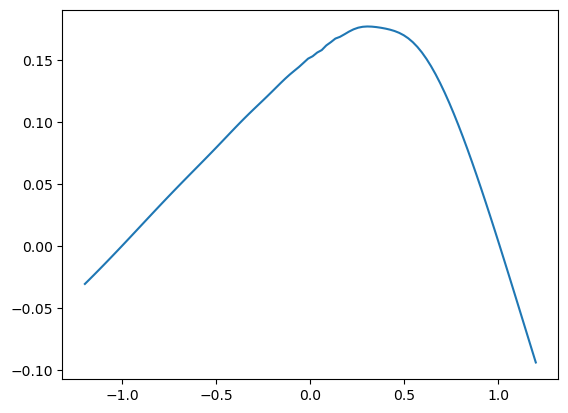

Epoch 4500 with loss 3.0005247026565485e-05


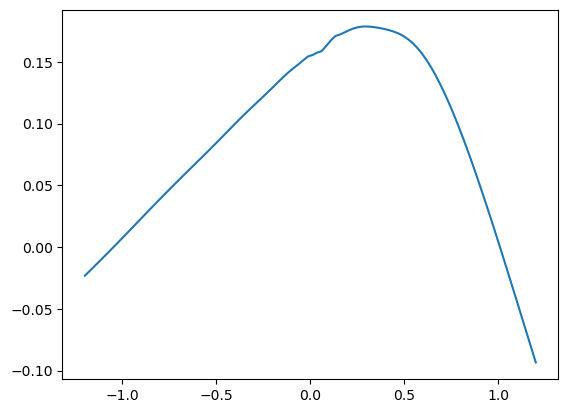

Epoch 4999 with loss 5.289431646815501e-05
Training of neural network with 5000 epochs take 234.41343188285828 seconds.
Time taken: 234 seconds; L1 error: 7.39E-03; L2 error: 5.96E-05; rel error: INF.




######## Summary for deep branching method
runtime:        566
fdb runtime:    468
total runtime:  1034
mean L1 error:  3.20E-03
std L1 error:   0.00E+00
mean L2 error:  2.16E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        889
mean L1 error:  1.05E-01
std L1 error:   0.00E+00
mean L2 error:  1.38E-02
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        234
mean L1 error:  7.39E-03
std L1 error:   0.00E+00
mean L2 error:  5.96E-05
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


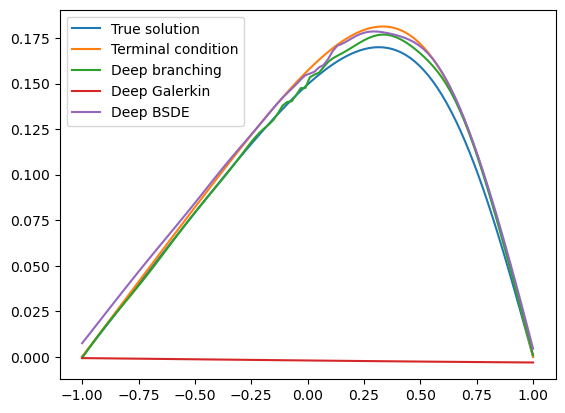

In [15]:
dim = 10
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)